In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
%matplotlib inline
import matplotlib.pyplot as plt

import sys 
import inspect
import seaborn as sns
import os
import copy

import perturbseq as perturb

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.1 umap==0.4.4 numpy==1.17.2 scipy==1.4.1 pandas==0.24.2 scikit-learn==0.22 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.8.1


In [2]:
PROTEIN='KRAS'
DATA='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2020-02-14'
SUBSAMPLED=DATA+'/'+PROTEIN+'/subsampled/A549.'+PROTEIN

counts=20000

FIGS=DATA+'/2020-09-15_Figures/'
os.system('mkdir -p '+FIGS)
print(FIGS)

sc.settings.figdir=FIGS

/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2020-02-14/2020-09-15_Figures/


In [3]:
FDR=0.01
#original anno
ANNO=DATA+'/'+PROTEIN+'/anno'
anno=pd.read_csv(ANNO+'/'+PROTEIN+'.anno.withresults.csv',sep='\t',index_col=0)
anno=anno.loc[anno['Library_synthesis']=='in',:]

anno.columns


Index(['Variant.1', 'Variant.1.1', 'Position', 'From', 'To', 'mutation_type',
       'Count_pancan', 'Count_ExAC', 'control_status', 'control_color',
       'Library_synthesis', 'long_name', 'control_status2', 'text_color',
       'HotellingT2', 'FDR.HotellingT2', 'cluster_color', 'Z-Low-D7',
       'Z-Low-D14', 'Cells/variant', 'variant expression',
       'variant_expression', 'Control', 'Cluster', 'Cluster2'],
      dtype='object')

In [4]:
sorted_variants_df=pd.read_csv(DATA+'/'+PROTEIN+'/clustering/'+PROTEIN+'.corrL1.sorted_variants.csv',header=None)
sorted_variants=list(sorted_variants_df[0])
print(sorted_variants)

['M111L', 'T127T', 'V112I', 'R149K', 'S17S', 'T74T', 'I163S', 'G75A', 'K147N', 'G77A', 'K88K', 'WT', 'A155G', 'Y166H', 'K176Q', 'T144T', 'C118S', 'T158T', 'A130V', 'D30D', 'K179R', 'S136N', 'T158A', 'T20T', 'D173D', 'V8V', 'A66A', 'M170L', 'K169K', 'T50T', 'R135T', 'F141L', 'R164Q', 'P110S', 'K178K', 'L159S', 'L79I', 'Q25H', 'K147T', 'E63K', 'V14I', 'T50I', 'T50P', 'E31K', 'Q99E', 'R41K', 'T20R', 'Q22H', 'C185Y', 'T20M', 'T144P', 'L52F', 'T74A', 'D57N', 'unassigned', 'N26Y', 'D33E', 'L19F', 'Q61K', 'P34L', 'K5E', 'P34R', 'G60D', 'Q61P', 'G60S', 'G60V', 'R68S', 'I36M', 'T58I', 'Q22K', 'K117R', 'A59T', 'AG59GV', 'D119G', 'G12Y', 'G12F', 'V14L', 'A59E', 'G12S', 'G12A', 'A59G', 'A146V', 'G13C', 'G12C', 'A146P', 'A146T', 'G12V', 'AG11TD', 'G12D', 'G12I', 'G12R', 'Q61A', 'Q61H', 'Q61R', 'Q61L', 'G13E', 'K117N', 'G13V', 'G13R']


In [5]:


f='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2019-06-07/KRAS/mutational_signatures/KRAS_mutationalSignatures_Andrew.txt'
mutsig=pd.read_csv(f,sep='\t')
mutsig.index=mutsig['Mutation']
print(mutsig.head())
print(mutsig.columns)

#modify the names for the synonymous ones
import re
new_vars=[]
for i in range(mutsig.shape[0]):
    v=mutsig.index[i]
    new_var_here=v
    if 'B' in v:
        new_var_here=re.sub('B',v[0],v)
    new_vars.append(new_var_here)
mutsig.index=new_vars


          Position WT AA Final AA Mutation  COSMIC  Day0 Reads  Z-Low-D7  \
Mutation                                                                   
G12D            12     G        D     G12D  Single      1756.3      7.30   
G12V            12     G        V     G12V  Single      1803.0      6.88   
G12C            12     G        C     G12C  Single      2495.7      5.55   
G13D            13     G        D     G13D  Single      3388.3      5.68   
G12A            12     G        A     G12A  Single       922.0      3.28   

          Z-Low-D14  Z-High-D7  Z-High-D14  ...  Signature_21  Signature_22  \
Mutation                                    ...                               
G12D           6.41       2.47        4.21  ...        0.0062      0.001525   
G12V           5.89       2.57        4.08  ...        0.0007      0.002451   
G12C           4.74       1.86        2.41  ...        0.0020      0.004550   
G13D           4.90       1.81        3.21  ...        0.0392      0.003

In [6]:
for c in ['Z-Low-D7','Z-Low-D14','COSMIC.1']:
    anno[c]=mutsig.loc[anno.index,c]

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [7]:
#check which of our variants are in the Giacomelli dataset
overlapping=set(mutsig.index).intersection(set(anno.index))
print('variants in',len(overlapping))
print(overlapping)
missed=set(anno.index).difference(set(mutsig.index))
print('variants not in',len(missed))
print(missed)

variants in 94
{'N26Y', 'A155G', 'T74T', 'T50T', 'R135T', 'V14L', 'G12F', 'T127T', 'T50I', 'G13E', 'E63K', 'T144T', 'K179R', 'Q61K', 'A59E', 'K5E', 'P110S', 'R68S', 'D30D', 'T50P', 'G13R', 'G60D', 'T158A', 'I163S', 'G60S', 'P34R', 'G12A', 'S136N', 'G12S', 'L19F', 'A130V', 'G13C', 'L79I', 'T144P', 'K147N', 'Q61L', 'D33E', 'Q61H', 'Q61P', 'K117N', 'M111L', 'G75A', 'K88K', 'K147T', 'I36M', 'G12Y', 'T58I', 'P34L', 'T20T', 'M170L', 'T20M', 'R149K', 'R41K', 'D57N', 'K178K', 'Q22H', 'Q25H', 'K117R', 'T20R', 'G12C', 'V8V', 'F141L', 'A146V', 'T74A', 'D173D', 'A59T', 'Q99E', 'C118S', 'G12V', 'A146T', 'A66A', 'C185Y', 'K176Q', 'R164Q', 'Q61R', 'T158T', 'G12D', 'G13V', 'A59G', 'G12I', 'Q61A', 'A146P', 'K169K', 'L159S', 'L52F', 'V14I', 'D119G', 'G12R', 'Q22K', 'G77A', 'E31K', 'G60V', 'V112I', 'S17S'}
variants not in 4
{'AG11TD', 'Y166H', 'WT', 'AG59GV'}


In [8]:
def fun_scatter(x,y,xname='x',yname='y',width=4,height=4,corrtype='spearman',
                xlim=None,ylim=None,
                **kwargs):
    from scipy.stats import spearmanr, pearsonr
    if corrtype=='spearman':
        corr=spearmanr(x,y,nan_policy='omit')
    if corrtype=='pearson':
        corr=pearsonr(x,y)
    c,p="%.2g" % corr[0],"%.3g" % corr[1]
    fig,plots=plt.subplots(1)
    fig.set_size_inches(width,height)
    plots.scatter(x,y,**kwargs)
    plots.set_xlabel(xname)
    plots.set_ylabel(yname)
    if xlim!=None:
        plots.set_xlim(xlim)
    if ylim!=None:
        plots.set_ylim(ylim)
    plots.set_title(corrtype+':'+str(c)+'\n'+'p:'+str(p))
    


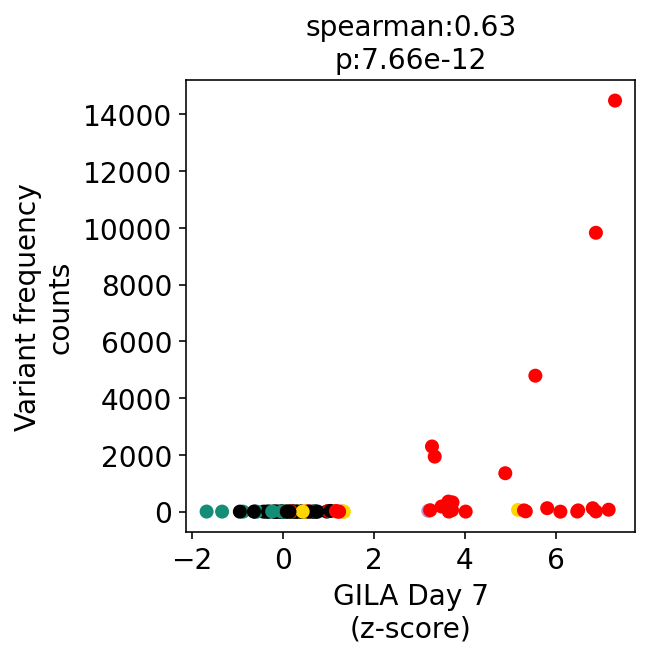

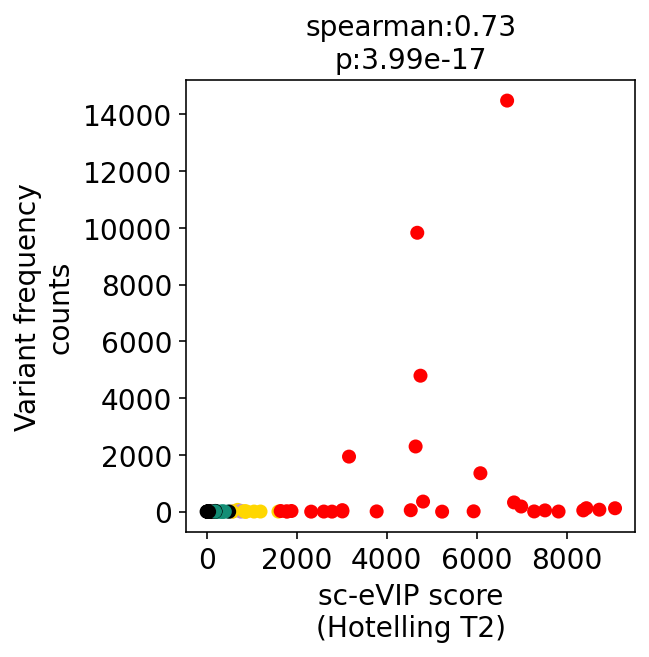

In [9]:
for f1 in ['Z-Low-D7','HotellingT2']:
    mutcount='COSMIC.1'
    fun_scatter(anno.loc[overlapping,f1],
                anno.loc[overlapping,mutcount],
               color=anno.loc[overlapping,'Cluster'],
                xname=f1,yname='log counts',corrtype='spearman')
    plt.grid(False)
    
    plt.ylabel('Variant frequency\ncounts')
    if f1=='HotellingT2':
        plt.xlabel('sc-eVIP score\n(Hotelling T2)')
    if f1=='Z-Low-D7':
        plt.xlabel('GILA Day 7\n(z-score)')
    
    plt.savefig(FIGS+'/'+PROTEIN+'.'+f1+'_vs_mutfreq.counts.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.'+f1+'_vs_mutfreq.counts.png',bbox_inches = "tight")
    plt.show()

In [10]:
#restrict to variants with features. excludes synonymous variants
f='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2019-06-07/KRAS/mutational_signatures/KRAS_mutationalSignatures_Andrew.txt'
mutsig_init=pd.read_csv(f,sep='\t')
mutsig_init.index=mutsig_init['Mutation']
mutsig_restricted=mutsig_init.dropna(axis='index')####### remove items without mutational signatures

print(mutsig_restricted.head())
print(mutsig_restricted.shape)


          Position WT AA Final AA Mutation  COSMIC  Day0 Reads  Z-Low-D7  \
Mutation                                                                   
G12D            12     G        D     G12D  Single      1756.3      7.30   
G12V            12     G        V     G12V  Single      1803.0      6.88   
G12C            12     G        C     G12C  Single      2495.7      5.55   
G13D            13     G        D     G13D  Single      3388.3      5.68   
G12A            12     G        A     G12A  Single       922.0      3.28   

          Z-Low-D14  Z-High-D7  Z-High-D14  ...  Signature_21  Signature_22  \
Mutation                                    ...                               
G12D           6.41       2.47        4.21  ...        0.0062      0.001525   
G12V           5.89       2.57        4.08  ...        0.0007      0.002451   
G12C           4.74       1.86        2.41  ...        0.0020      0.004550   
G13D           4.90       1.81        3.21  ...        0.0392      0.003

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


       Count_pancan  effect size cluster_color
M111L           2.0    30.353144         black
T127T           NaN    35.268861         black
V112I           NaN    30.338702         black
R149K           2.0    48.378746         black
S17S            NaN    55.937139         black


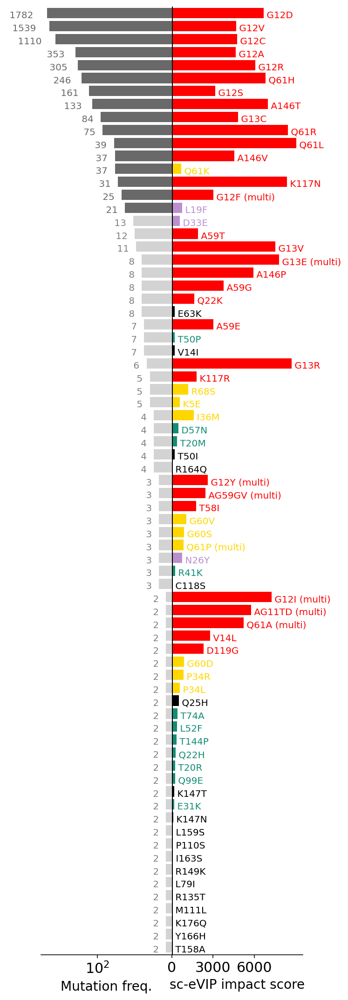

In [11]:
#effect size vs mut freq

#plot impact score vs mutation frequency

#- get the data
score='HotellingT2'
mutdata=pd.DataFrame({'Count_pancan':anno.loc[sorted_variants,'Count_pancan'],
                     'effect size':anno.loc[sorted_variants,score],
                     'cluster_color':anno.loc[sorted_variants,'Cluster']},
                    index=sorted_variants)
print(mutdata.head())
mutdata=mutdata.dropna(subset=['Count_pancan'])
mutdata=mutdata.sort_values(by=['Count_pancan','effect size'])
mutdata['Count_pancan']=pd.DataFrame(mutdata['Count_pancan'],dtype=float)
mutdata['color_mutant_freq']='lightgray'
mutdata.loc[mutdata['Count_pancan']>=20,'color_mutant_freq']='dimgray'

#- make the plot
multiply_impact_score=1

fig,plots=plt.subplots(1,2)
fig.set_size_inches(5,18)
fig.subplots_adjust(wspace=0, hspace=0)

plots[1].barh(mutdata.index,
           mutdata['effect size']*multiply_impact_score,
           color=mutdata['cluster_color'])

plots[0].barh(mutdata.index,
           mutdata['Count_pancan'],
          color=mutdata['color_mutant_freq'])
plots[0].set_xscale('log')
plots[0].invert_xaxis()

plots[1].axvline(x=0,color='black')
for i in range(2):
    plots[i].set_ylim(-0.6,mutdata.shape[0]-0.5)
    plots[i].spines['right'].set_visible(False)
    plots[i].spines['left'].set_visible(False)
    plots[i].spines['top'].set_visible(False)
    plots[i].set_yticks([])
    
#annotate the number of mutations and the variants
n=mutdata.shape[0]
for i in range(n):
    variant=list(mutdata.index)[i]
    effect_size=list(mutdata['effect size'])[i]
    effect_size_plot=multiply_impact_score*effect_size
    effect_size_color=list(mutdata['cluster_color'])[i]
    mutfreq=int(list(mutdata['Count_pancan'])[i])
    mutfreq_plot=mutfreq
    mutfreq_color=list(mutdata['color_mutant_freq'])[i]
    if mutfreq_color=='lightgray':
        mutfreq_color='gray'
    
    if len(str(mutfreq))==1:
        mut_position=mutfreq_plot*2.5
    if len(str(mutfreq))==2:
        mut_position=mutfreq_plot*3.5
    if len(str(mutfreq))==3:
        mut_position=mutfreq_plot*6
    if len(str(mutfreq))==4:
        mut_position=mutfreq_plot*10
    plots[0].text(mut_position,i-0.4,' '+str(int(mutfreq)),
                 color=mutfreq_color)
    
    variant_text=' '+variant
    if anno.loc[variant,'mutation_type']=='Multiple':
        variant_text=variant_text+' (multi)'
    plots[1].text(effect_size_plot,i-0.4,variant_text,
                 color=effect_size_color)
    
plots[1].set_xticks([0,3000,6000])
plots[1].set_xticklabels([0,int(3000.0/multiply_impact_score),
                          int(6000.0/multiply_impact_score)],fontsize=15)
plots[0].tick_params(axis='x', labelsize=15)
plots[0].set_xlabel('Mutation freq.')
plots[1].set_xlabel('sc-eVIP impact score')
plots[0].grid(False)
plots[1].grid(False)


plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.png',bbox_inches = "tight")
plt.show()

Data for the model
===

Keep only variants with mutational signatures annotated. That removed the synonymous variants.

In [12]:
#define data
data=pd.DataFrame(mutsig_restricted)
# need to add HotellingT2
data['HotellingT2']=anno.loc[data.index,'HotellingT2']

#check which of our variants are in the Giacomelli dataset
overlapping=set(mutsig_restricted.index).intersection(set(anno.index))
print('variants in',len(overlapping))
print(overlapping)
missed=set(anno.index).difference(set(mutsig_restricted.index))
print('variants not in',len(missed))
print(missed)

data['has_effsize']=False
data.loc[list(overlapping),'has_effsize']=True

print('Data',data.columns)
print(data.shape)

#keep only thozs with non-zero counts
data=data.loc[data['COSMIC.1']>0,:]
print(data.shape)

variants in 89
{'N26Y', 'A155G', 'T74T', 'T50T', 'R135T', 'V14L', 'T127T', 'T50I', 'E63K', 'T144T', 'K179R', 'Q61K', 'A59E', 'K5E', 'P110S', 'R68S', 'D30D', 'T50P', 'G13R', 'G60D', 'T158A', 'I163S', 'G60S', 'P34R', 'G12A', 'S136N', 'G12S', 'L19F', 'A130V', 'G13C', 'L79I', 'T144P', 'K147N', 'Q61L', 'D33E', 'Q61H', 'Q61P', 'K117N', 'M111L', 'G75A', 'K88K', 'K147T', 'I36M', 'T58I', 'P34L', 'T20T', 'M170L', 'T20M', 'R149K', 'R41K', 'D57N', 'K178K', 'Q22H', 'Q25H', 'K117R', 'T20R', 'G12C', 'V8V', 'F141L', 'A146V', 'T74A', 'D173D', 'A59T', 'Q99E', 'C118S', 'G12V', 'A146T', 'A66A', 'C185Y', 'K176Q', 'R164Q', 'Q61R', 'T158T', 'G12D', 'G13V', 'A59G', 'A146P', 'K169K', 'L159S', 'L52F', 'V14I', 'D119G', 'G12R', 'Q22K', 'G77A', 'E31K', 'G60V', 'V112I', 'S17S'}
variants not in 9
{'G12I', 'Q61A', 'G12F', 'WT', 'AG11TD', 'Y166H', 'G12Y', 'G13E', 'AG59GV'}
Data Index(['Position', 'WT AA', 'Final AA', 'Mutation', 'COSMIC', 'Day0 Reads',
       'Z-Low-D7', 'Z-Low-D14', 'Z-High-D7', 'Z-High-D14', 'Theta-

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [13]:
#===================================================================================

signature_cols=['Signature_1', 'Signature_2', 'Signature_3',
       'Signature_4', 'Signature_5', 'Signature_6', 'Signature_7',
       'Signature_8', 'Signature_9', 'Signature_10', 'Signature_11',
       'Signature_12', 'Signature_13', 'Signature_14', 'Signature_15',
       'Signature_16', 'Signature_17', 'Signature_18', 'Signature_19',
       'Signature_20', 'Signature_21', 'Signature_22', 'Signature_23',
       'Signature_24', 'Signature_25', 'Signature_26', 'Signature_27',
       'Signature_28', 'Signature_29', 'Signature_30']
signature_cols=[]
impact_cols=['HotellingT2']
pheno_cols=['Z-Low-D7']
yname='COSMIC.1'


#record model performances here
performances=pd.DataFrame(columns=['condition','pearson','spearman','r2','fold'])

In [14]:
def get_positions_train_valid(data_pos,rng):
    
    positions=list(set(data_pos))
    train_positions=rng.choice(positions,size=int(len(positions)/2),replace=False)
    
    train_col=[]
    for j in range(len(data_pos)):
        curr_pos=data_pos[j]
        if curr_pos in train_positions:
            train_col.append(True)
        else:
            train_col.append(False)
    return(train_col)

def get_train_valid_datasets(data_here,
                            features,
                            training_pos_col,valid_pos_col,
                         training_y_name,valid_y_name,
                            offset_col=None):
    
    #subset data
    d={}
    d['x_train']=data_here.loc[data_here[training_pos_col]==True,features]
    d['y_train']=data_here.loc[data_here[training_pos_col]==True,training_y_name]
    d['x_valid']=data_here.loc[data_here[valid_pos_col]==True,features]
    d['y_valid']=data_here.loc[data_here[valid_pos_col]==True,valid_y_name]
    if offset_col is not None:
        d['offset_train']=data_here.loc[data_here[training_pos_col]==True,offset_col]
        d['offset_valid']=data_here.loc[data_here[valid_pos_col]==True,offset_col]
    return(d)


def get_model(d):
    import statsmodels.api as sm
    
    #train the model
    if 'offset_train' in d.keys():
        glm_binom=sm.GLM(d['y_train'], d['x_train'],family=sm.families.Poisson(),
                        offset=d['offset_train'])
    else:
        glm_binom = sm.GLM(d['y_train'], d['x_train'],family=sm.families.Poisson())
    #res=glm_binom.fit_regularized()
    res=glm_binom.fit()
    return(res)

def get_pred_by_position(y_here,data_with_position):
    df=pd.DataFrame(y_here,index=y_here.index)
    df['posi']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('posi').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)

def model_performance_by_position(y_true_train,y_true_valid,y_train_pred,y_valid_pred,data_with_position,ax1,ax2):
    y_true_train_pos=get_pred_by_position(y_true_train,data_with_position)
    ax1.plot(y_true_train_pos['pos'],y_true_train_pos.iloc[:,0],color='gray')
    
    y_true_valid_pos=get_pred_by_position(y_true_valid,data_with_position)
    ax2.plot(y_true_valid_pos['pos'],y_true_valid_pos.iloc[:,0],color='black')
    
    y_train_pos=get_pred_by_position(y_train_pred,data_with_position)
    ax1.plot(y_train_pos['pos'],-y_train_pos.iloc[:,0],color='deepskyblue')
    
    y_valid_pos=get_pred_by_position(y_valid_pred,data_with_position)
    ax2.plot(y_valid_pos['pos'],-y_valid_pos.iloc[:,0],color='blue')
    
    ax1.grid(False)
    ax2.grid(False)
    
def model_performance(x,y,model_res,toprint,ax,mycolor,log_it=False):
    #should return the predictions
    y_pred=model_res.predict(x)
    y2=y
    y2_pred=y_pred
    
    pred_df=pd.DataFrame({'obs':y,
                         'pred':y_pred})
    if log_it:
        y2=np.log10(y+1)
        y2_pred=np.log10(y_pred+1)
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y2,y2_pred)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y2,y2_pred)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y2,y2_pred)[0]
    sp=str(int(100*sp)/100)
    
    return(y_pred,p,sp,r2,pred_df)

def model_full(data_here,
               features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col=None,
              toprint=''):
    
    import copy
    
    fig,plots=plt.subplots(1,5)
    fig.set_size_inches(25,3)
    
    
    d_here={}
    
    #setup dataset, training, test
    d_here['data']=get_train_valid_datasets(data_here,
                features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col)
    
    #train the model
    d_here['model']=get_model(d_here['data'])
    
    #get the model performance, for the training and validation sets
    d_here['pred_train'],p_train,sp_train,r2_train,y_train_pred=model_performance(d_here['data']['x_train'],
                                     d_here['data']['y_train'],
                                     d_here['model'],
                                   'training',
                                    plots[0],'lightblue')
    
    d_here['pred_valid'],p_valid,sp_valid,r2_valid,y_valid_pred=model_performance(d_here['data']['x_valid'],
                                     d_here['data']['y_valid'],
                                     d_here['model'],
                                   toprint+'\ntrain: '+str(d_here['data']['x_train'].shape[0])+
                                            ', test: '+str(d_here['data']['x_valid'].shape[0])+'\nvalidation',
                                    plots[1],'blue')
    
    #make a prediction with the model on the entire dataset
    data_here_cp=copy.deepcopy(data_here)
    data_here_cp['all']=True
    totals={}
    totals['data']=get_train_valid_datasets(data_here_cp,
                features,
                'all','all',
                training_y_name,valid_y_name,
                offset_col)
    
    #######
    '''
    data_here_cp[toprint],p_total,sp_total,r2_total,y_total_pred=model_performance(totals['data']['x_valid'],
                                     totals['data']['y_valid'],
                                     d_here['model'],
                                   'all data',
                                    plots[2],'purple')
    '''
    
    model_performance_by_position(d_here['data']['y_train'],
                                  d_here['data']['y_valid'],
                                  y_train_pred,
                                  y_valid_pred,
                                  data_here,
                                  plots[3],plots[4])
    
    performance_here=pd.DataFrame({'condition':toprint,
                                  'pearson':p_valid,
                                  'spearman':sp_valid,
                                  'r2':r2_valid},index=[0])
    plt.show()
    
    to_return={}
    #to_return['dataset']=data_here_cp
    to_return['model']=d_here['model']
    to_return['obs_train']=d_here['data']['y_train']
    to_return['obs_valid']=d_here['data']['y_valid']
    to_return['pred_train']=d_here['pred_train']
    to_return['pred_valid']=d_here['pred_valid']
    to_return['obs_all']=totals['data']['y_valid']
    #to_return['pred_all']=data_here_cp[toprint]
    return(to_return,p_valid,sp_valid,r2_valid,performance_here)

def plot_performance(preds,titlename='',mini=-0.5,maxi=5):
    fig,ax=plt.subplots(1)
    fig.set_size_inches(2,2)
    
    for item in ['train','valid']:
        if item=='train':
            c='lightgray'
        if item=='valid':
            c='black'
        ax.scatter(np.log10(preds['pred_'+item]+1),
            np.log10(preds['obs_'+item].loc[preds['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        ###ax.set_xlim(mini,maxi)
        ###ax.set_ylim(mini,maxi)        
        ###ax.set_xticks([])
        
        ax.set_yticks([0,maxi/2,maxi])
        ax.set_ylabel('observed counts\n(log10(counts+1))')
        ax.set_ylabel('')
        ax.grid(False)
        
    ax.set_xticks([0,maxi/2,maxi])
    ax.set_xlabel('predicted counts\n(log10(counts+1))')
    ax.set_title(titlename)
    ax.set_ylabel('observed counts\nlog10(counts+1)')
    return(ax)

Comparing models
====

=============== iteration 0


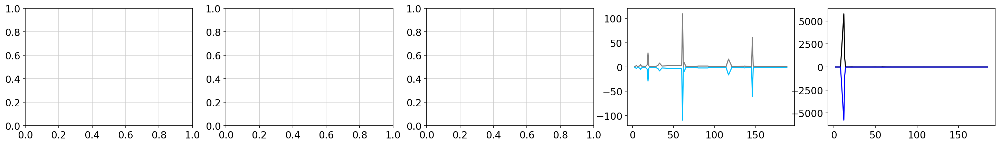

                                           condition pearson spearman   r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.75     0.45  0.0


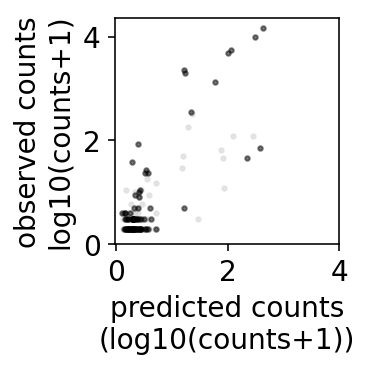

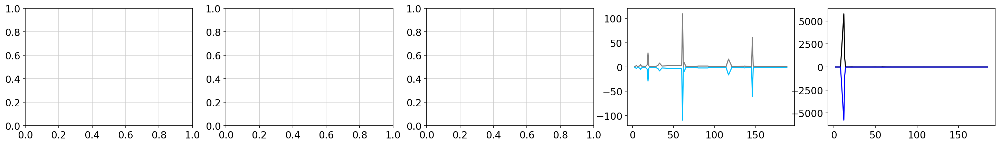

                                           condition pearson spearman   r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.75     0.45  0.0


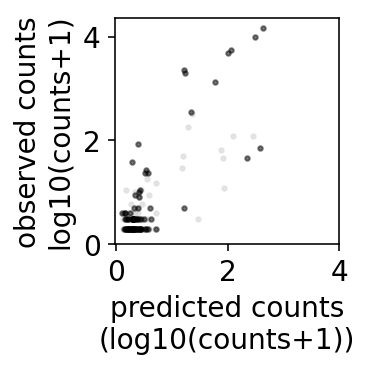

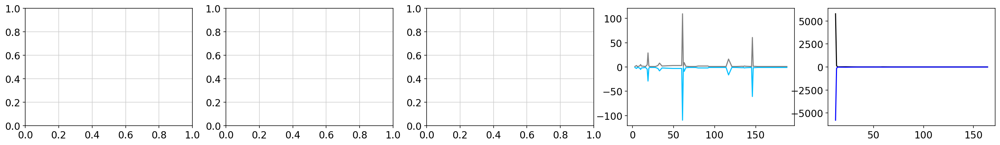

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.72      0.8  -0.1


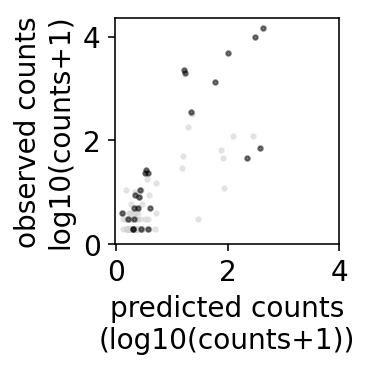

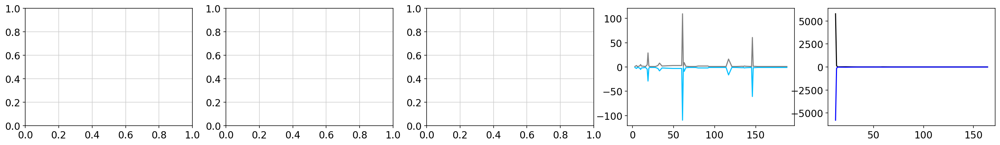

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.72      0.8  -0.1


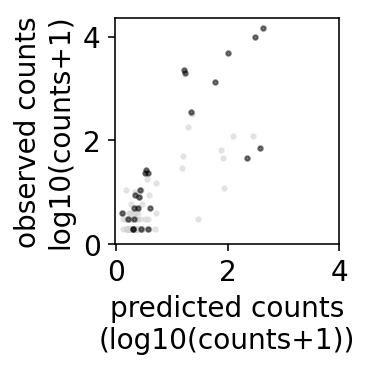

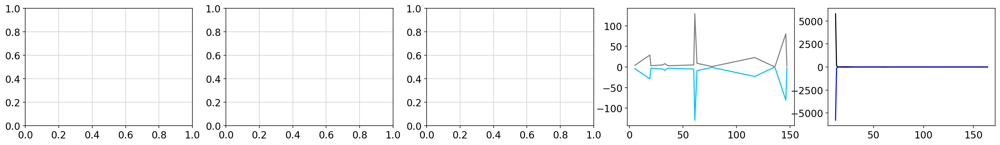

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.72      0.8  -0.1


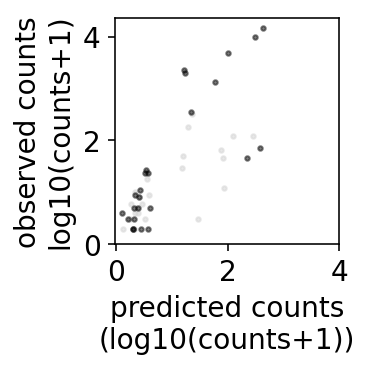

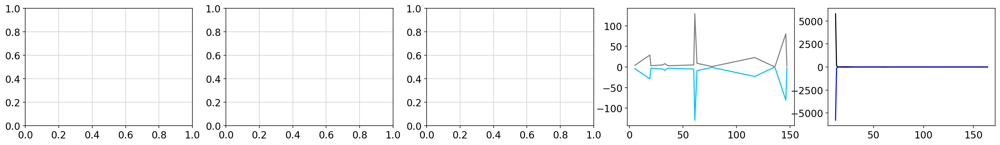

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.72      0.8  -0.1


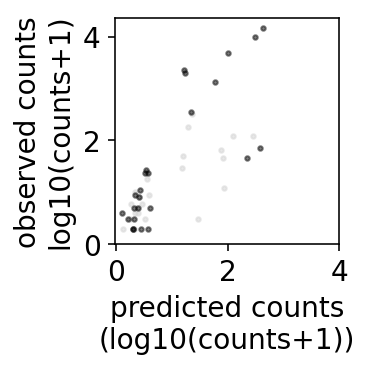

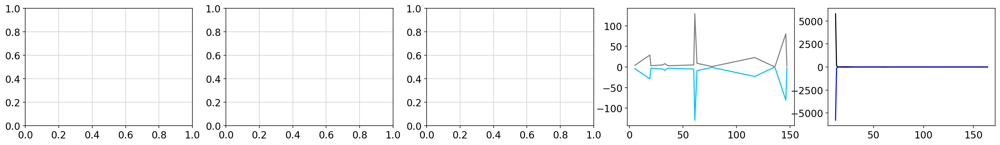

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.13     0.78  -0.16


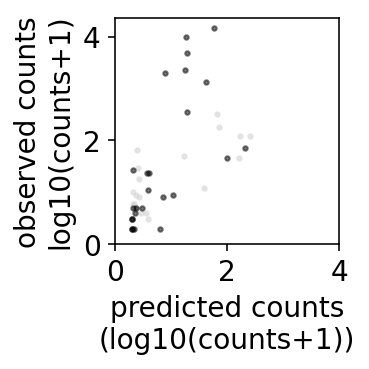

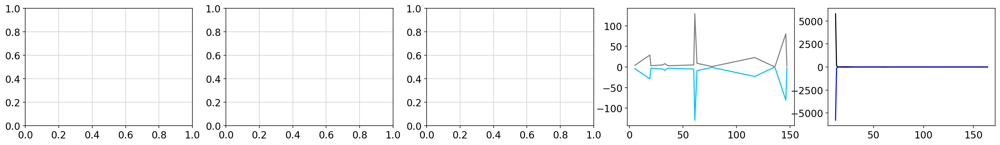

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.13     0.78  -0.16


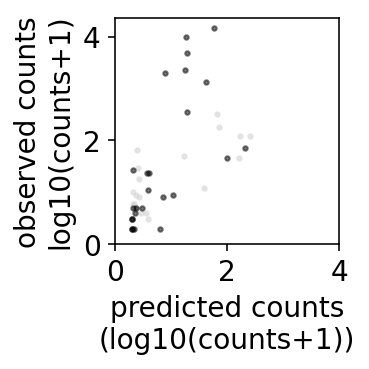

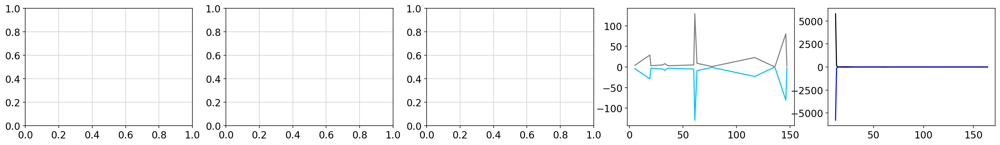

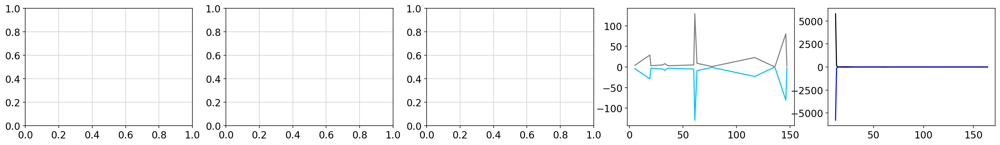

A146T     1
Q61H      5
Q61L     44
Q61R     63
Q61K     17
Name: 0, dtype: int64
G12D       4
G12V       3
G12C      22
G12A    1940
G12R       4
Name: 0, dtype: int64
G12D    10
G12V     1
G12C    10
G13D     1
G12A     2
Name: 0, dtype: int64
=============== iteration 1


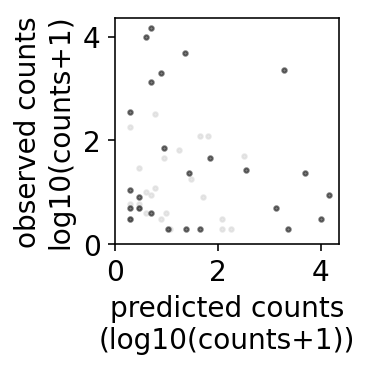

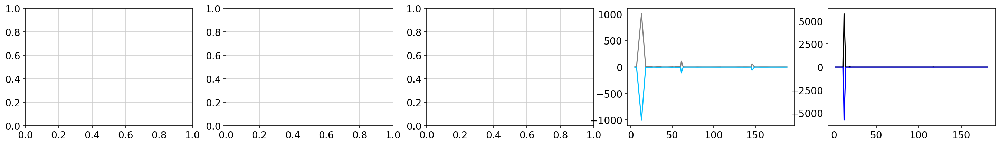

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.97     0.29  0.22


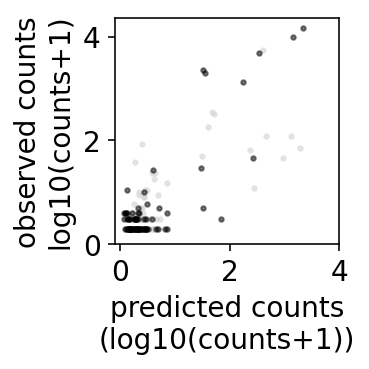

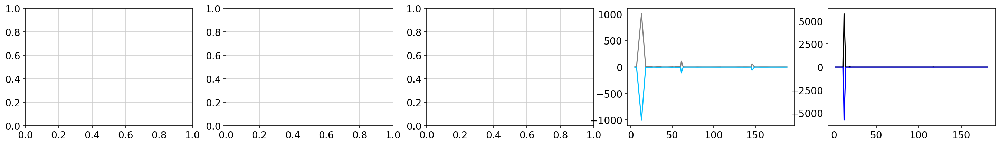

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.97     0.29  0.22


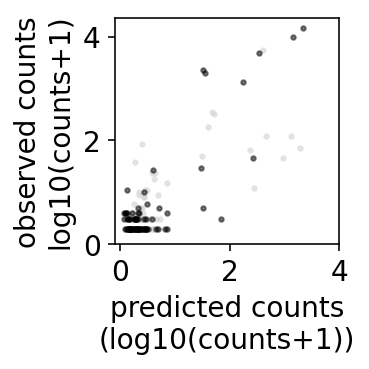

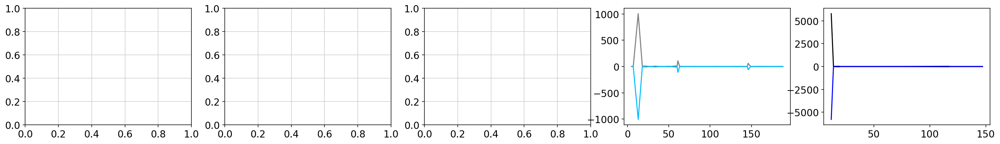

                                           condition pearson spearman   r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.97     0.77  0.1


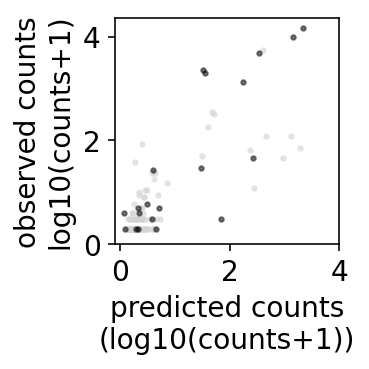

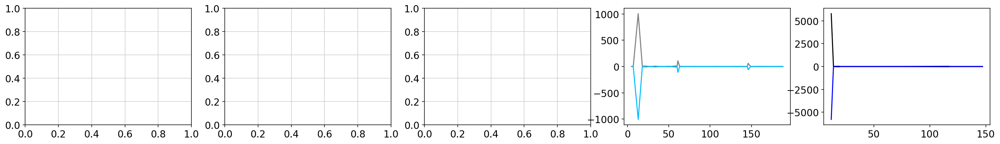

                                           condition pearson spearman   r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.97     0.77  0.1


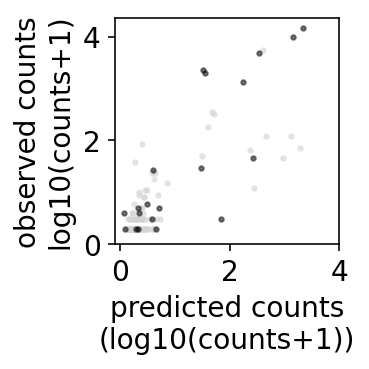

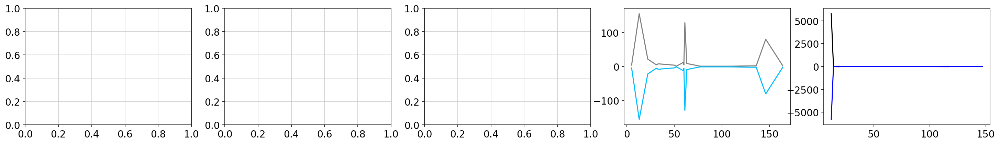

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.96     0.77  -0.16


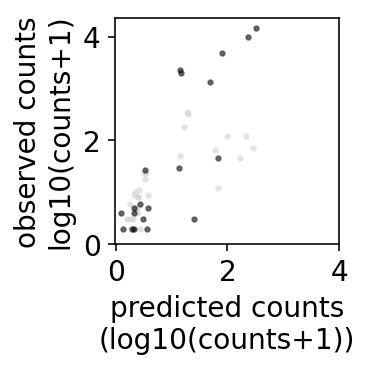

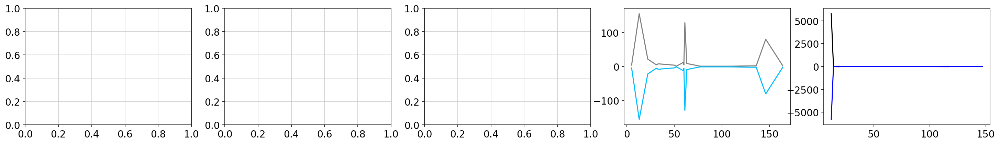

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.96     0.77  -0.16


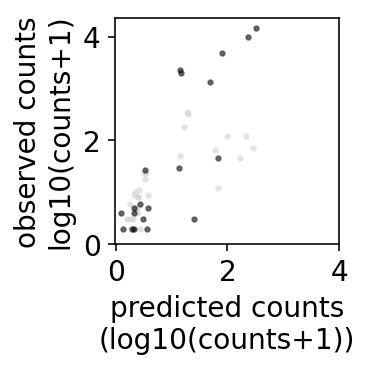

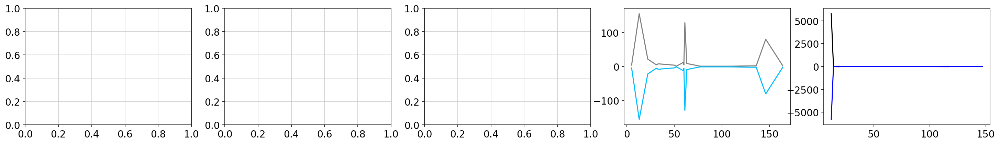

                                           condition pearson spearman    r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.21     0.73  -0.2


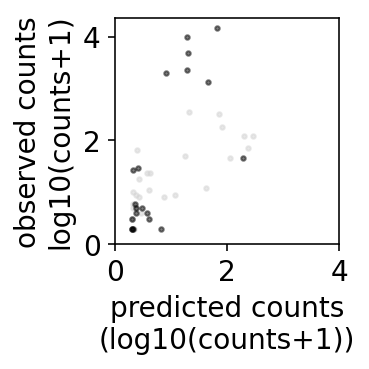

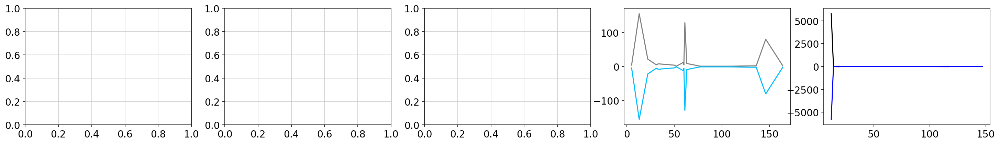

                                           condition pearson spearman    r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.21     0.73  -0.2


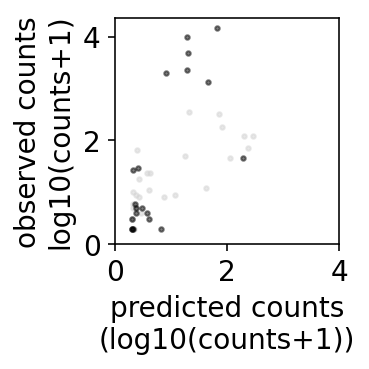

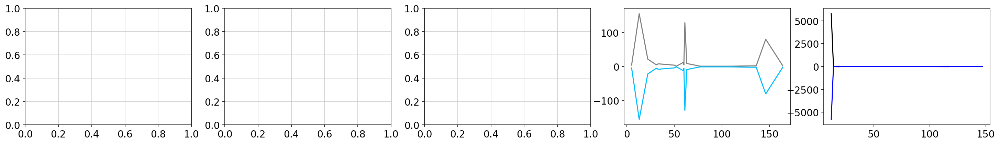

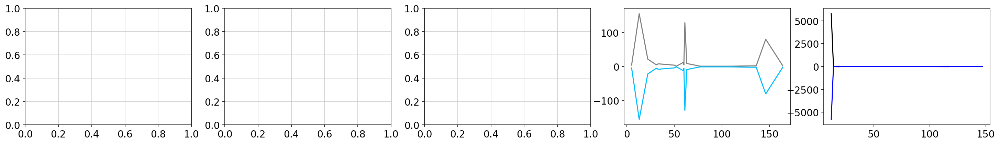

A146T      8
Q61H     325
G13C      63
Q61L     120
Q61R       4
Name: 0, dtype: int64
G12D       1
G12V       2
G12C       1
G12A    1940
G12R       1
Name: 0, dtype: int64
G12D    1
G12V    1
G12C    1
G13D    1
G12A    1
Name: 0, dtype: int64
=============== iteration 2


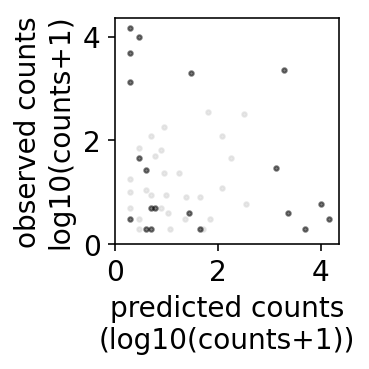

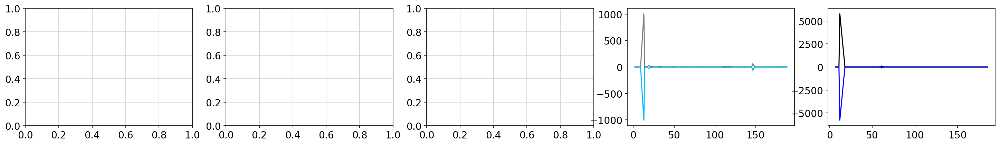

                                           condition pearson spearman   r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.86     0.47  0.3


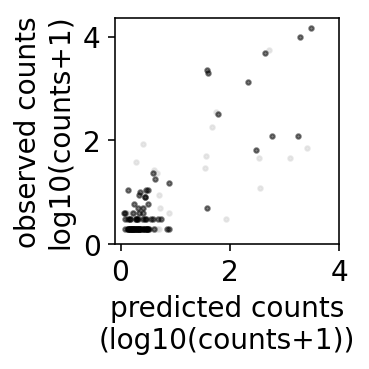

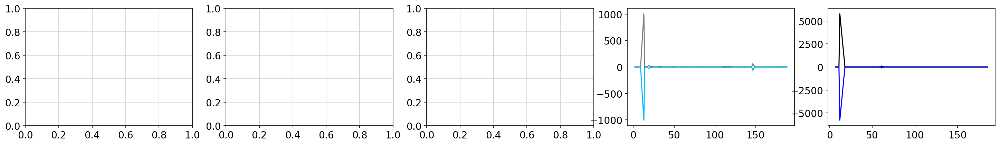

                                           condition pearson spearman   r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.86     0.47  0.3


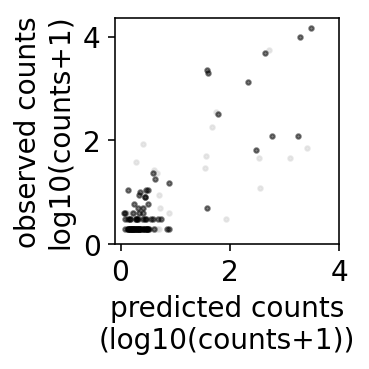

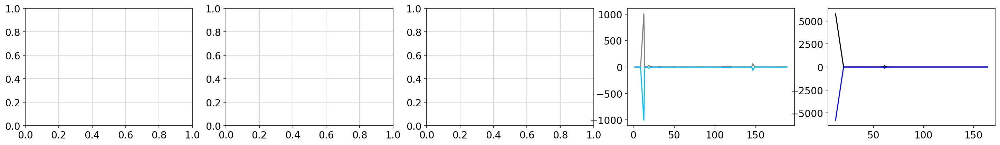

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.85     0.82  0.24


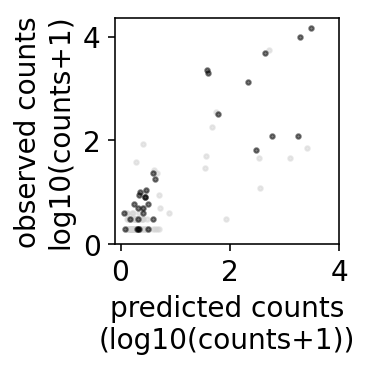

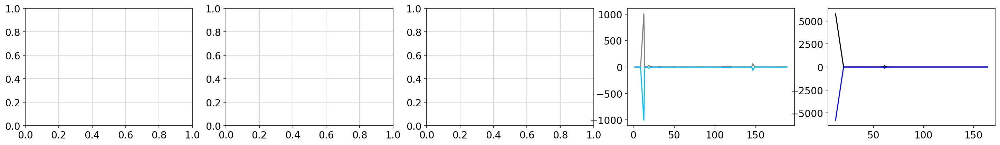

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.85     0.82  0.24


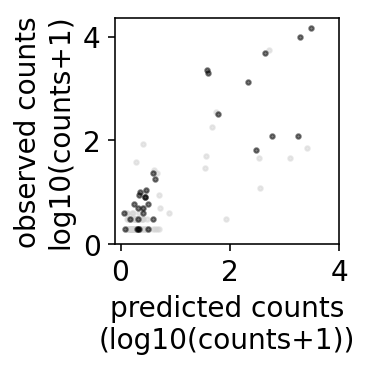

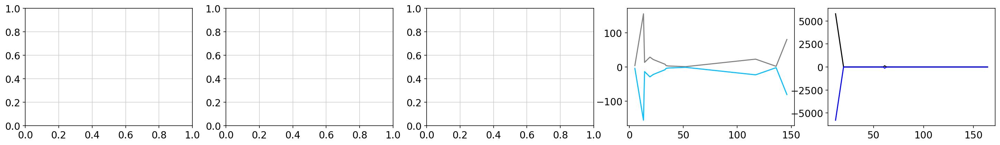

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.82     0.82  -0.09


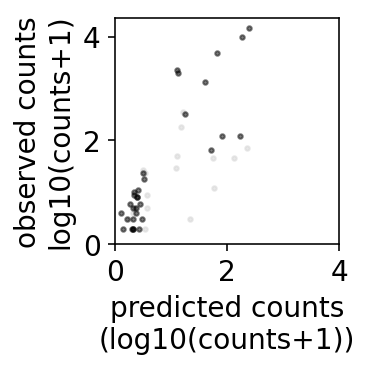

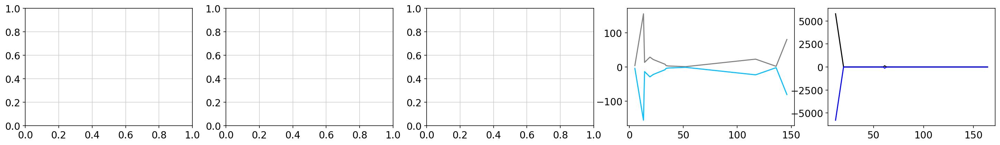

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.82     0.82  -0.09


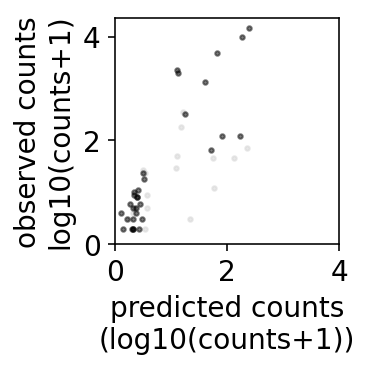

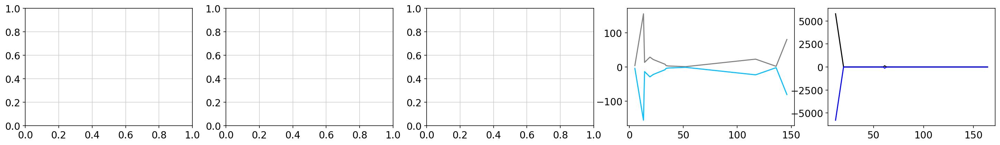

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.09     0.84  -0.12


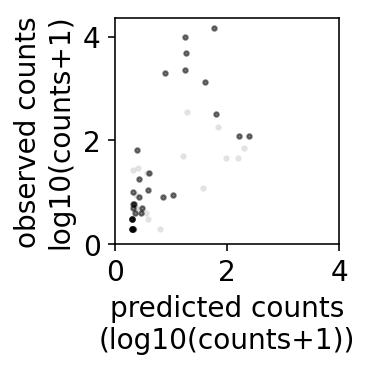

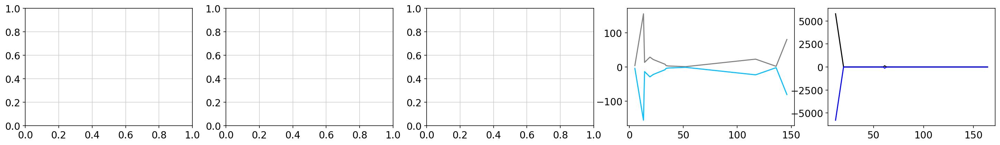

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.09     0.84  -0.12


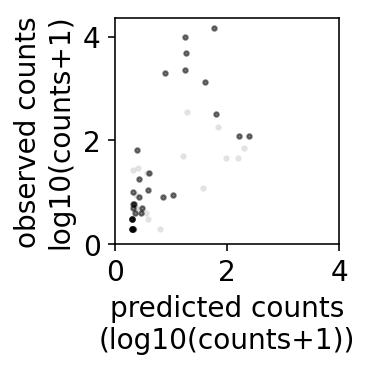

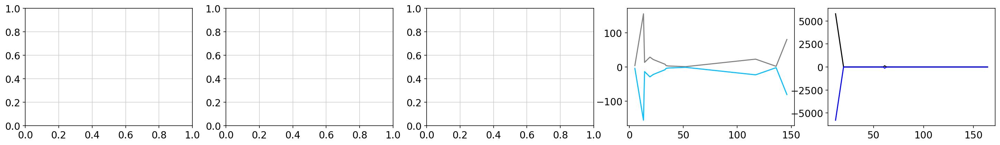

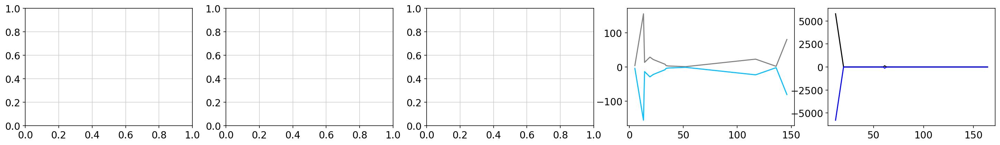

A146T     3
G13C     69
L19F     22
K117N     1
A146V     4
Name: 0, dtype: int64
G12D       4
G12V       5
G12C    1940
G12A       1
G12R    1354
Name: 0, dtype: int64
G12D      3
G12V      1
G12C    325
G13D      2
G12A      1
Name: 0, dtype: int64
=============== iteration 3


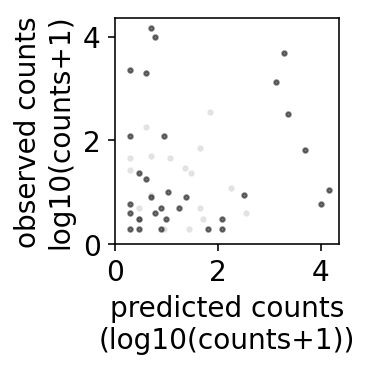

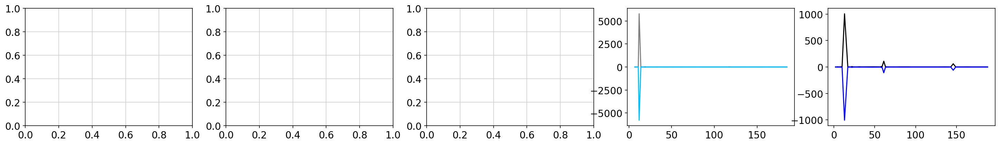

                                           condition pearson spearman      r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...     0.1     0.45  -11.04


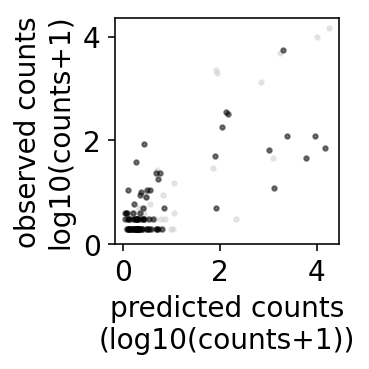

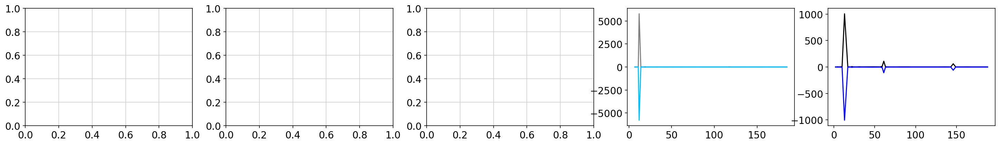

                                           condition pearson spearman      r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...     0.1     0.45  -11.04


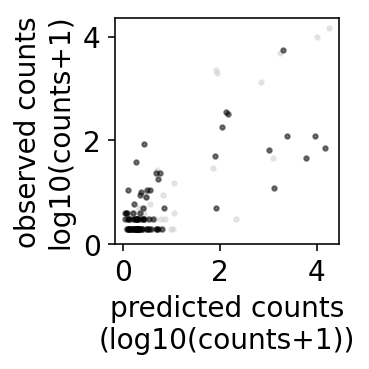

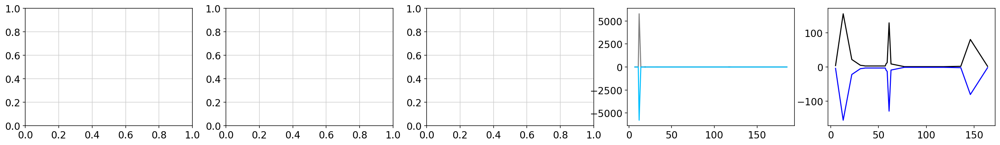

                                           condition pearson spearman  \
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.11     0.81   

         r2  
0  -1492.48  


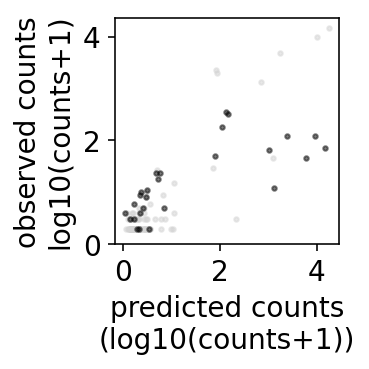

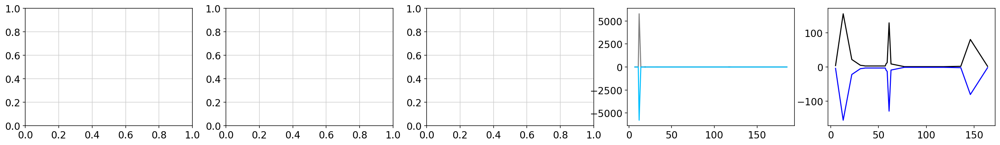

                                           condition pearson spearman  \
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.11     0.81   

         r2  
0  -1492.48  


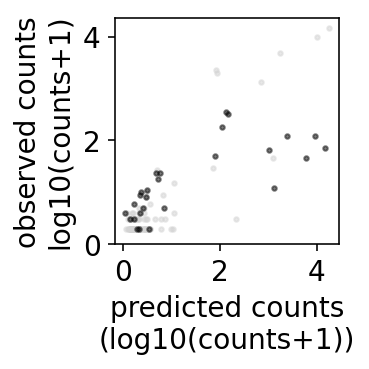

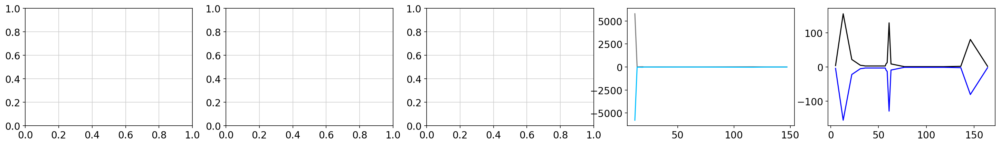

                                           condition pearson spearman  \
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.11     0.81   

         r2  
0  -1493.36  


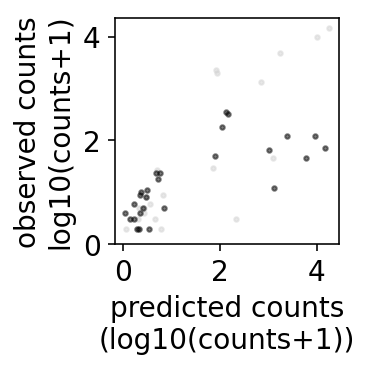

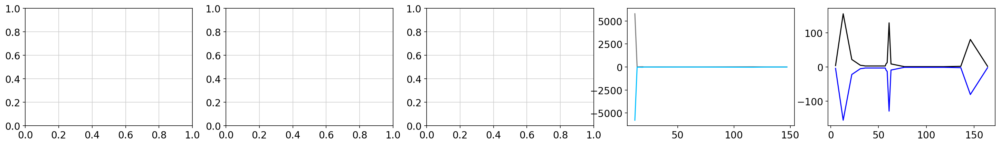

                                           condition pearson spearman  \
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.11     0.81   

         r2  
0  -1493.36  


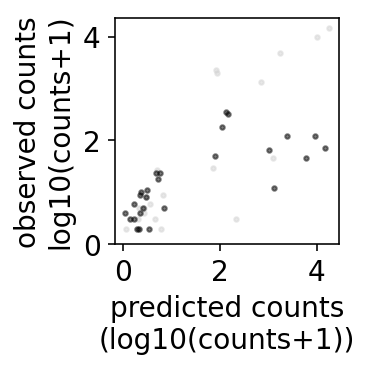

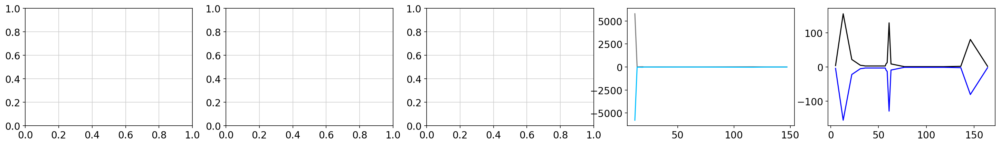

                                           condition pearson spearman  \
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.23     0.83   

          r2  
0  -14512.86  


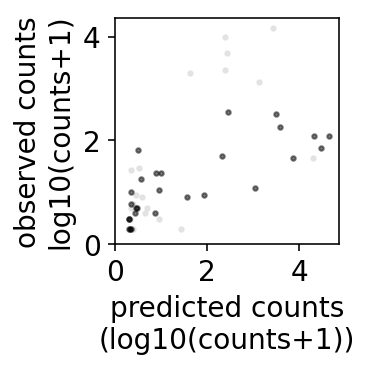

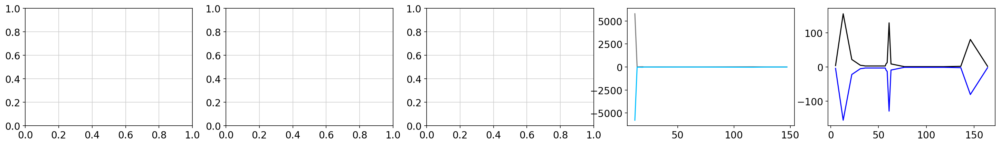

                                           condition pearson spearman  \
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.23     0.83   

          r2  
0  -14512.86  


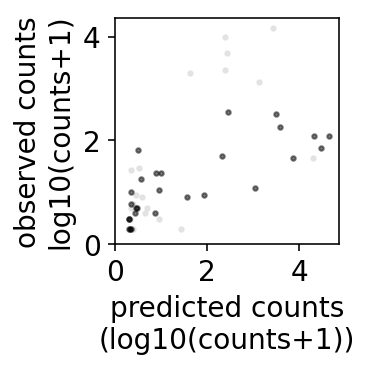

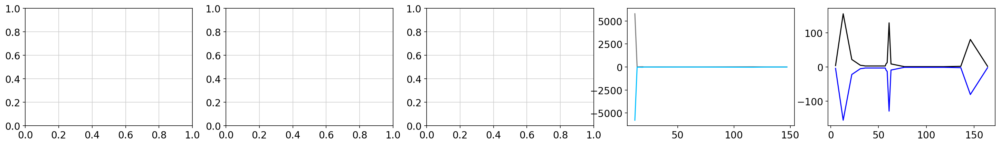

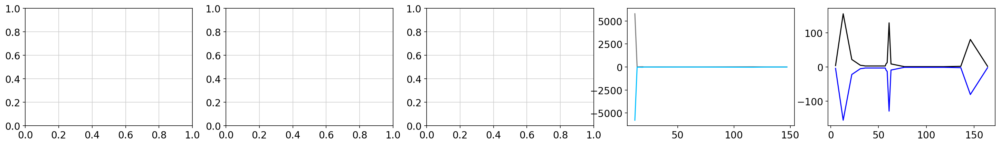

G12D     2
G12V     1
G12C    29
G12A     1
G12R     2
Name: 0, dtype: int64
A146T     2
Q61H      8
G13C     50
Q61L     10
Q61R      4
Name: 0, dtype: int64
G12D       2
G12V      10
G12C      17
G13D       4
G12A    1940
Name: 0, dtype: int64
=============== iteration 4


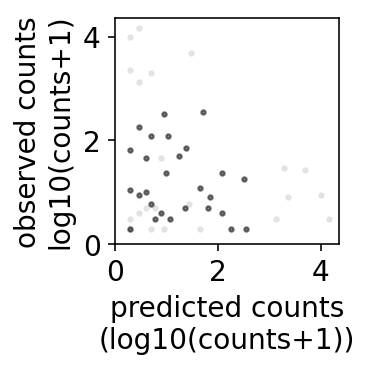

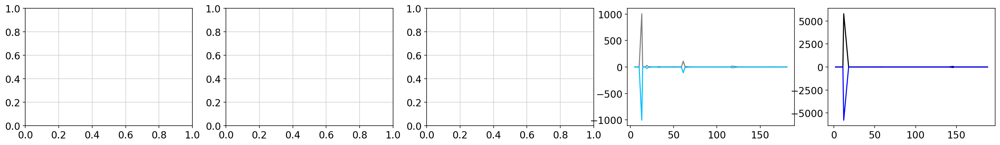

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.97     0.55  0.22


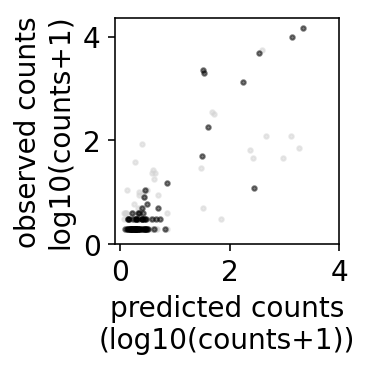

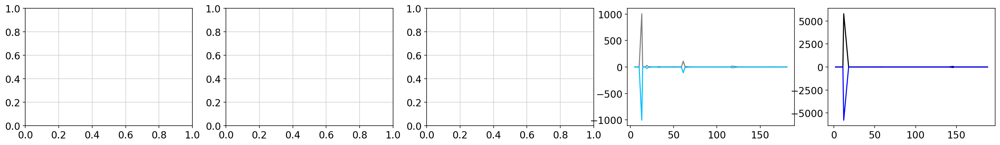

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.97     0.55  0.22


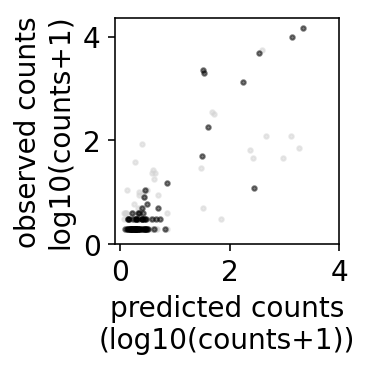

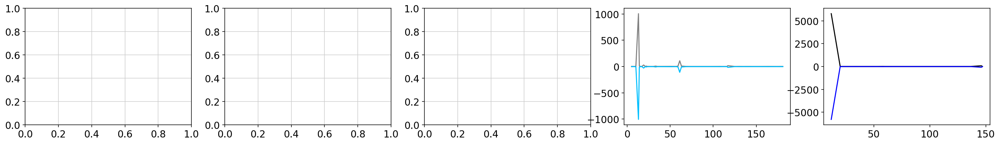

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.97     0.91  0.11


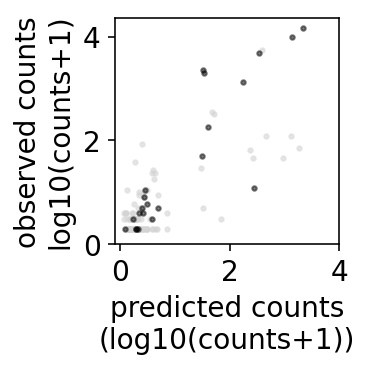

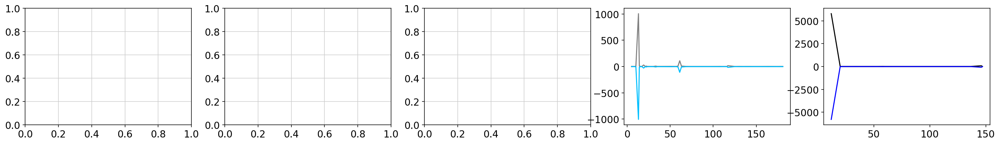

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.97     0.91  0.11


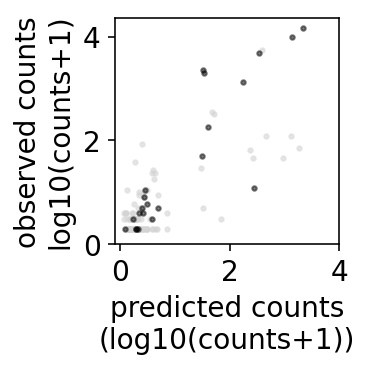

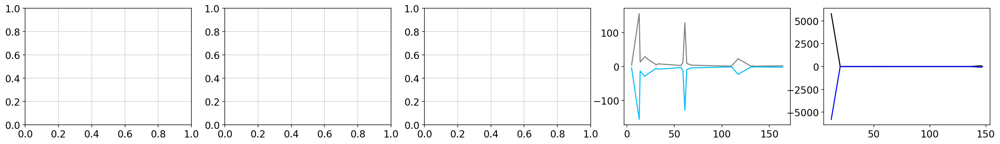

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.97     0.91  -0.14


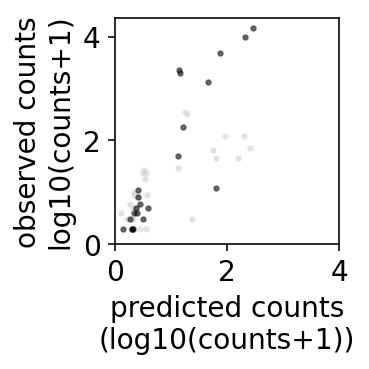

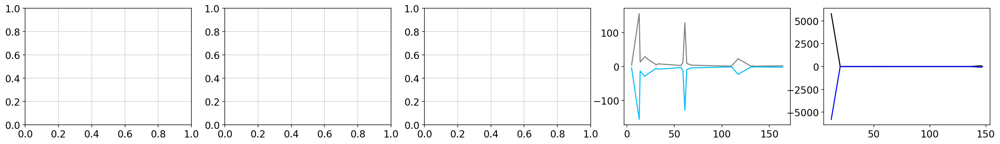

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.97     0.91  -0.14


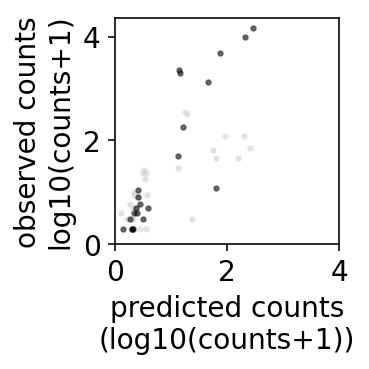

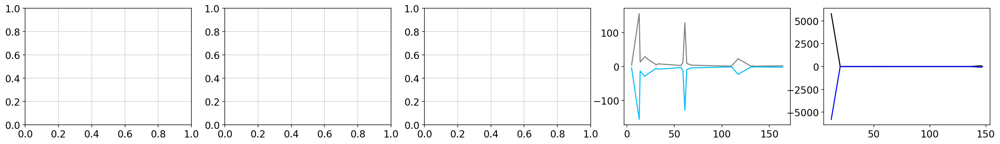

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.47     0.86  -0.18


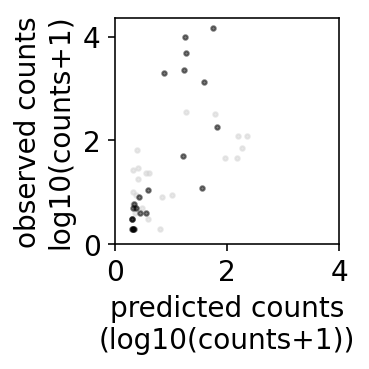

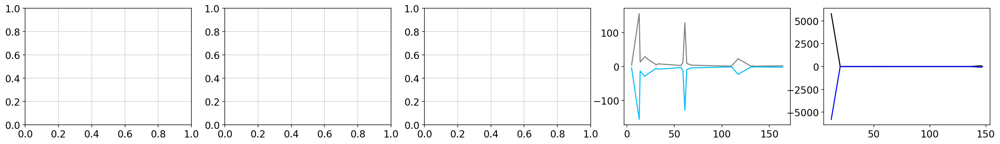

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.47     0.86  -0.18


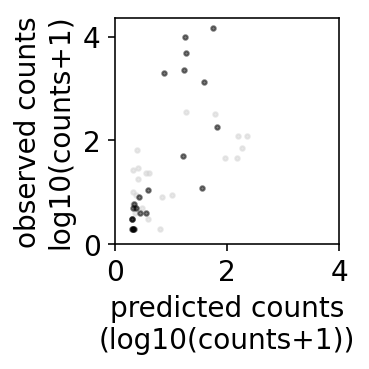

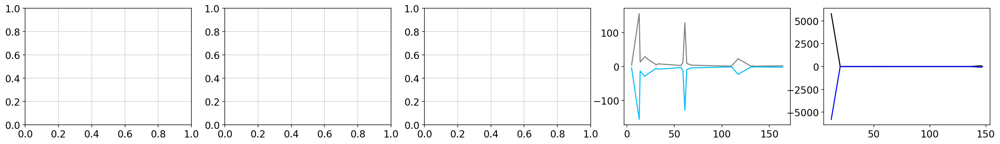

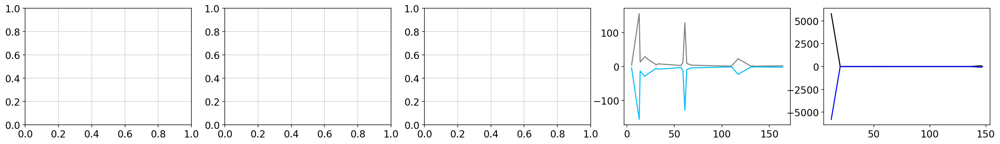

Q61H    122
G13C     29
Q61L      4
Q61R     26
Q61K      8
Name: 0, dtype: int64
G12D        7
G12V      181
G12C       11
G12A    14489
G12R     1354
Name: 0, dtype: int64
G12D    2
G12V    1
G12C    1
G13D    2
G12A    8
Name: 0, dtype: int64
=============== iteration 5


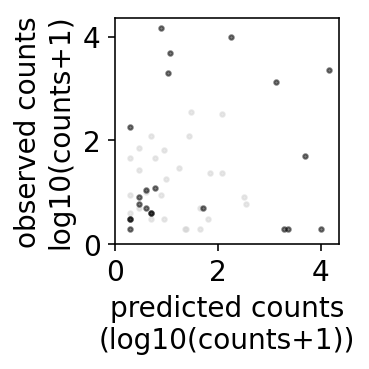

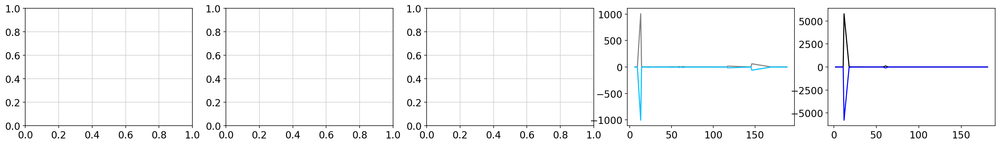

                                           condition pearson spearman   r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.86     0.53  0.3


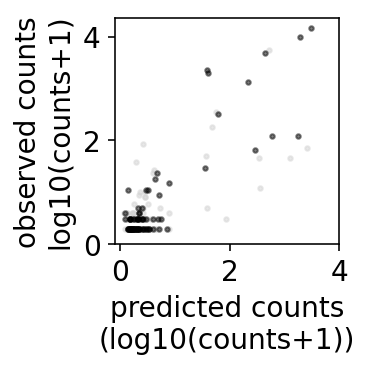

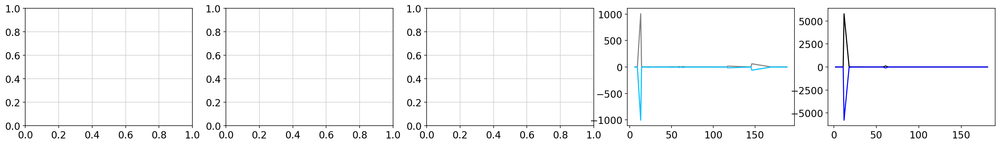

                                           condition pearson spearman   r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.86     0.53  0.3


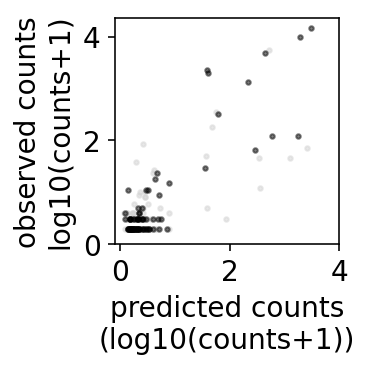

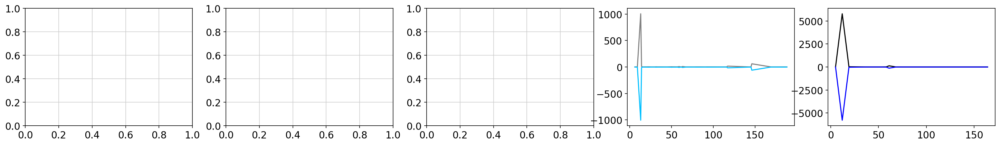

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.84      0.9  0.22


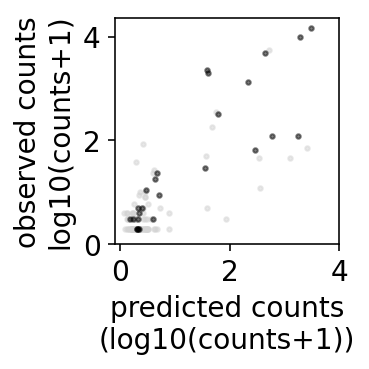

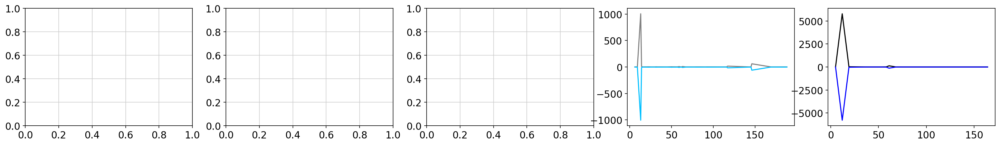

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.84      0.9  0.22


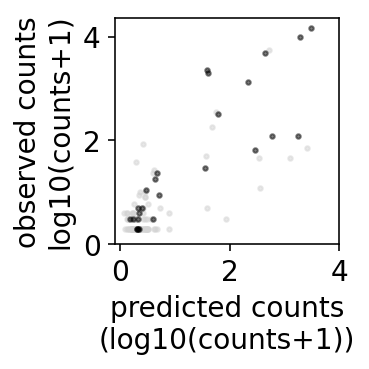

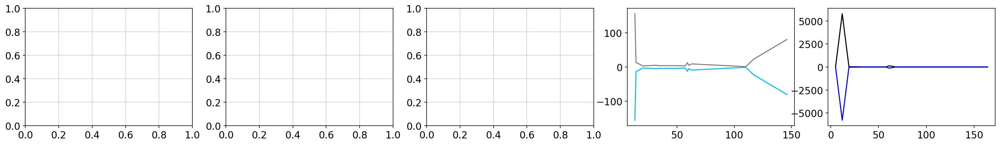

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.81      0.9  -0.12


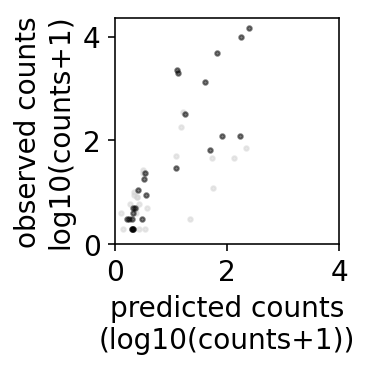

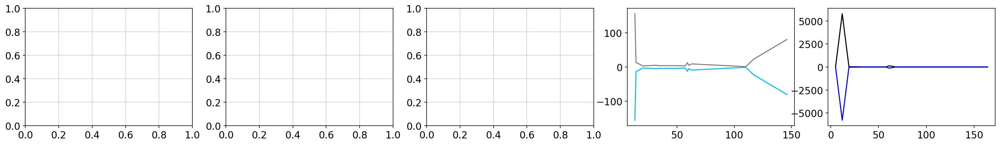

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.81      0.9  -0.12


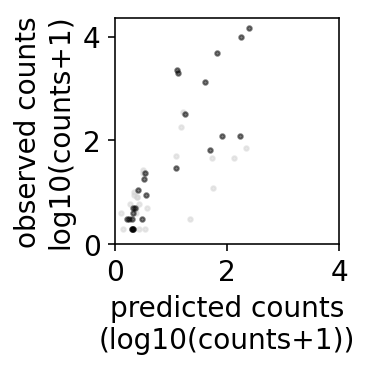

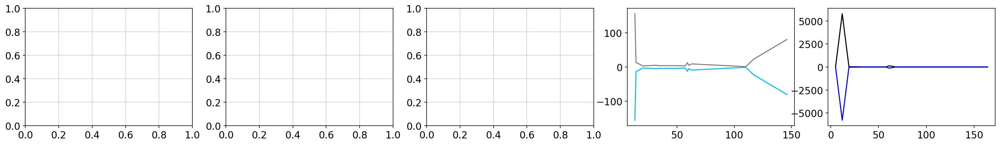

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.07     0.85  -0.15


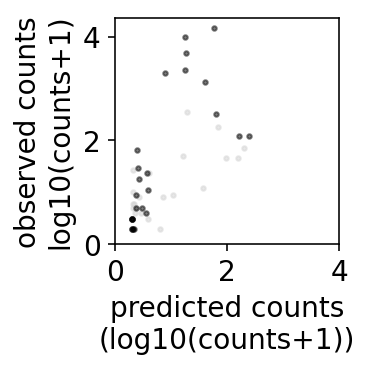

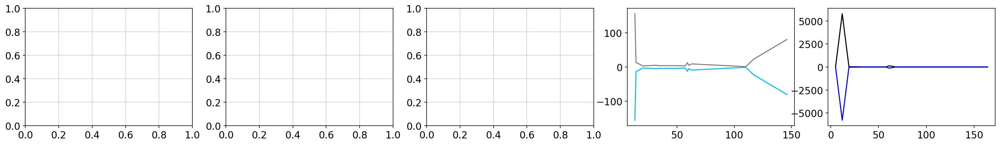

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.07     0.85  -0.15


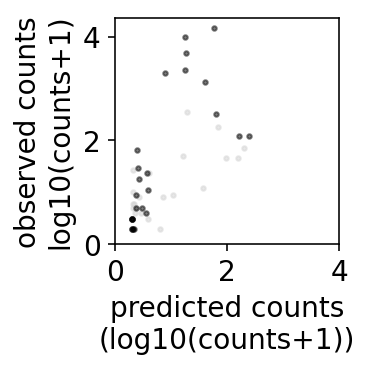

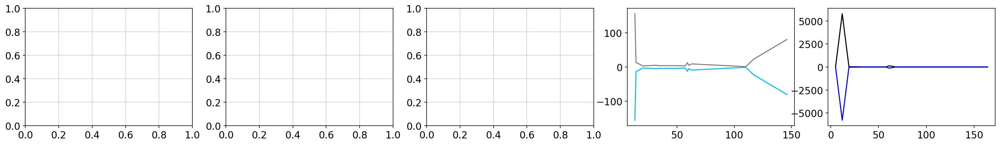

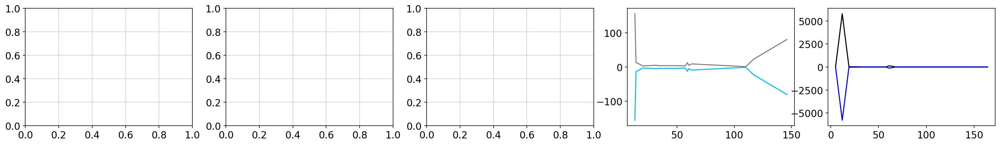

A146T     3
G13C      5
K117N    11
A146V    26
G13V     69
Name: 0, dtype: int64
G12D    325
G12V      2
G12C      3
G12A    120
G12R     10
Name: 0, dtype: int64
G12D    1
G12V    1
G12C    1
G13D    1
G12A    4
Name: 0, dtype: int64
=============== iteration 6


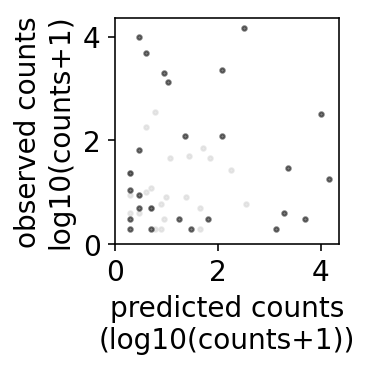

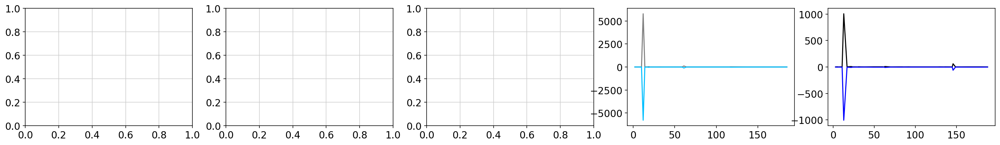

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.12     0.34  -4.09


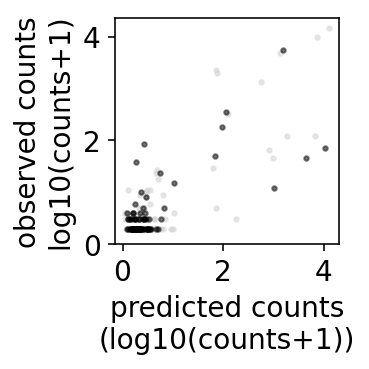

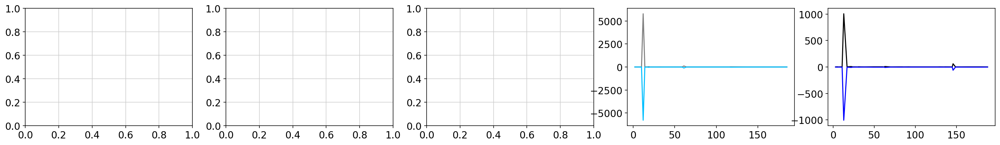

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.12     0.34  -4.09


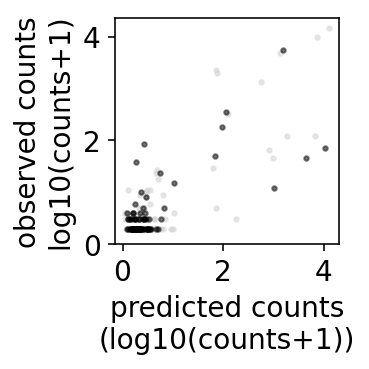

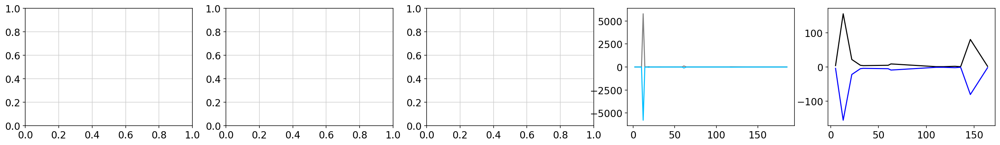

                                           condition pearson spearman       r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.08     0.75  -978.24


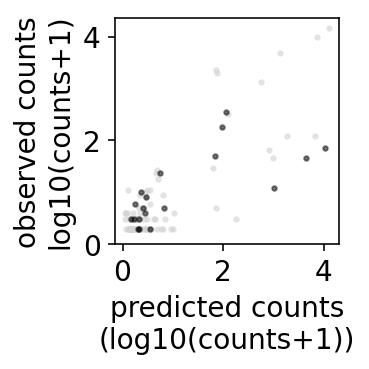

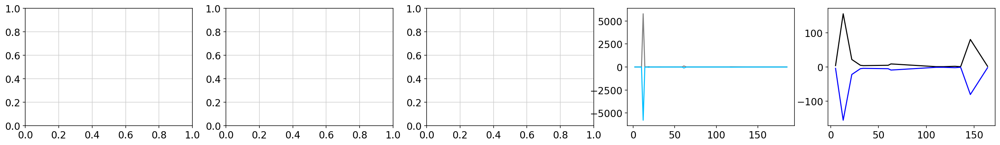

                                           condition pearson spearman       r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.08     0.75  -978.24


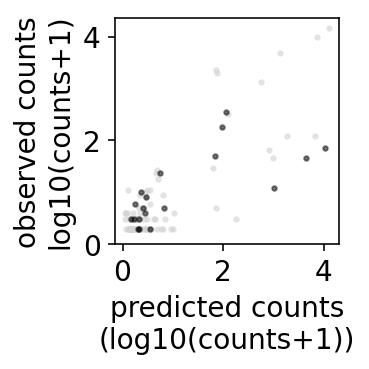

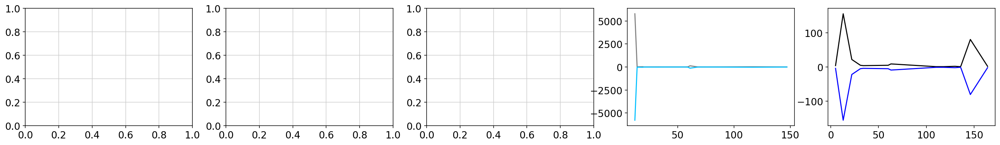

                                           condition pearson spearman       r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.08     0.75  -980.91


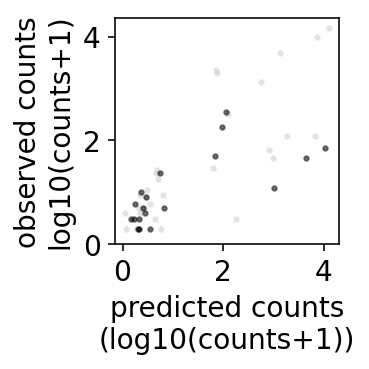

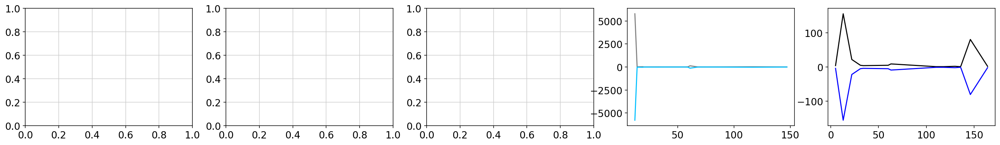

                                           condition pearson spearman       r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.08     0.75  -980.91


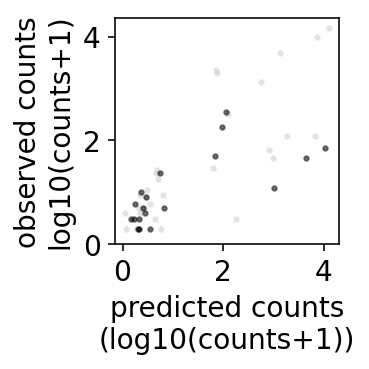

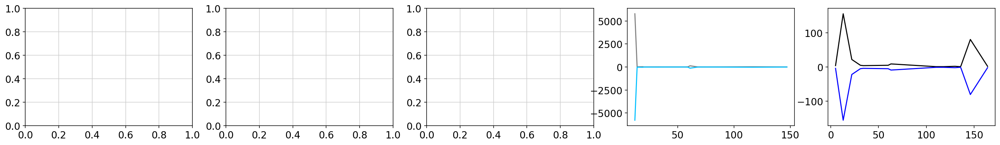

                                           condition pearson spearman       r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.15     0.87  -397.27


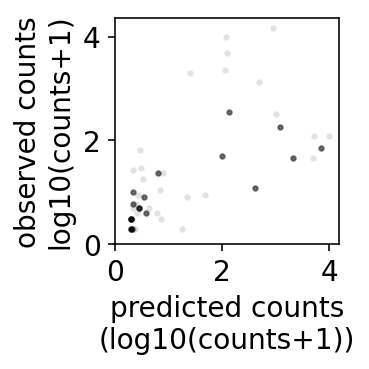

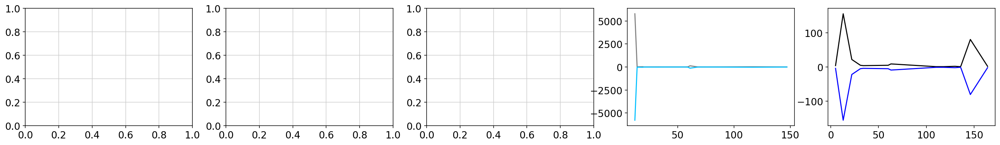

                                           condition pearson spearman       r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.15     0.87  -397.27


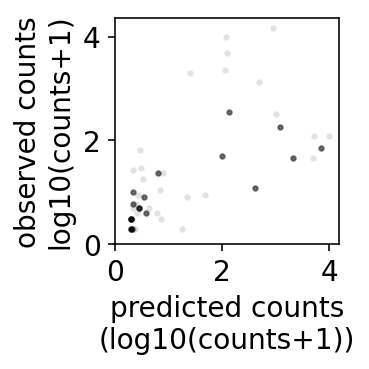

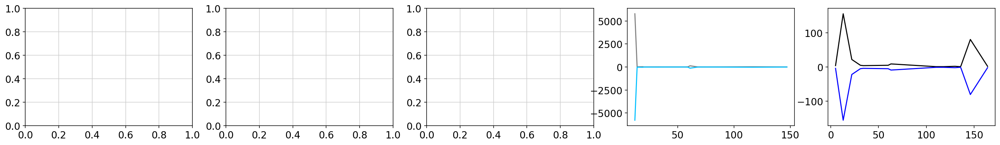

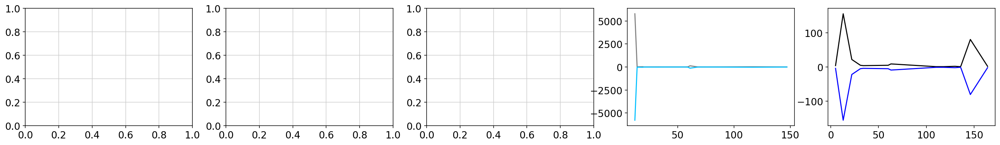

G12D    2297
G12V       4
G12C      63
G12A      29
G12R     122
Name: 0, dtype: int64
A146T     44
G13C      69
A146V    355
Q22K       7
G13V       5
Name: 0, dtype: int64
G12D     1
G12V     1
G12C     1
G13D    44
G12A     1
Name: 0, dtype: int64
=============== iteration 7


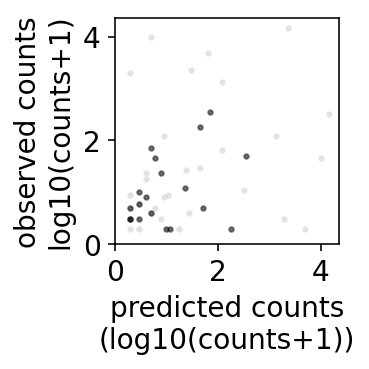

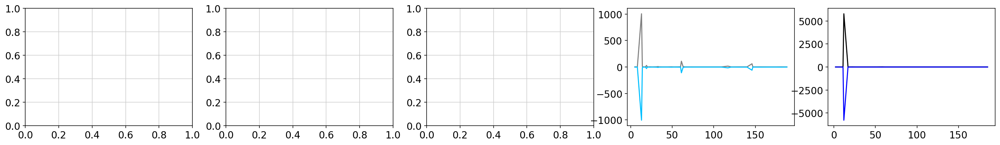

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.97      0.2  0.21


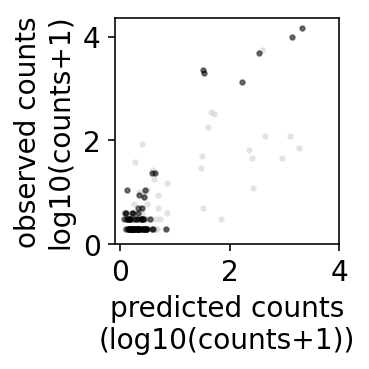

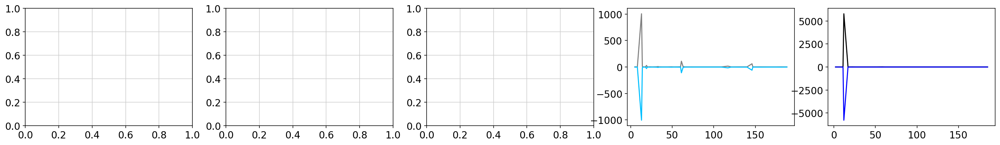

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.97      0.2  0.21


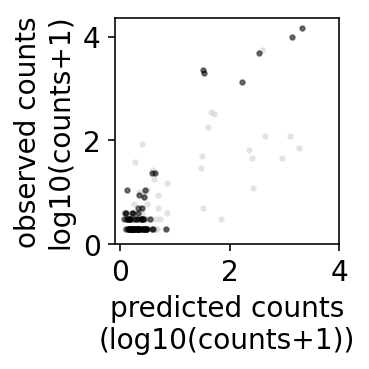

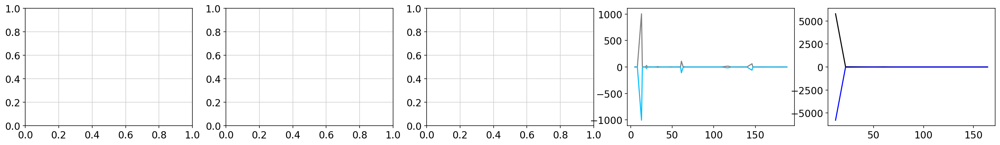

                                           condition pearson spearman    r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.97     0.89  0.06


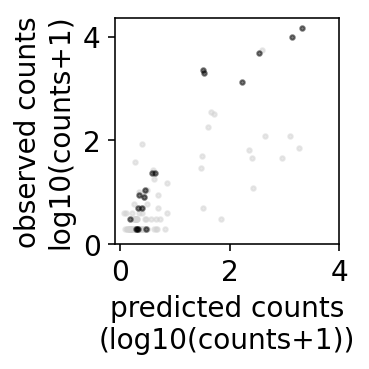

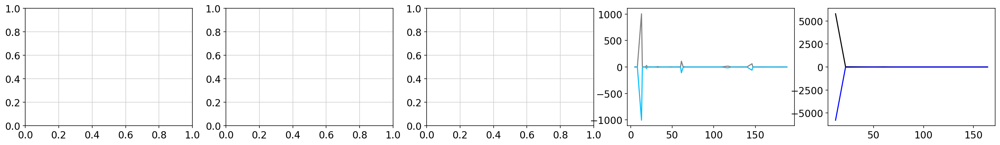

                                           condition pearson spearman    r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.97     0.89  0.06


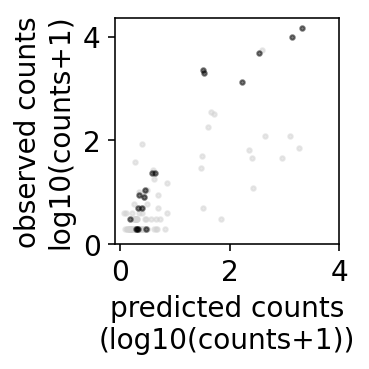

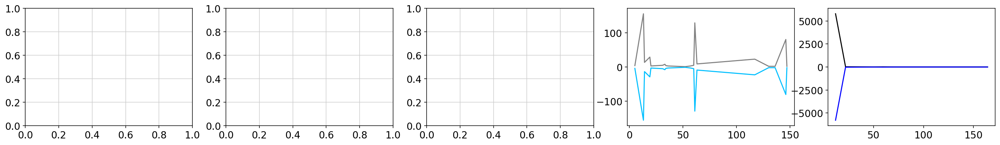

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.98     0.89  -0.19


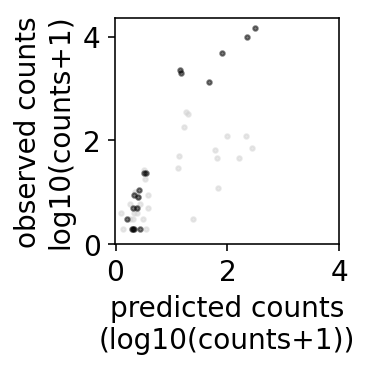

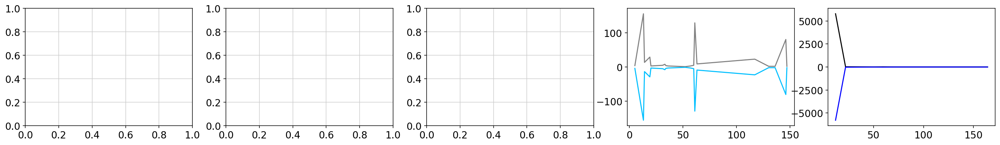

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.98     0.89  -0.19


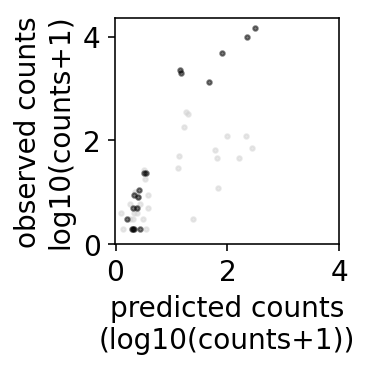

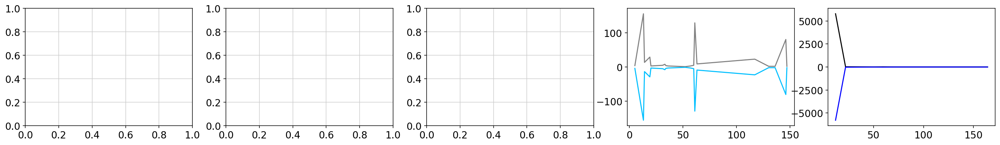

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.78     0.91  -0.23


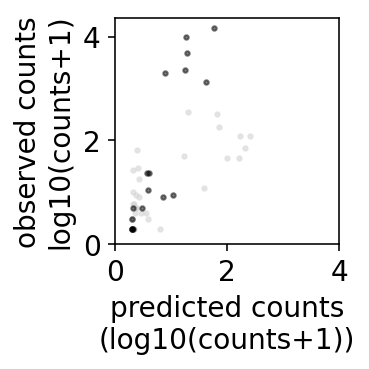

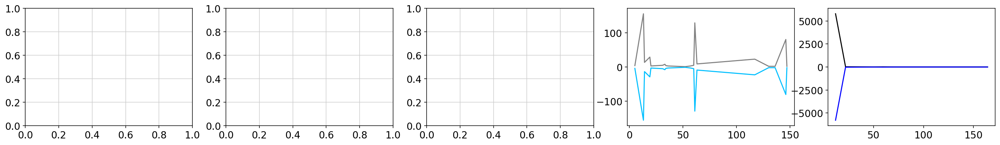

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.78     0.91  -0.23


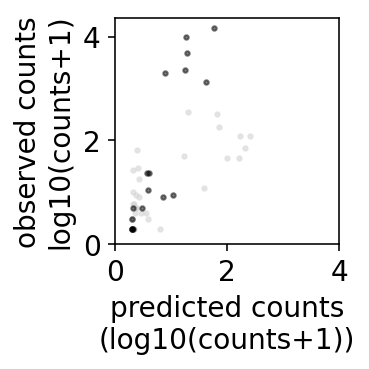

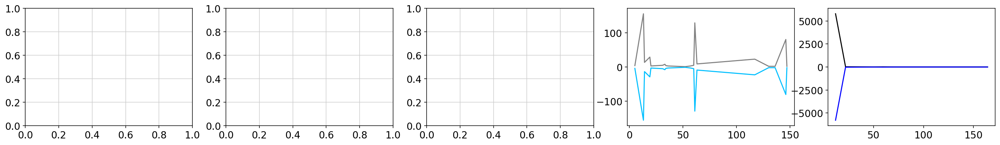

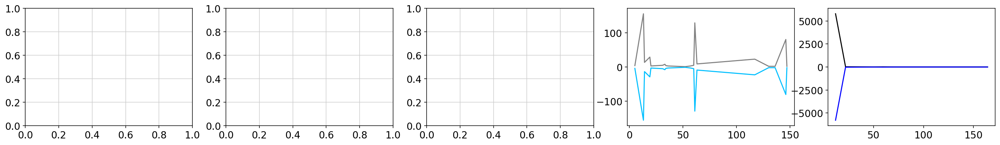

A146T     69
Q61H     181
G13C     355
Q61L       2
Q61R       1
Name: 0, dtype: int64
G12D     2297
G12V        4
G12C    14489
G12A        8
G12R        7
Name: 0, dtype: int64
G12D       8
G12V       1
G12C       3
G13D    5452
G12A       1
Name: 0, dtype: int64
=============== iteration 8


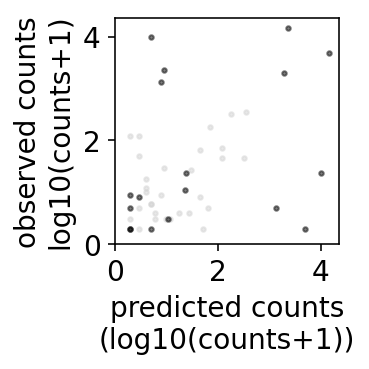

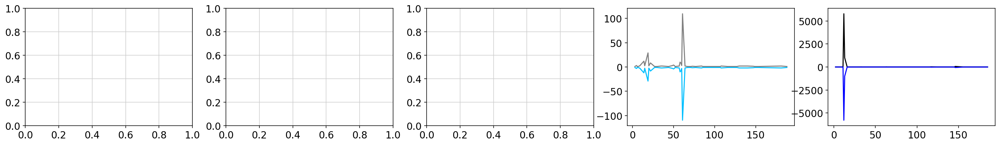

                                           condition pearson spearman   r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.74     0.48  0.0


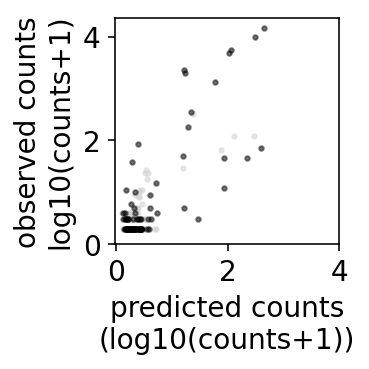

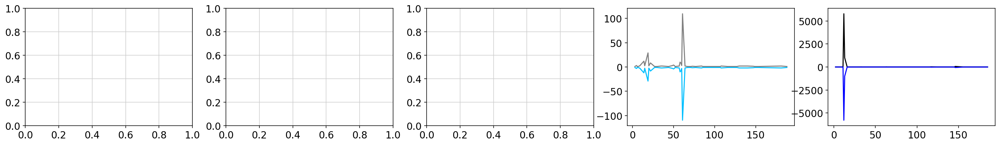

                                           condition pearson spearman   r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.74     0.48  0.0


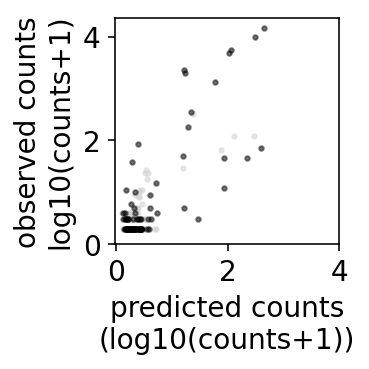

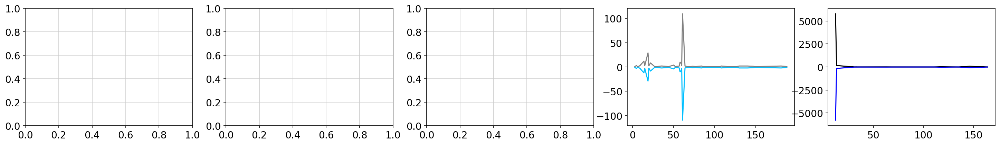

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.69     0.69  -0.13


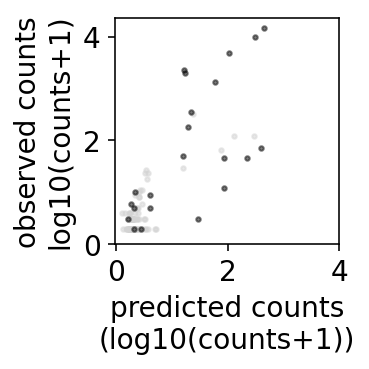

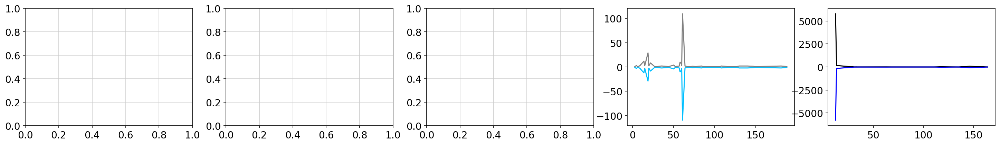

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.69     0.69  -0.13


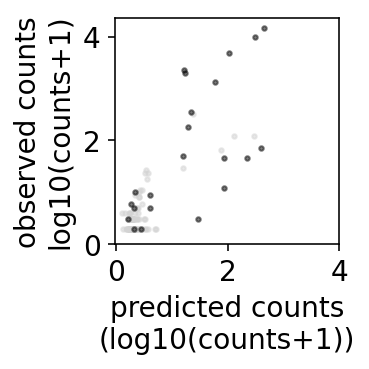

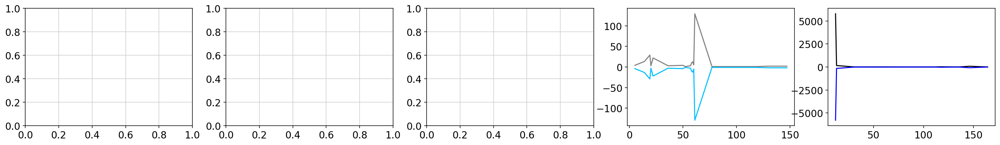

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.69     0.69  -0.13


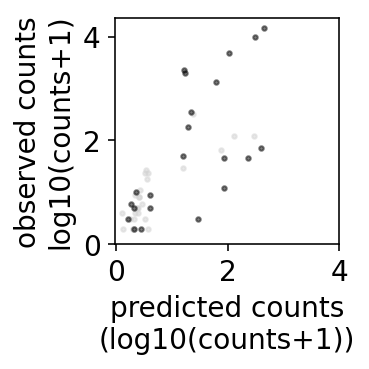

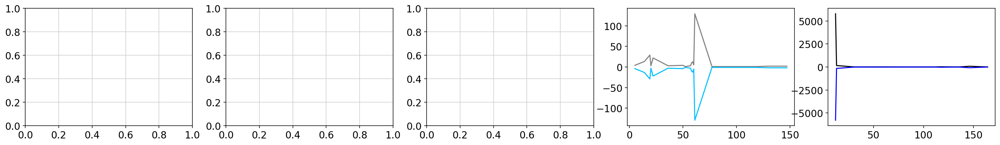

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.69     0.69  -0.13


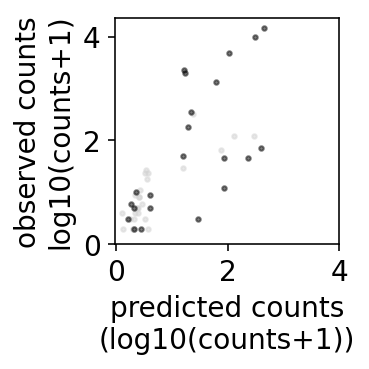

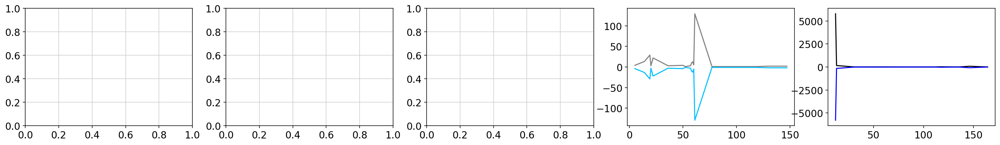

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...     0.0     0.66  -0.19


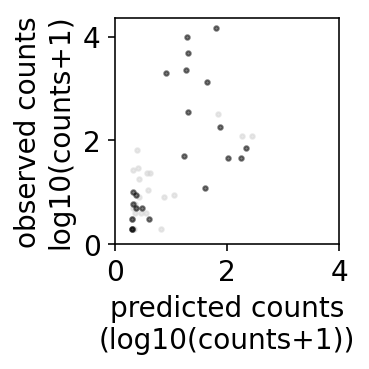

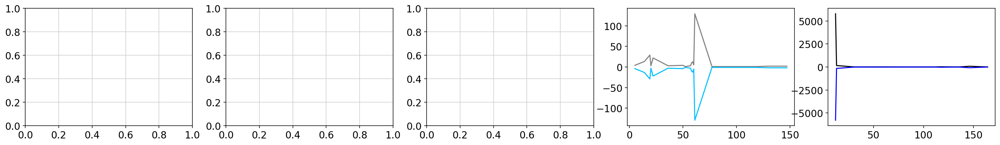

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...     0.0     0.66  -0.19


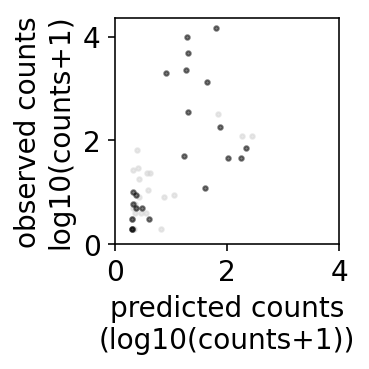

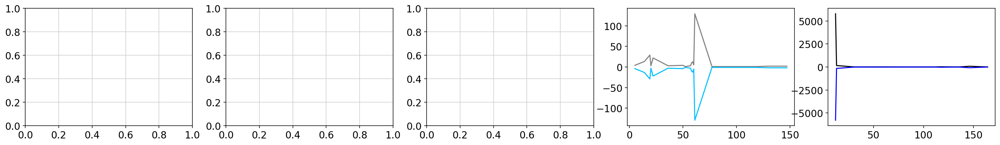

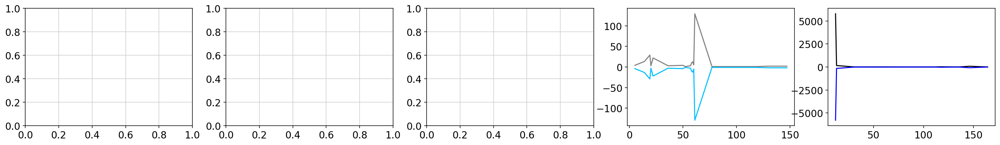

Q61H     7
Q61L    17
Q61R     3
Q61K     5
L19F    29
Name: 0, dtype: int64
G12D     4
G12V     9
G12C     2
G12A    11
G12R     1
Name: 0, dtype: int64
G12D     1
G12V     2
G12C     4
G13D     4
G12A    26
Name: 0, dtype: int64
=============== iteration 9


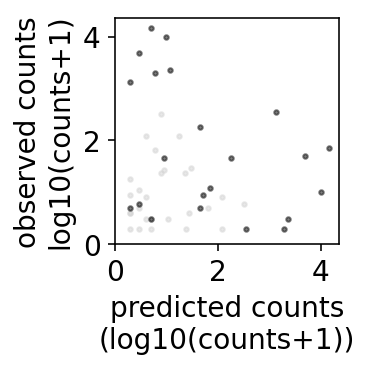

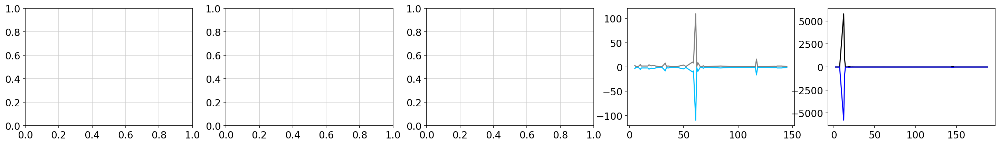

                                           condition pearson spearman   r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.75     0.48  0.0


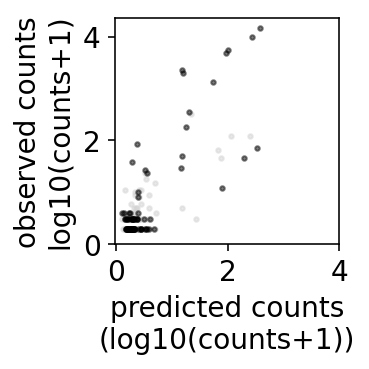

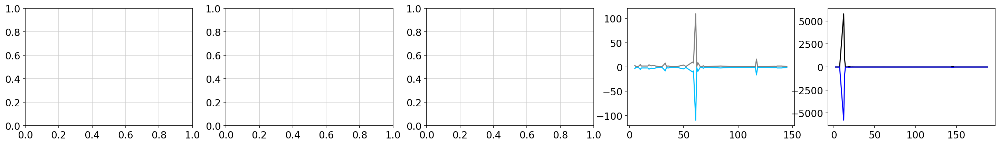

                                           condition pearson spearman   r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.75     0.48  0.0


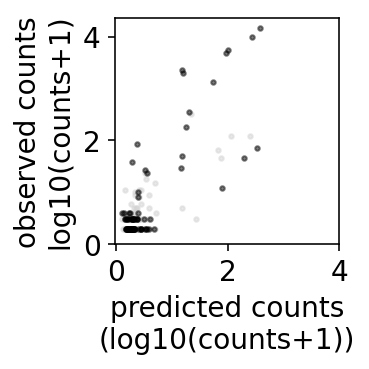

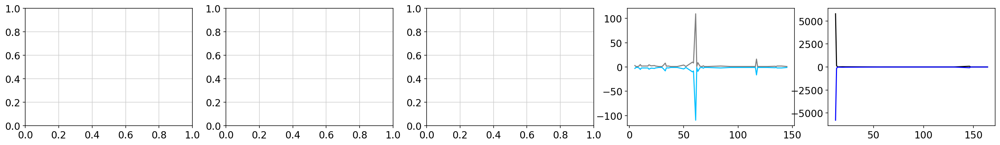

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Te...    0.71     0.79  -0.12


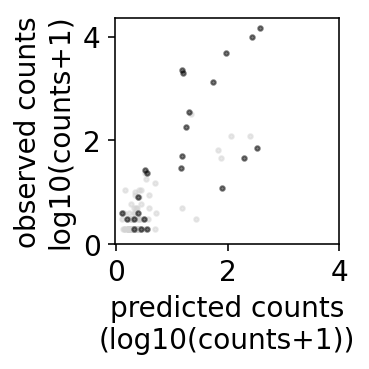

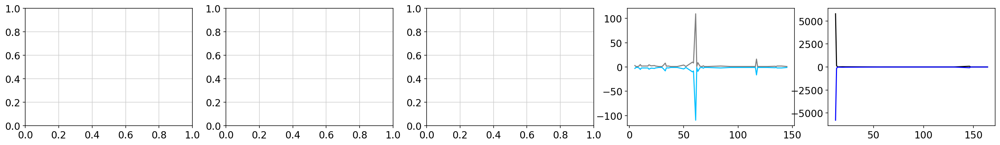

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Te...    0.71     0.79  -0.12


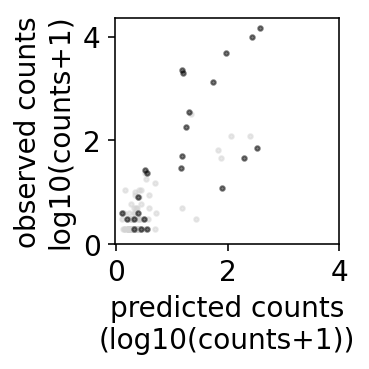

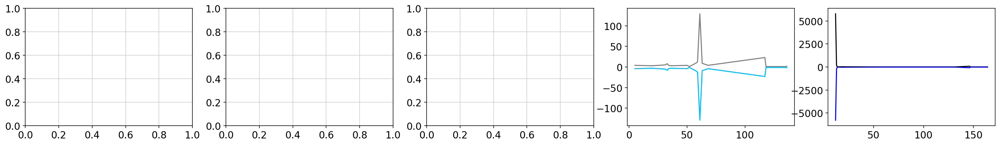

                                           condition pearson spearman     r2
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Te...    0.71     0.79  -0.12


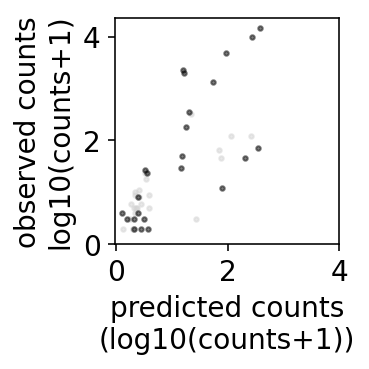

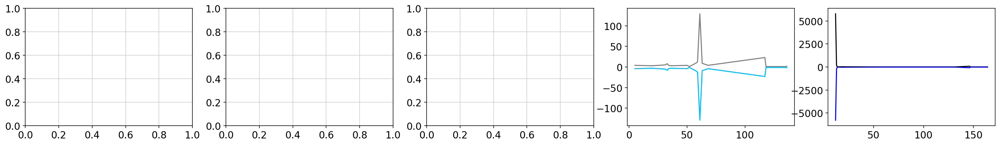

                                           condition pearson spearman     r2
0  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Te...    0.71     0.79  -0.12


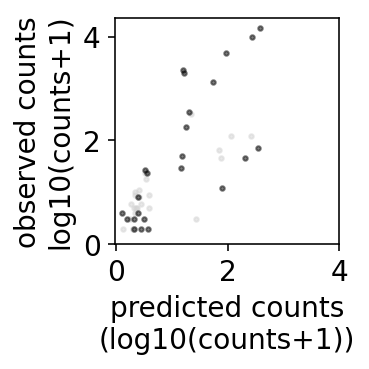

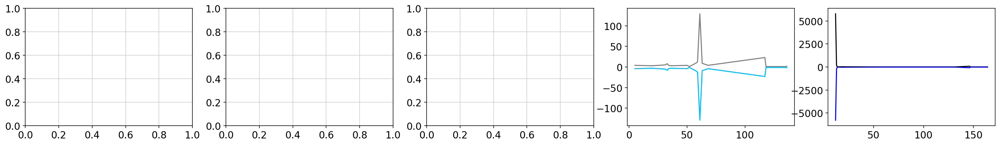

                                           condition pearson spearman     r2
0  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Te...    0.09     0.71  -0.17


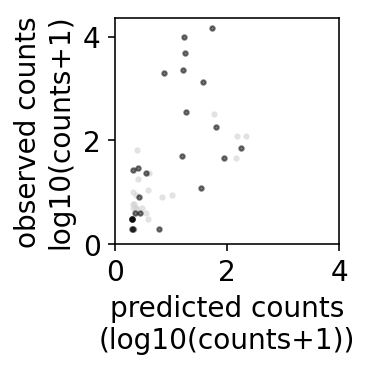

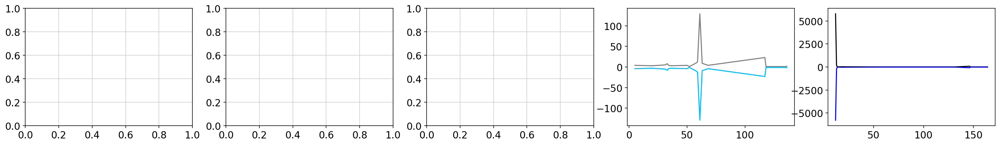

                                           condition pearson spearman     r2
0  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Te...    0.09     0.71  -0.17


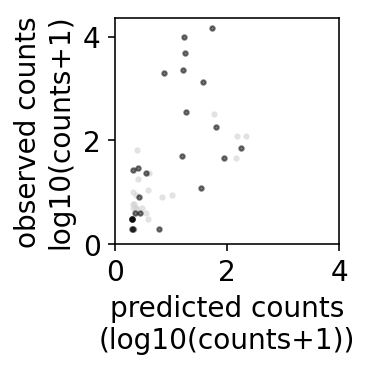

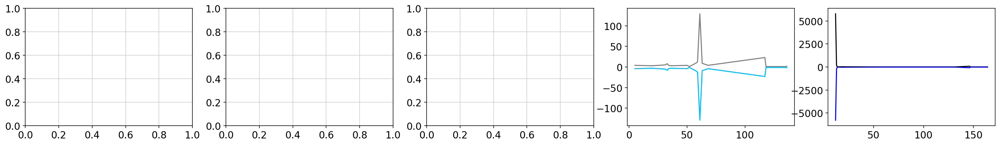

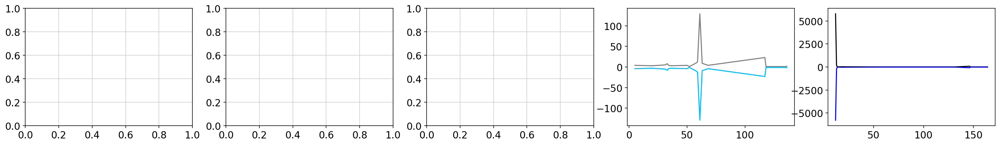

Q61H       9
Q61L     120
Q61R      44
Q61K      63
K117N      4
Name: 0, dtype: int64
G12D    50
G12V     2
G12C    44
G12A     2
G12R     7
Name: 0, dtype: int64
G12D     1
G12V     1
G12C    10
G13D     2
G12A     3
Name: 0, dtype: int64


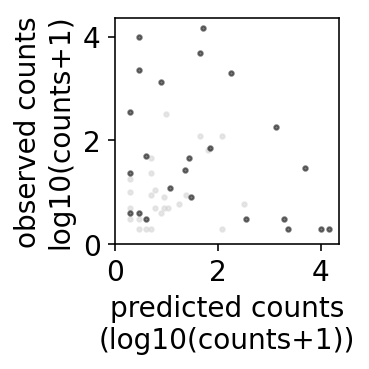

In [15]:

#record model performances here
performances=pd.DataFrame(columns=['condition','pearson','spearman','r2','fold'])
results={}


for i in range(10):
    print('=============== iteration',i)
    #define train, validation sets
    #==============================
    #randomize train/test - by position
    foldname='fold'+str(i)
    rng=np.random.RandomState(i)
    data[foldname]=get_positions_train_valid(copy.deepcopy(data['Position']),rng)
    
    data[foldname+'not']=(data[foldname]==False)
    
    data['train'+foldname]=np.multiply(data['has_effsize'],data[foldname])
    data['valid'+foldname]=np.multiply(data['has_effsize'],data[foldname+'not'])
    
    #train each model of interest
    #============================
    model2features={}
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=pheno_cols
    
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=list(set(pheno_cols).union(set([])))
    
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=list(set(pheno_cols).union(set([])))
         
    model2features['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']=list(set(impact_cols).union(set(signature_cols)))
    model2features['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']=impact_cols
    
    
    
    model2train={}
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=foldname
    
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=foldname
    
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
     
    model2train['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']='train'+foldname
    model2train['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']='train'+foldname
    
       
    model2valid={}

    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=foldname+'not'
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=foldname+'not'
    
    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']='valid'+foldname
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']='valid'+foldname
    
    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
     
    model2valid['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']='valid'+foldname

       
    model2num={}
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=1
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=2
    
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=3
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=4
    
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=5
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=6
     
    model2num['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']=9
    model2num['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']=10
    
    
    results[i]={}
    
    model_names=list(model2features.keys())
    for idx in range(len(model_names)): #['impact_train100variants']:#
        model_name=model_names[idx]
        
        features=model2features[model_name]
        performance_current_full=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                                            
                  toprint=model_name)
        print(performance_current_full[4])
        plot_performance(performance_current_full[0],'',-0.5,4)
        
        import copy
        results[i][model_name]=copy.deepcopy(performance_current_full)
        
        performance_current=performance_current_full[4]
        performance_current['fold']=foldname
        performances=pd.concat([performances,performance_current],axis=0)
        
        
        
    import copy
    import random
    model_name='Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S'
    features=model2features[model_name]
    out=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                  toprint=model_name)
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)


    
    for item in ['train','valid','all']:
        idx=list(out[0]['obs_'+item].index)
        stuff=copy.deepcopy(list(out[0]['obs_'+item]))
        #shuffle
        stuff=rng.choice(stuff,size=len(stuff),replace=False)
        out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)[0]
        print(out[0]['pred_'+item].head())
    results[i]['shuffled']=copy.deepcopy(out)
    y_pred=np.array(out[0]['pred_valid']).flatten()
    y=out[0]['obs_valid']
    
    plot_performance(out[0],'',-0.5,4)
    
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y,y_pred)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y,y_pred)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y,y_pred)[0]
    sp=str(int(100*sp)/100)
    performances_shuffled=pd.DataFrame({'condition':['shuffled'],
                                       'pearson':p,
                                       'spearman':sp,
                                       'r2':r2,
                                       'fold':[foldname]})
    performances=pd.concat([performances,performances_shuffled],axis=0)

In [17]:
performances['spearman']=pd.DataFrame(performances['spearman'],dtype=float)
performances['pearson']=pd.DataFrame(performances['pearson'],dtype=float)
performances['r2']=pd.DataFrame(performances['r2'],dtype=float)
grouped_performances=performances.groupby('condition').median()
grouped_performances['condition']=list(grouped_performances.index)
grouped_performances.index=range(grouped_performances.shape[0])
pd.set_option('display.max_colwidth', 100)
print(grouped_performances)

   pearson  spearman     r2  \
0    0.805     0.460  0.105   
1    0.780     0.805 -0.020   
2    0.765     0.805 -0.135   
3    0.805     0.460  0.105   
4    0.780     0.805 -0.020   
5    0.765     0.805 -0.135   
6    0.140     0.835 -0.185   
7    0.140     0.835 -0.185   
8   -0.140    -0.030 -1.285   

                                            condition  
0  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L  
1  Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S  
2  Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S  
3  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L  
4  Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S  
5  Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S  
6  Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S  
7  Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S  
8                                            shuffled  


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Cell. - 
 Mut. - 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=0.000e+00
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. - 
 sc-eVIP - 
Train S 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-8.534e-01
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. + 
 sc-eVIP - 
Train S 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-8.534e-01
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. - 
 sc-eVIP - 
Train L 
 Test S: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-8.537e-01
Cell. - 
 Mut. + 
 sc-eVIP + 
Train S 
 Test S v.s. Cell. + 
 Mut. + 
 sc-eVIP - 
Train L

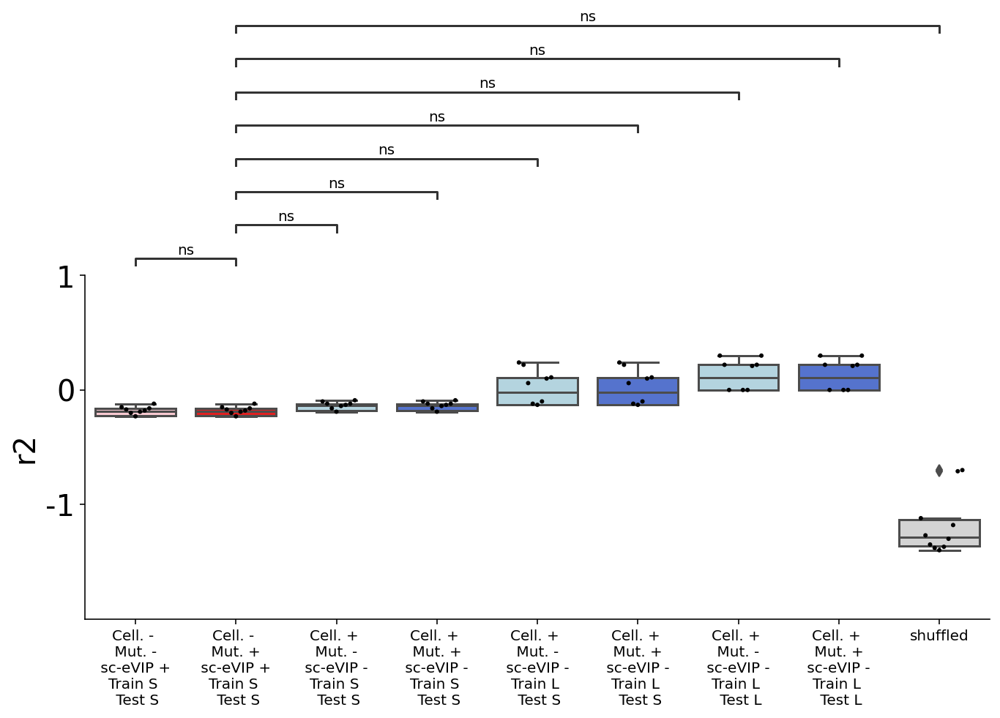

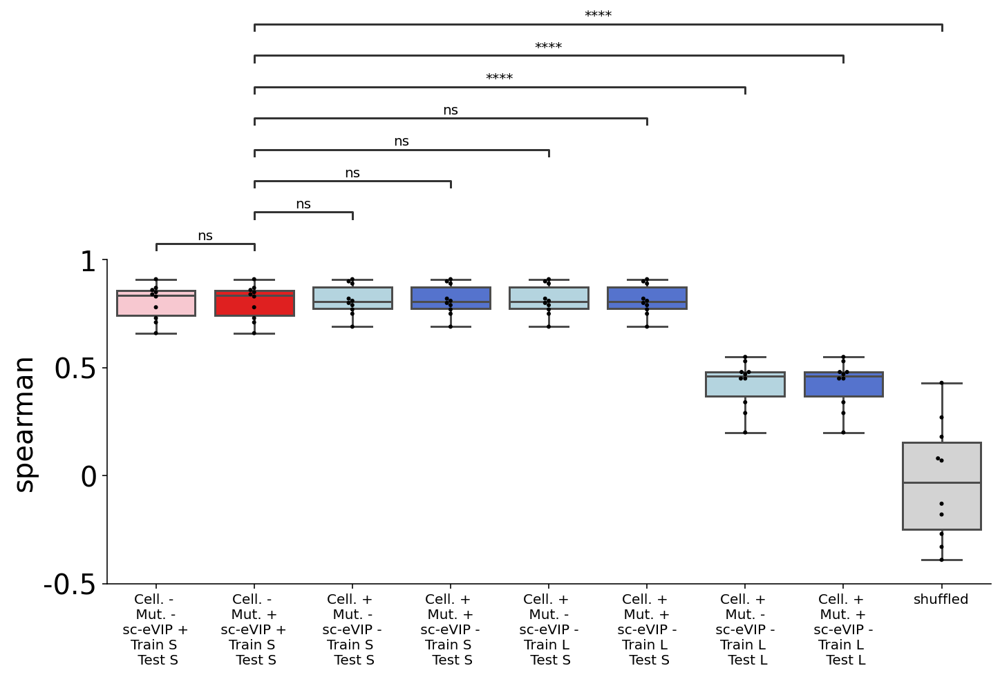

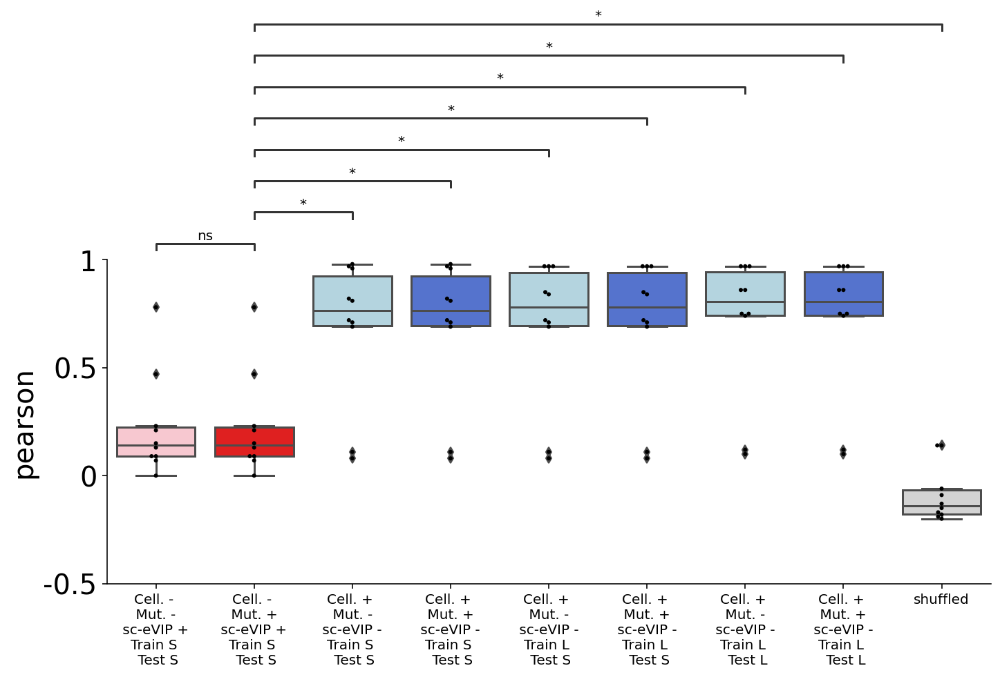

In [18]:
color_dict={}
for m in model_names:
    if 'Mut. +' in m:
        if 'sc-eVIP -' in m:
            co='royalblue'
        if 'sc-eVIP +' in m:
            co='red'
    elif 'Mut. -' in m:
        if 'sc-eVIP -' in m:
            co='lightblue'
        if 'sc-eVIP +' in m:
            co='pink'
    else:
        co='lightgray'
    color_dict[m]=co
    
color_dict['shuffled']='lightgray'

myorder=['shuffled',
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L', 
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L',
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S',  
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S', 
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S',  
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S',  
         
         'Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S',  
         'Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']
myorder=myorder[::-1]

pairs=[]
comparison='Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S'
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([-0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    g.ax.set_xticklabels(myorder,fontsize=10)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)
    
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_full.'+item+'.notLog.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_full.'+item+'.notLog.png',bbox_inches = "tight")

In [20]:
performances

,condition,pearson,spearman,r2,fold
0,Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L,0.75,0.45,0.00,fold0
0,Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L,0.75,0.45,0.00,fold0
0,Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S,0.72,0.80,-0.10,fold0
0,Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S,0.72,0.80,-0.10,fold0
0,Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S,0.72,0.80,-0.10,fold0
0,Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S,0.72,0.80,-0.10,fold0
0,Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S,0.13,0.78,-0.16,fold0
0,Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S,0.13,0.78,-0.16,fold0
0,shuffled,-0.15,-0.13,-1.30,fold0
0,Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L,0.97,0.29,0.22,fold1


r2                                                     shuffled  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S  0.630326   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S  0.552106   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S  0.552106   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L  1.000000   
shuffled                                            1.000000   

                                                    Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S                                            1.000000   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S                                            0.630326   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S                                            0.630326   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L                                            0.630326   
shuffled                                                                          

pearson                                                     shuffled  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S  0.003943   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S  0.000012   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S  0.000012   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L  0.000012   
shuffled                                            1.000000   

                                                    Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S  \
Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S                                            1.000000   
Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S                                            0.003943   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S                                            0.003943   
Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L                                            0.003943   
shuffled                                                                     

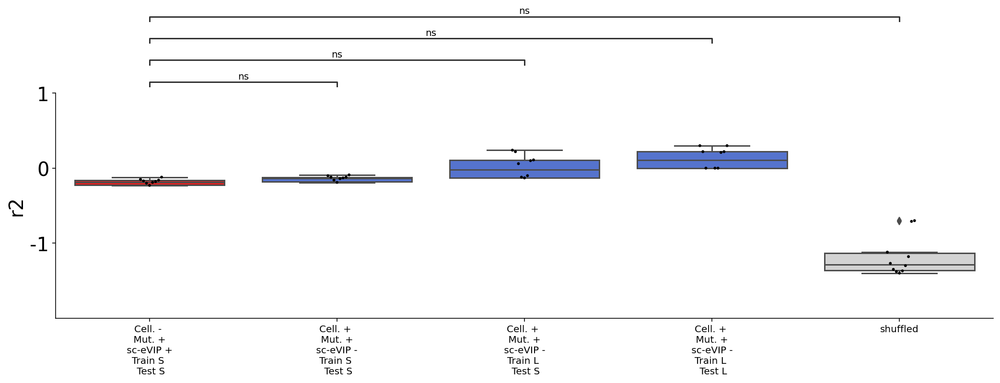

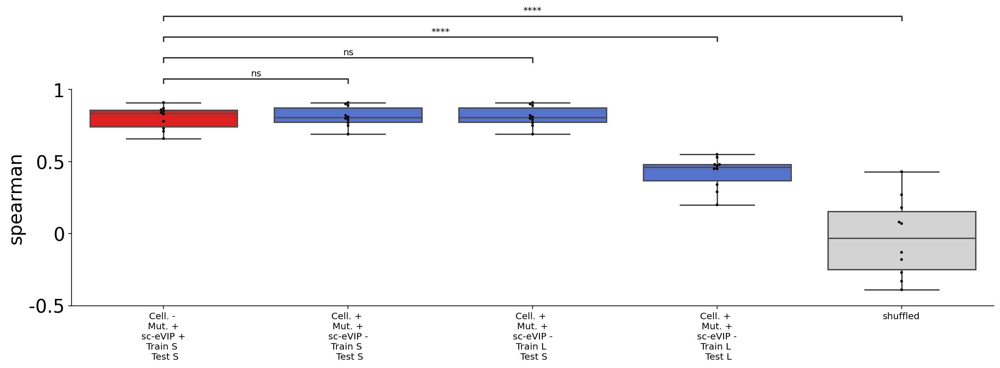

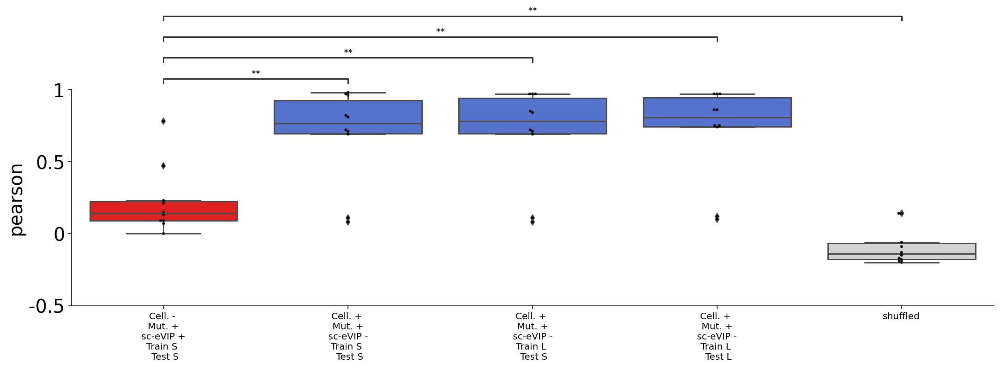

In [27]:
color_dict={}
for m in model_names:
    if 'Mut. +' in m:
        if 'sc-eVIP -' in m:
            co='royalblue'
        if 'sc-eVIP +' in m:
            co='red'
    elif 'Mut. -' in m:
        if 'sc-eVIP -' in m:
            co='lightblue'
        if 'sc-eVIP +' in m:
            co='pink'
    else:
        co='lightgray'
    color_dict[m]=co
    
color_dict['shuffled']='lightgray'

myorder=['shuffled',
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L', 
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S',  
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S',    
         
         'Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']
myorder=myorder[::-1]

pairs=[]
comparison='Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S'
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
def pairwise_ttests(df,condition,value):

    pval_m=pd.DataFrame(0.0,index=conditions,columns=conditions)

    for m1 in conditions:
        m1_values=df.loc[df[condition]==m1,value]
        for m2 in conditions:
            m2_values=df.loc[df[condition]==m2,value]

            from scipy.stats import ttest_ind
            res=ttest_ind(m1_values,m2_values,nan_policy='omit')

            pval_m.loc[m1,m2]=res[1]
            pval_m.loc[m2,m1]=pval_m.loc[m1,m2]
            
    #correct for multiple testing
    from statsmodels.stats.multitest import multipletests
    pvals=np.array(pval_m).flatten()
    new_pvals=multipletests(pvals,method='fdr_bh')[1]
    pval_m2=pd.DataFrame(new_pvals.reshape(pval_m.shape),index=pval_m.index,columns=pval_m.columns)
    return(pval_m2)

    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    
    df=pd.DataFrame({'condition':performances['condition'],
                'value':performances[item]})

    condition='condition'
    value='value'
    conditions=set(df[condition])
    pval_m=pairwise_ttests(df,'condition','value')
    print(item,pval_m.loc[myorder,:])
    pvals_anno=[]
    for pair_idx in range(len(pairs)):
        #pvals_anno.append('{:0.2e}'.format(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]]))
        pvals_anno.append(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]])
        
    
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=3)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([-0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    g.ax.set_xticklabels(myorder,fontsize=10)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                       pvalues=pvals_anno,
                                       perform_stat_test=False,
                                       #text_annot_custom=pvals_anno,
                                   text_format='star',
                                   loc='outside', verbose=2)
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.png',bbox_inches = "tight")  
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.notLog.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.notLog.png',bbox_inches = "tight")

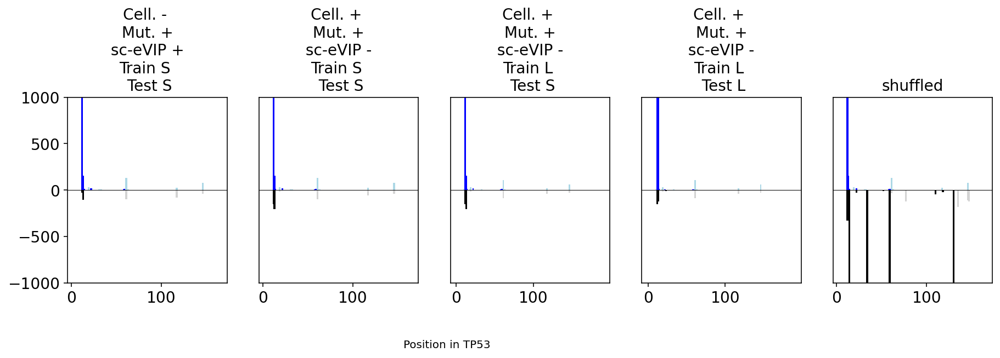

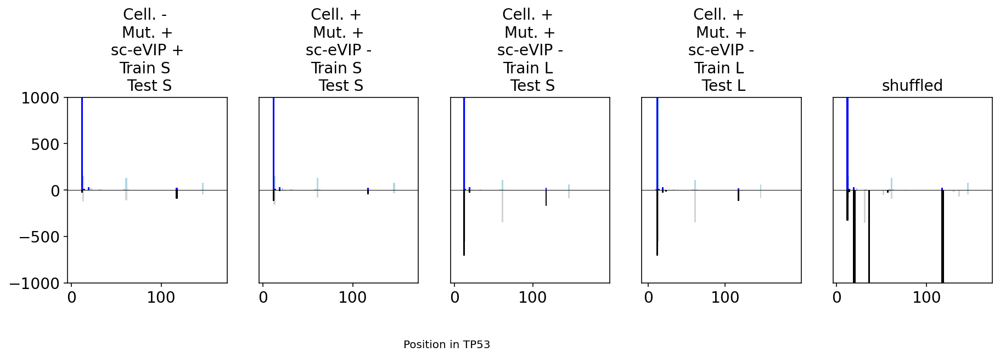

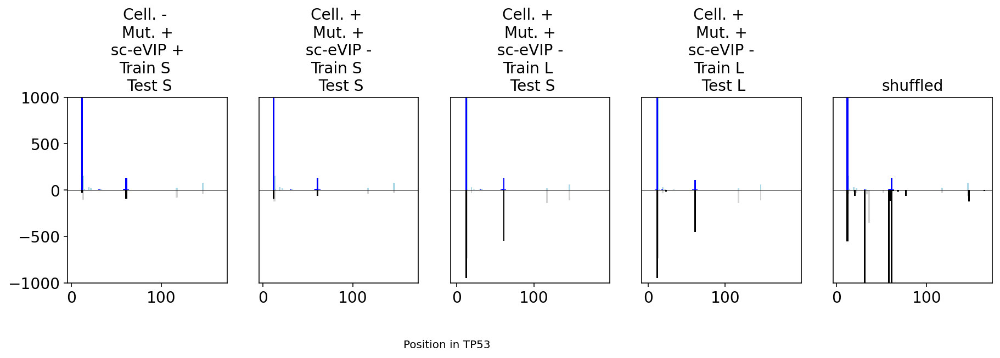

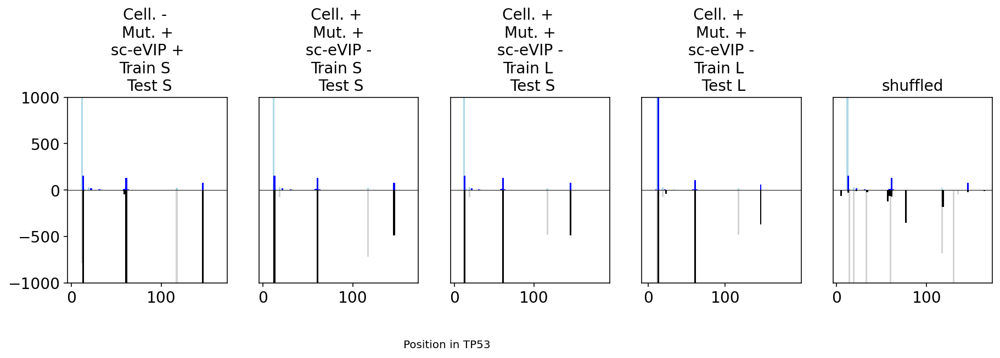

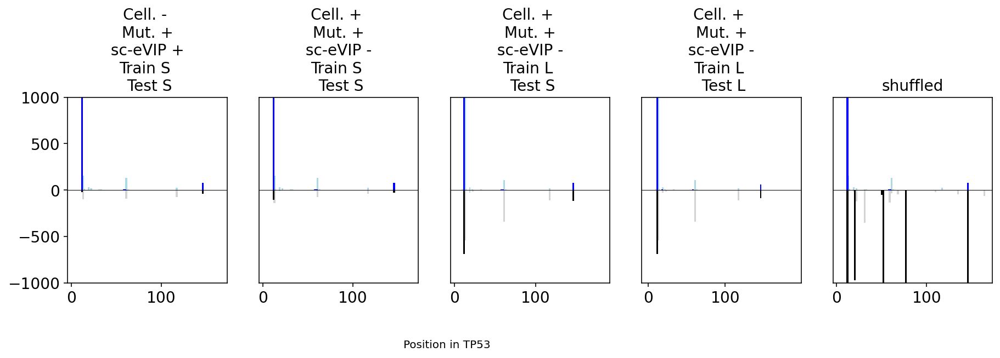

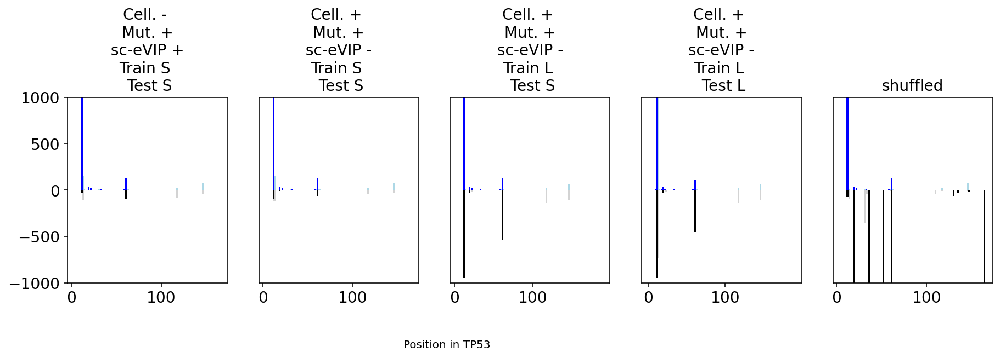

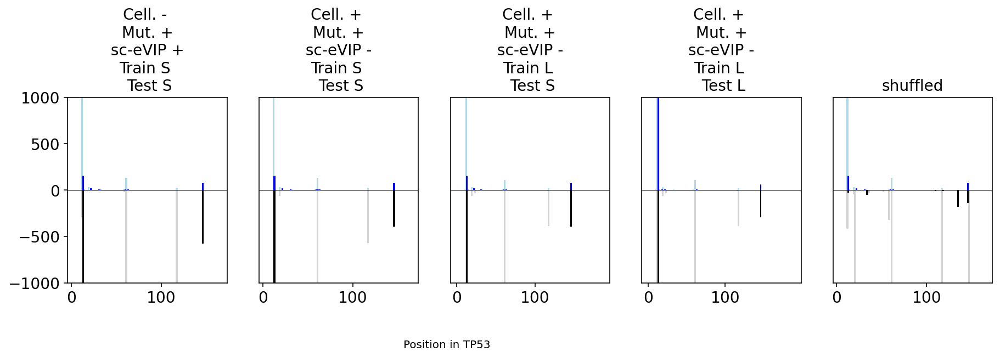

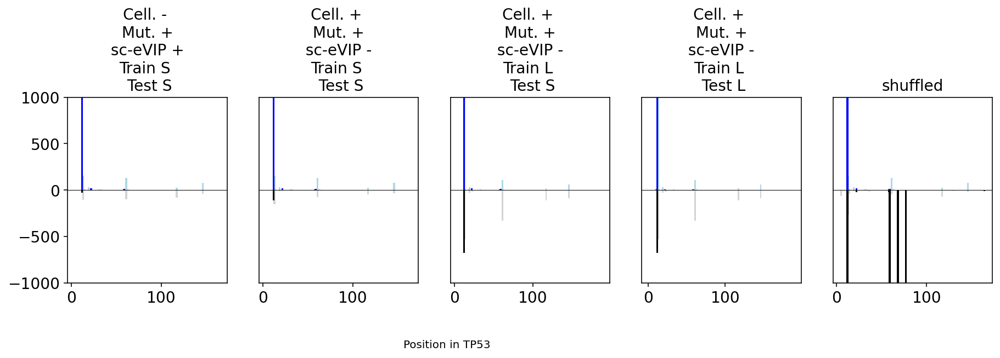

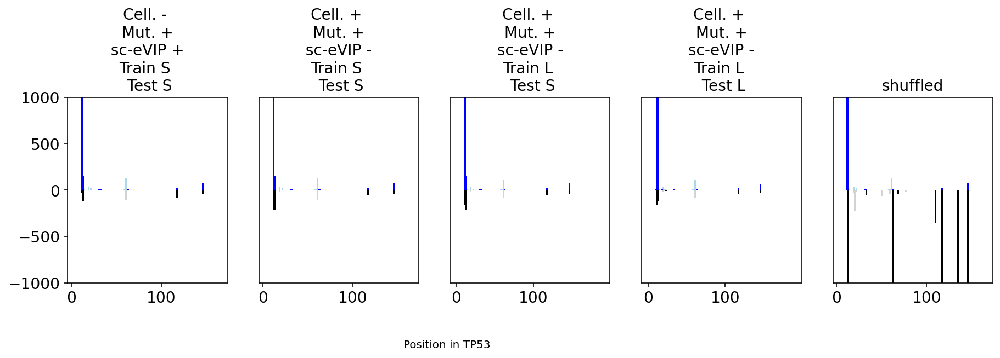

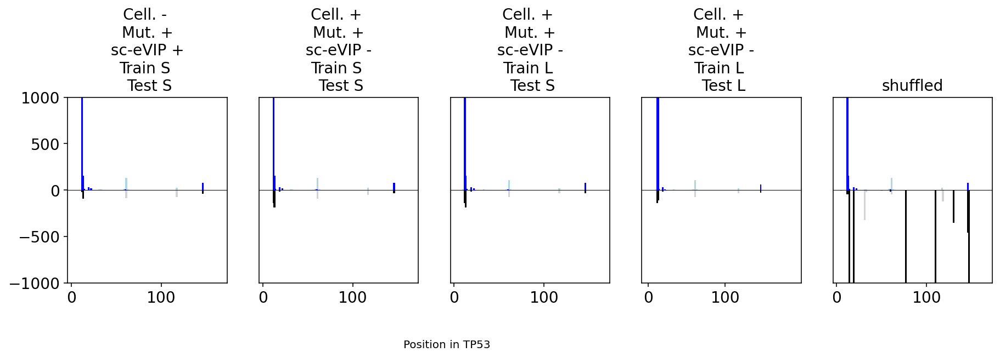

In [30]:
#make 1 of each plot

def plot_performance(preds,titlename='',mini=-0.5,maxi=5):
    fig,ax=plt.subplots(1)
    fig.set_size_inches(2,2)
    
    for item in ['train','valid']:
        if item=='train':
            c='lightgray'
        if item=='valid':
            c='black'
        ax.scatter(np.log10(preds['pred_'+item]+1),
            np.log10(preds['obs_'+item].loc[preds['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        ###ax.set_xlim(mini,maxi)
        ###ax.set_ylim(mini,maxi)        
        ###ax.set_xticks([])
        
        ax.set_yticks([0,maxi/2,maxi])
        ax.set_ylabel('observed counts\n(log10(counts+1))')
        ax.set_ylabel('')
        ax.grid(False)
        
    ax.set_xticks([0,maxi/2,maxi])
    ax.set_xlabel('predicted counts\n(log10(counts+1))')
    ax.set_title(titlename)
    ax.set_ylabel('observed counts\nlog10(counts+1)')
    return(ax)

def get_pred_by_position(y_here,data_with_position):
    df=pd.DataFrame(y_here,index=y_here.index)
    df['posi']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('posi').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)


    
def avg_by_position(named_scores,data_with_position):
    
    df=pd.DataFrame(named_scores,index=named_scores.index)
    df['position']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('position').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)
    

def plot_pos_pred(pred_train,obs_train,pred_valid,obs_valid,data_with_position,ax):
    
    pred_train_pos=avg_by_position(pred_train,data_with_position)
    obs_train_pos=avg_by_position(obs_train,data_with_position)
    pred_valid_pos=avg_by_position(pred_valid,data_with_position)
    obs_valid_pos=avg_by_position(obs_valid,data_with_position)
    
    lw=2
    ax.bar(pred_train_pos.loc[:,'pos'],
           -pred_train_pos.iloc[:,0],color='lightgray',width=lw)
    ax.bar(obs_train_pos.loc[:,'pos'],
           obs_train_pos.iloc[:,0],color='lightblue',width=lw)
    ax.bar(pred_valid_pos.loc[:,'pos'],
           -pred_valid_pos.iloc[:,0],color='black',width=lw)
    ax.bar(obs_valid_pos.loc[:,'pos'],
           obs_valid_pos.iloc[:,0],color='blue',width=lw)
    ax.grid(False)
    ax.axhline(y=0,color='black',linewidth=0.5)


for i in range(10):
    fig_pos,plots_pos=plt.subplots(1,len(myorder))
    x=3
    fig_pos.set_size_inches(len(myorder)*x,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        plot_pos_pred(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                  data,
                    plots_pos[idx])
        if idx!=0:
            plots_pos[idx].set_yticks([])
        plots_pos[idx].set_title(model_name)
        plots_pos[idx].set_ylim(-1000,1000)
    fig_pos.text(0.5, -0.15, 'Position in TP53', ha='center')
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.pos'+str(i)+'.notLog.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.pos'+str(i)+'.notLog.png',bbox_inches = "tight")
    
    

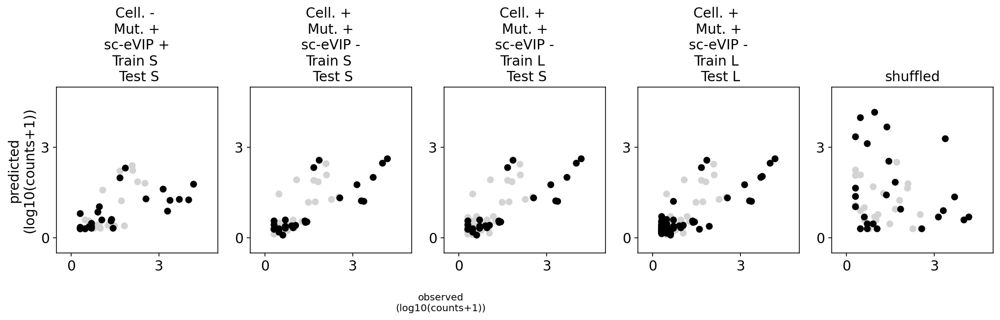

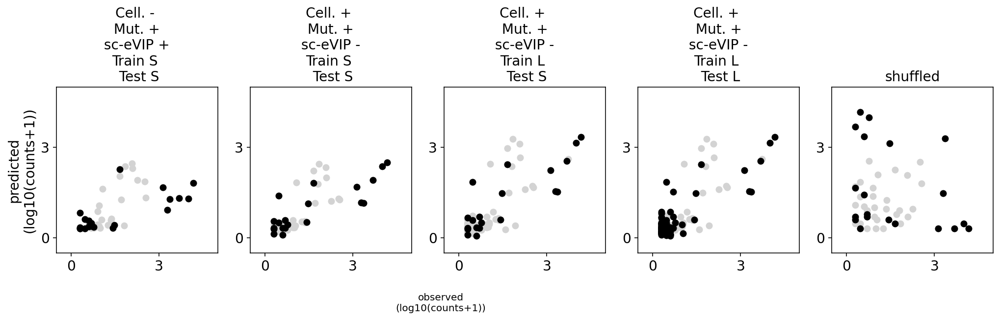

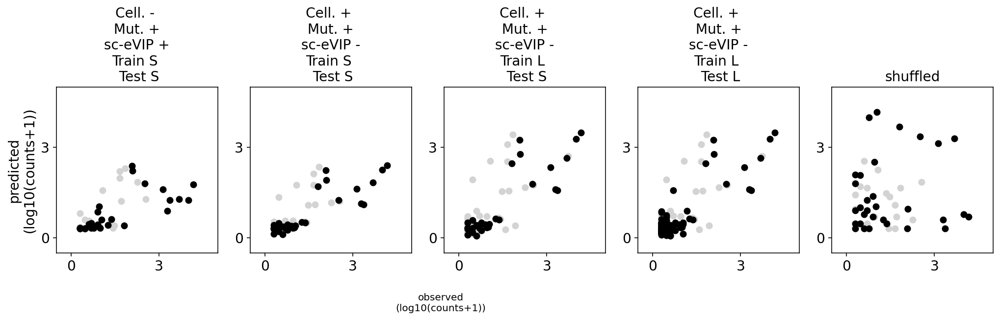

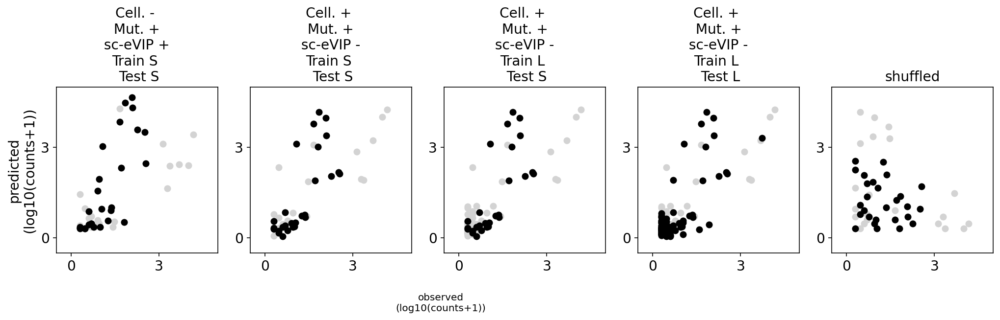

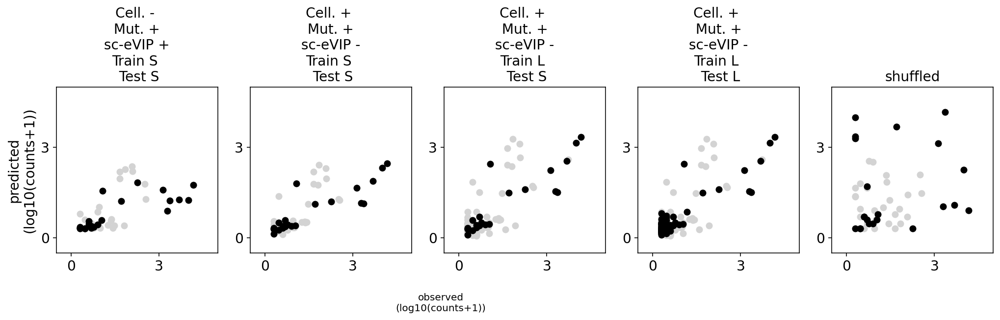

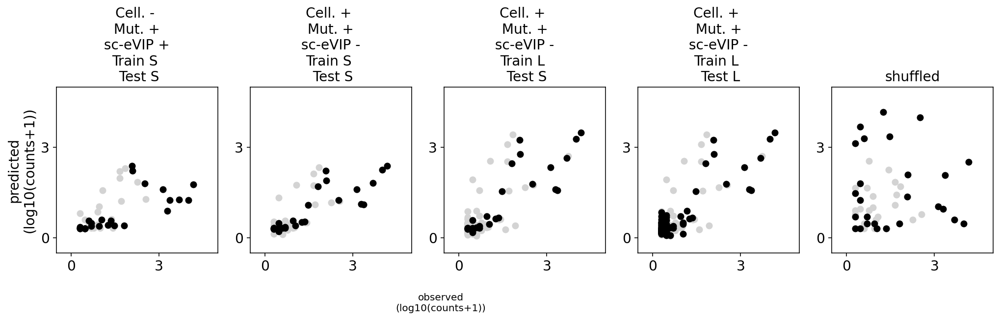

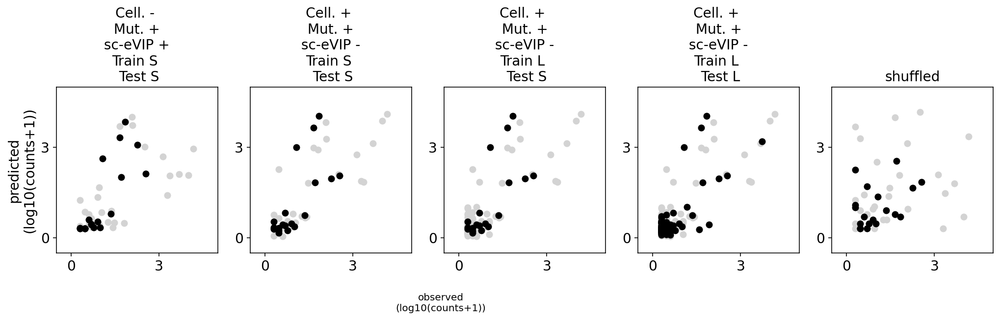

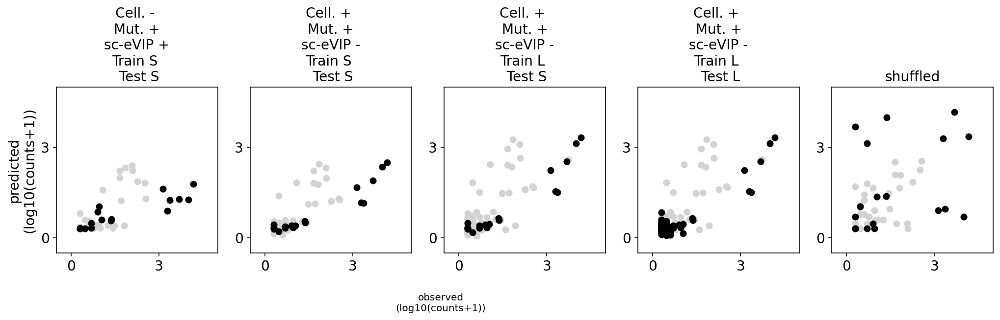

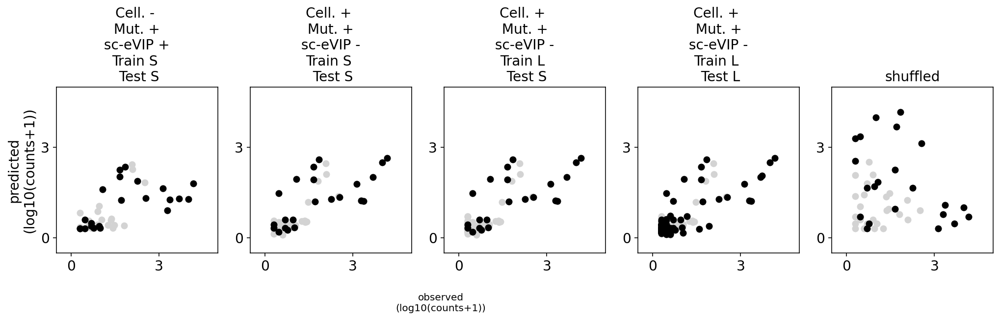

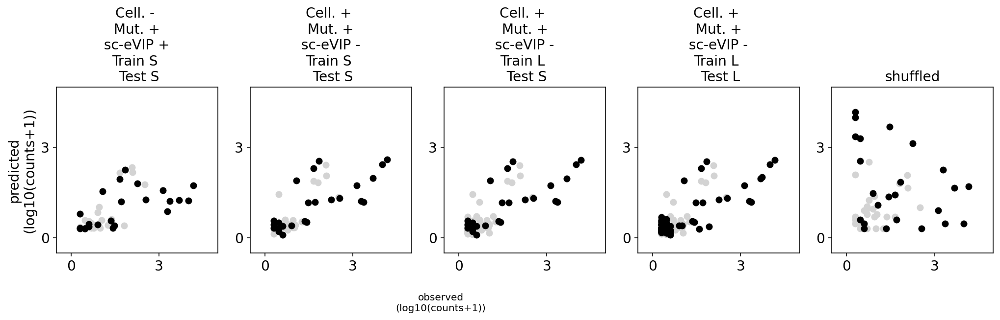

In [31]:
def scatter_pred_obs(pred_train,obs_train,pred_valid,obs_valid,ax,log_it=False):
    
    if not log_it:
        ax.scatter(obs_train,pred_train,color='lightgray')
        ax.scatter(obs_valid,pred_valid,color='black')
    if log_it:
        
        ax.scatter(np.log10(obs_train+1),np.log10(pred_train+1),color='lightgray')
        ax.scatter(np.log10(obs_valid+1),np.log10(pred_valid+1),color='black')

    

for i in range(10):
    fig_scatter,plots_scatter=plt.subplots(1,len(myorder))
    x=3
    fig_scatter.set_size_inches(len(myorder)*x+2,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        scatter_pred_obs(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                    plots_scatter[idx],log_it=True)
        if idx!=0:
            plots_scatter[idx].set_yticks([])
        plots_scatter[idx].set_title(model_name)
        plots_scatter[idx].grid(False)
        if idx==0:
            plots_scatter[idx].set_ylabel('predicted\n(log10(counts+1))')
        
        plots_scatter[idx].set_ylim(-0.5,5)
        plots_scatter[idx].set_xlim(-0.5,5)
        plots_scatter[idx].set_xticks([0,3])
        plots_scatter[idx].set_yticks([0,3])
    fig_scatter.text(0.5, -0.15, 'observed\n(log10(counts+1))', ha='center')
        
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.scatter'+str(i)+'.notLog.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.scatter'+str(i)+'.notLog.png',bbox_inches = "tight")

FOLD: ================ 0
train effect 24
vali effect 25
train Mutation
A146T    181
Q61H     325
Q61L     120
Q61R     122
Q61K      63
L19F      29
K117N     44
A146V     50
D33E       8
A146P     11
E63K       9
K5E        4
I36M       3
R135T      1
T20R       1
Q61P      17
G60D       7
T20M       5
E31K       5
G60V       3
K117R      2
K147N      2
S136N      2
G77A       1
Name: COSMIC.1, dtype: int64


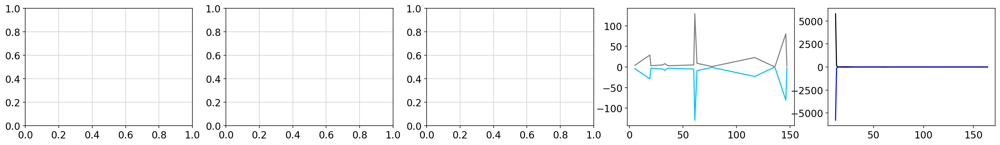

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.67     0.78  0.08


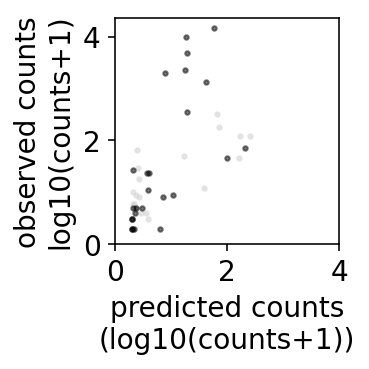

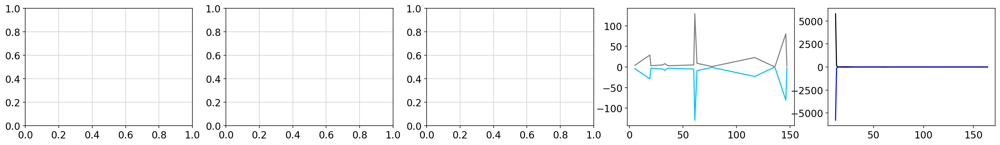

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.67     0.78  0.08


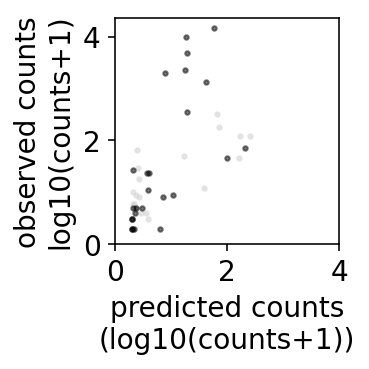

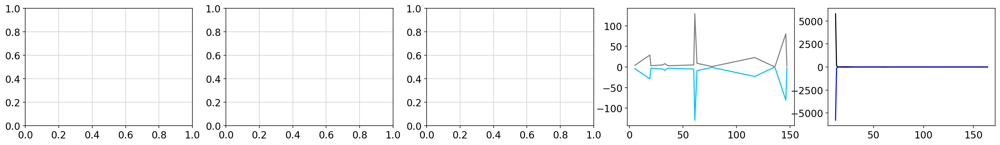

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.81      0.8  0.38


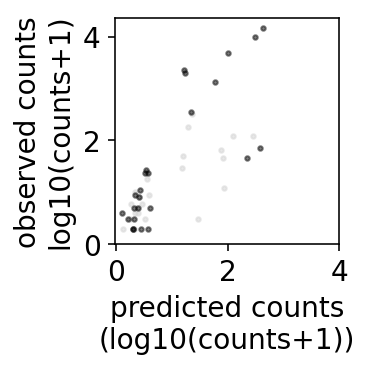

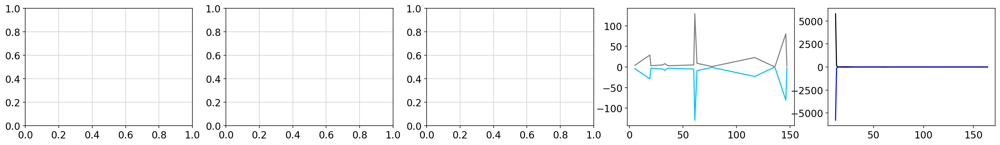

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.81      0.8  0.38


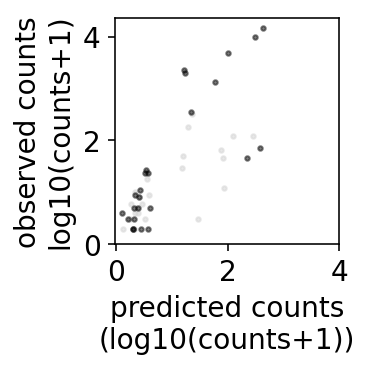

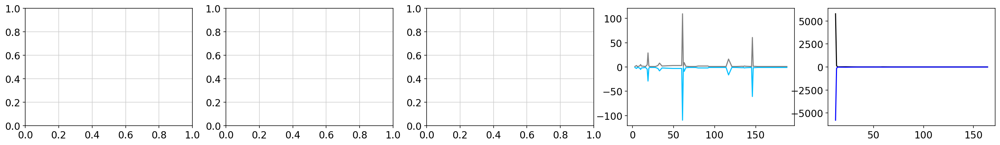

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.81      0.8  0.38


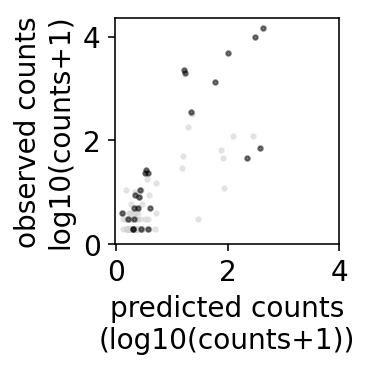

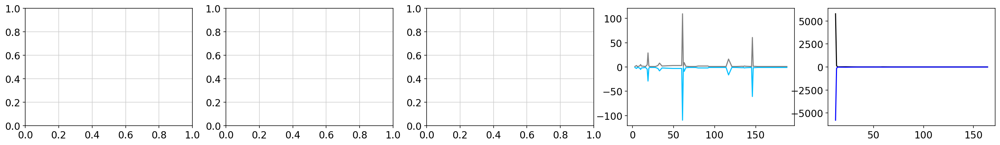

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.81      0.8  0.38


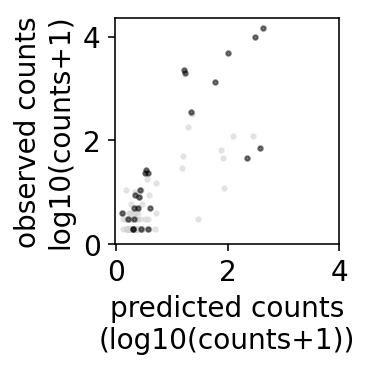

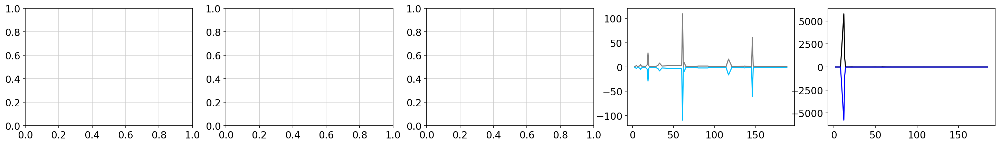

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.83     0.45  0.55


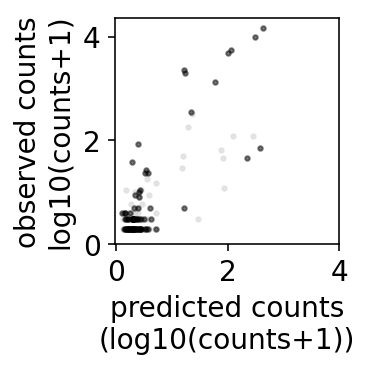

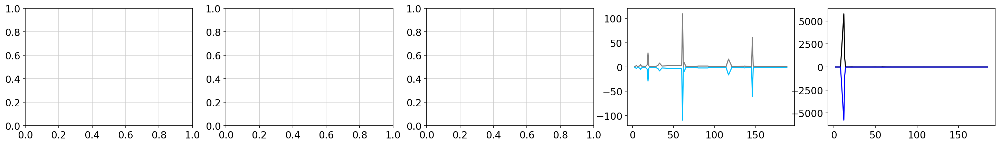

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.83     0.45  0.55


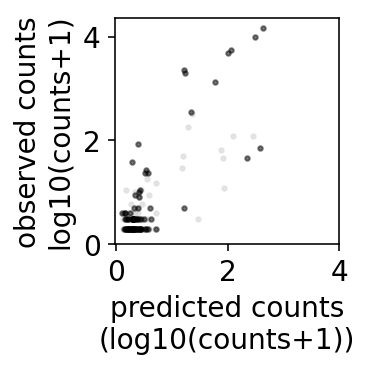

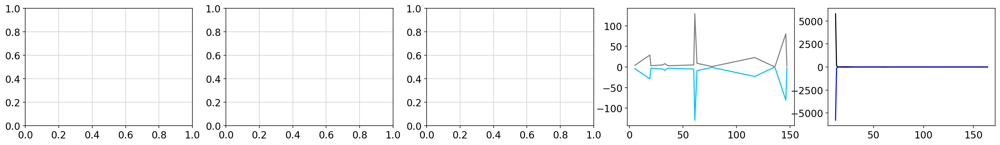

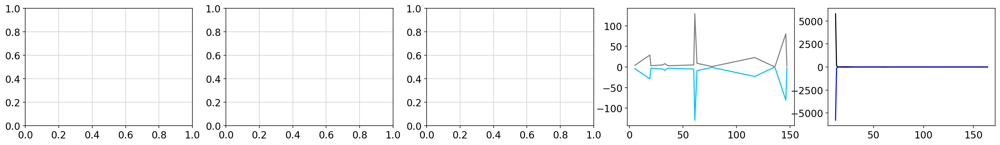

FOLD: ================ 1
train effect 29
vali effect 20
train Mutation
A146T    181
Q61H     325
G13C     355
Q61L     120
Q61R     122
Q61K      63
A146V     50
Q22K      22
G13V      44
D33E       8
A59G       8
R164Q      2
A59T      23
A146P     11
E63K       9
K5E        4
P110S      1
A59E       7
Q61P      17
A130V      2
G13R      69
T58I      10
G60D       7
E31K       5
T50I       4
G60V       3
S136N      2
L52F       1
G77A       1
Name: COSMIC.1, dtype: int64


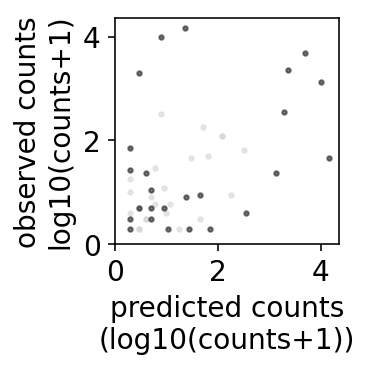

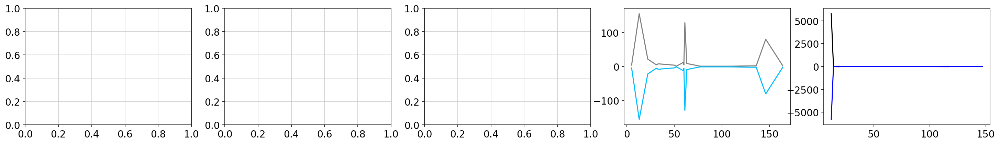

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.72     0.73  0.12


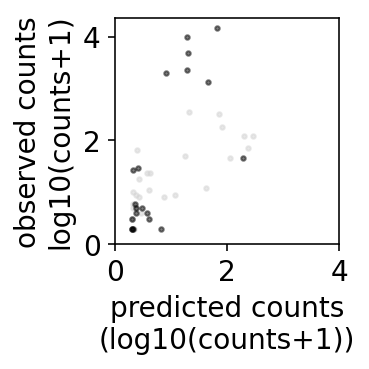

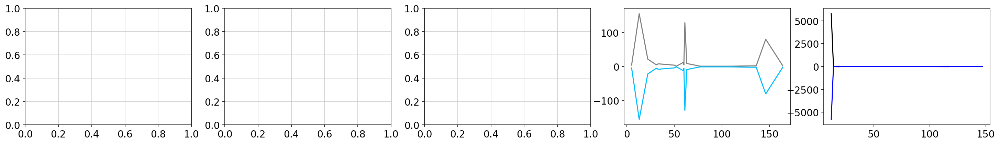

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.72     0.73  0.12


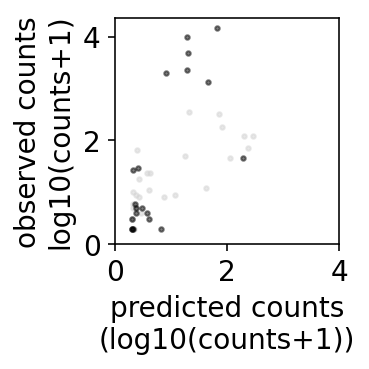

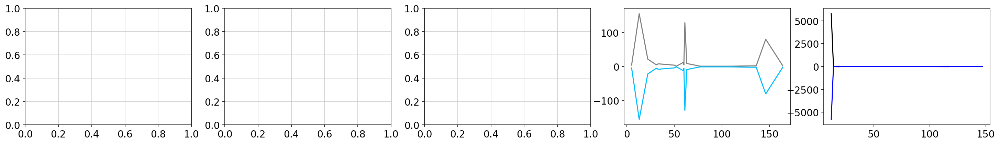

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.84     0.77  0.41


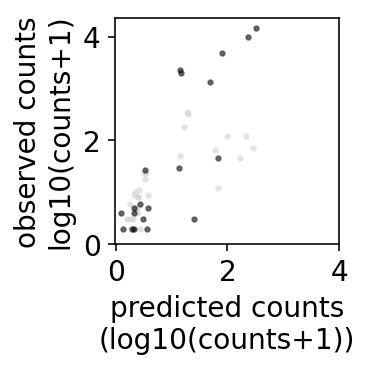

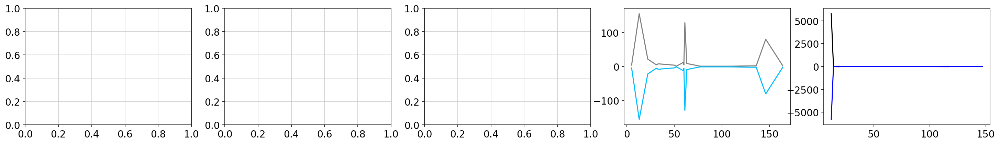

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.84     0.77  0.41


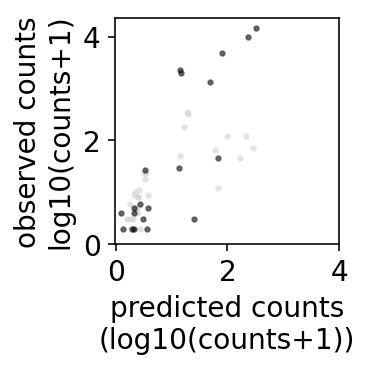

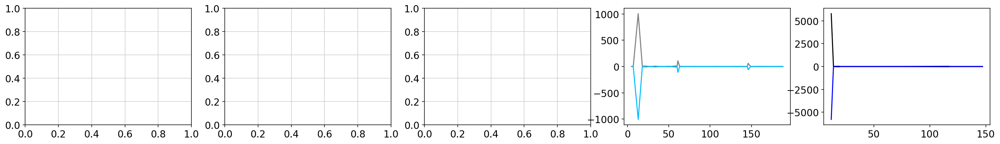

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.84     0.77  0.64


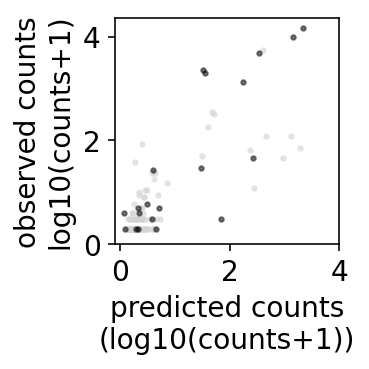

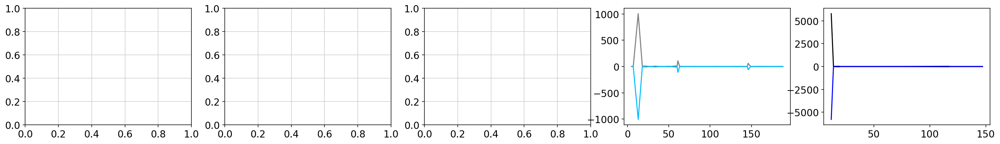

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.84     0.77  0.64


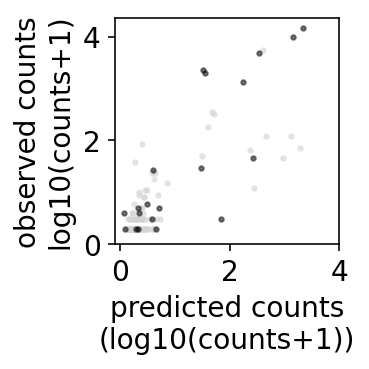

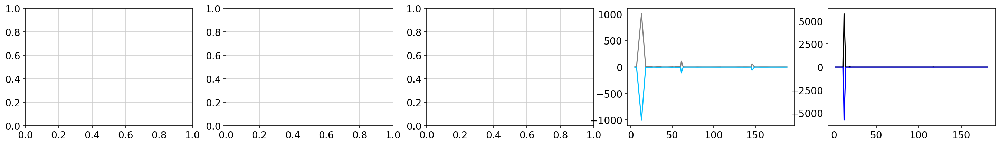

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.85     0.29  0.69


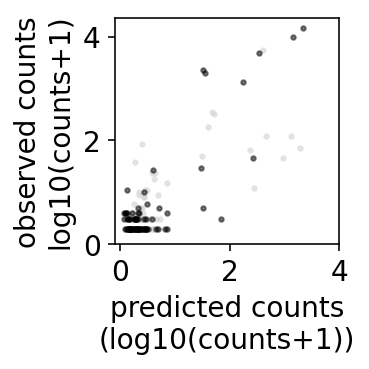

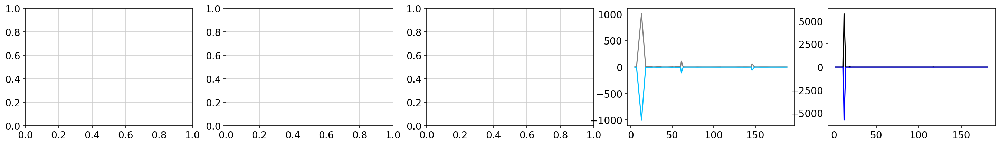

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.85     0.29  0.69


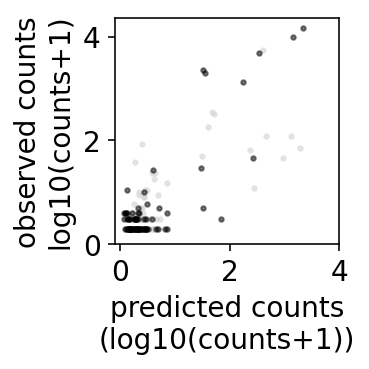

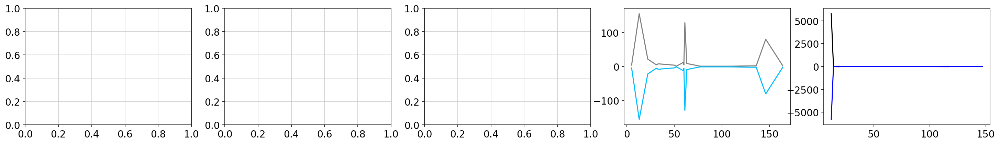

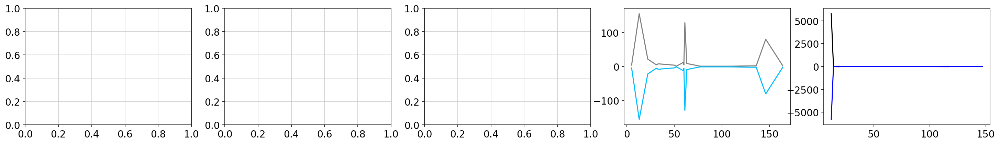

FOLD: ================ 2
train effect 18
vali effect 31
train Mutation
A146T    181
G13C     355
L19F      29
K117N     44
A146V     50
Q22K      22
G13V      44
D33E       8
A146P     11
K5E        4
I36M       3
V14I      26
P34L       4
G13R      69
K117R      2
S136N      2
L52F       1
V14L       1
Name: COSMIC.1, dtype: int64


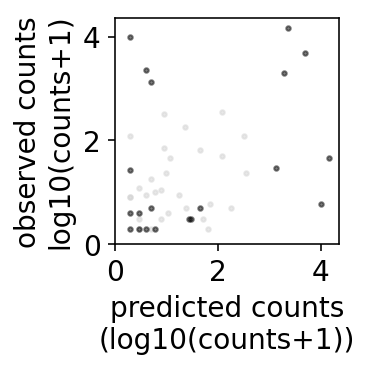

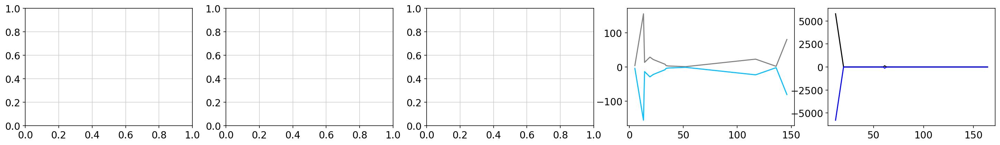

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.72     0.84  0.17


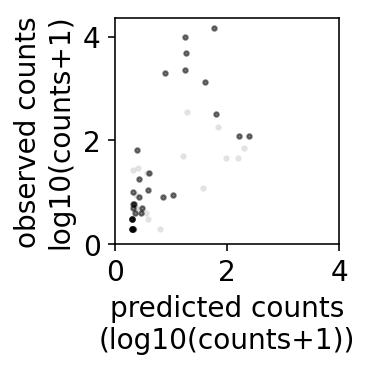

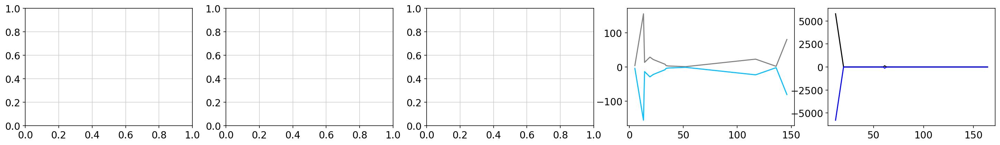

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.72     0.84  0.17


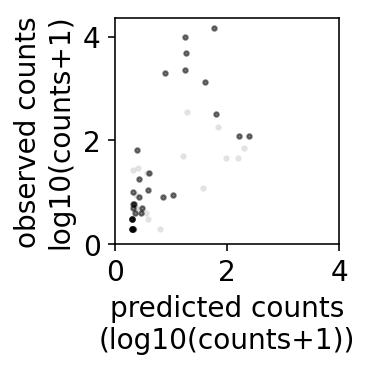

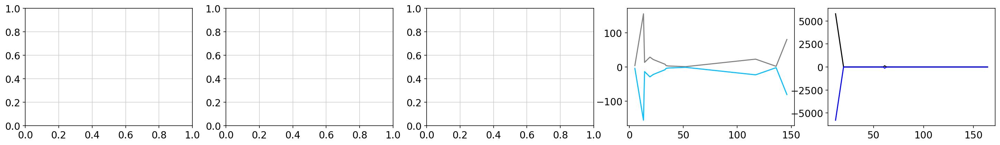

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.86     0.82  0.38


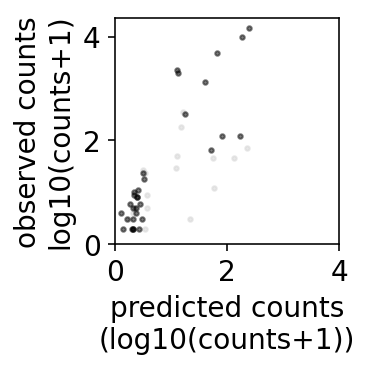

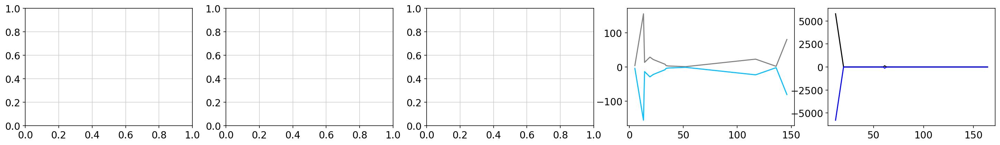

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.86     0.82  0.38


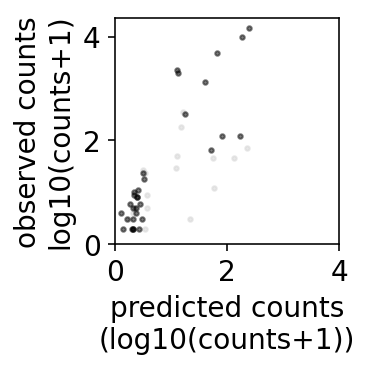

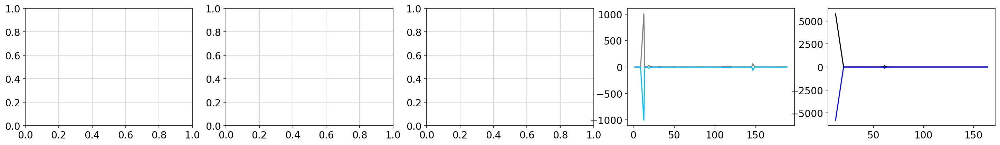

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.87     0.82  0.66


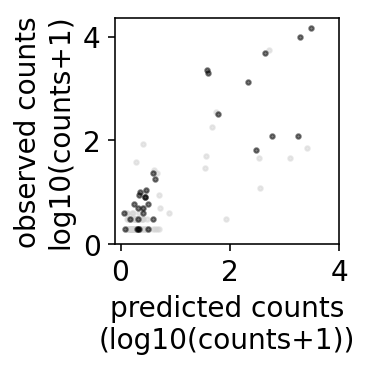

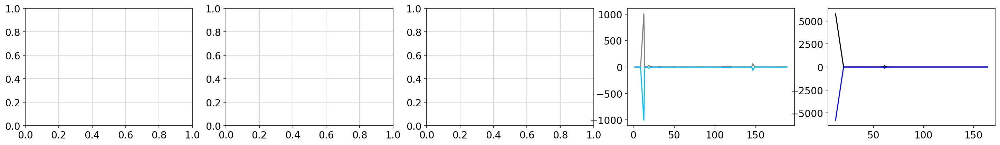

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.87     0.82  0.66


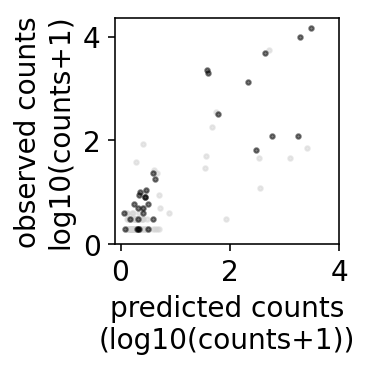

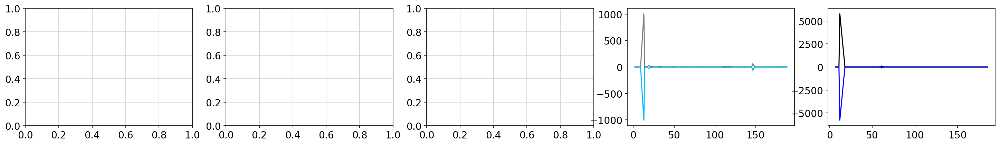

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.86     0.47  0.71


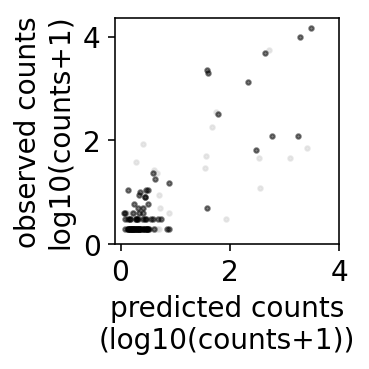

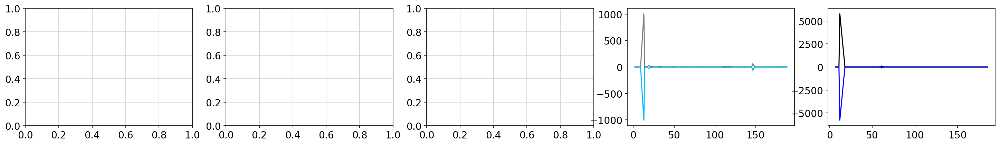

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.86     0.47  0.71


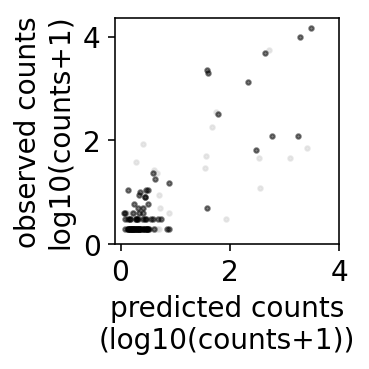

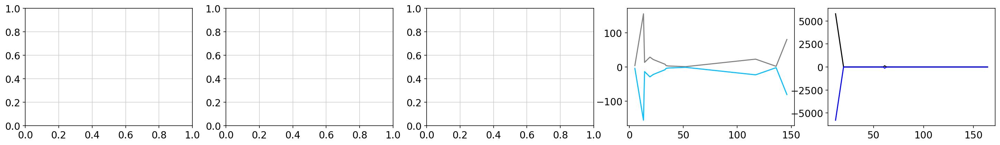

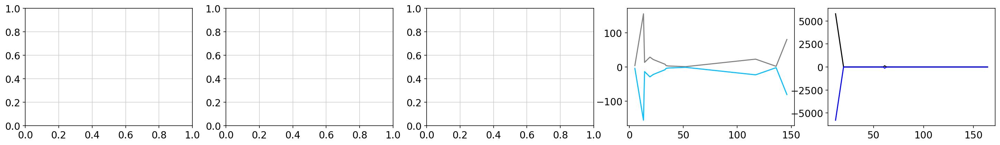

FOLD: ================ 3
train effect 22
vali effect 27
train Mutation
G12D     14489
G12V      9830
G12C      4792
G12A      2297
G12R      1354
G12S      1940
L19F        29
K117N       44
D33E         8
R68S         4
R135T        1
V14I        26
T20R         1
A130V        2
G60D         7
T20M         5
T50I         4
G60V         3
K117R        2
K147N        2
L52F         1
V14L         1
Name: COSMIC.1, dtype: int64


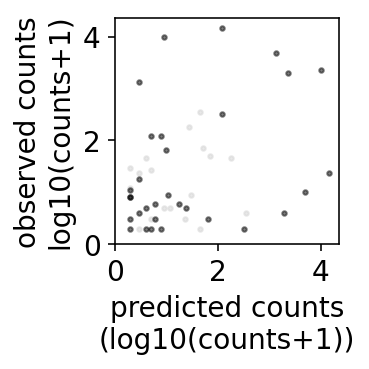

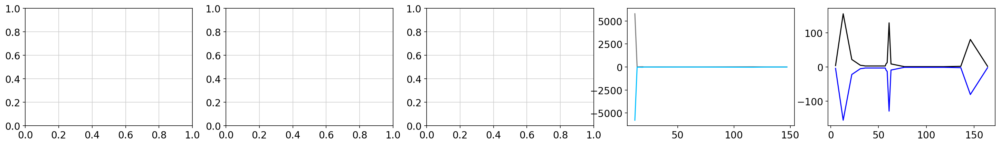

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.77     0.83  -1.76


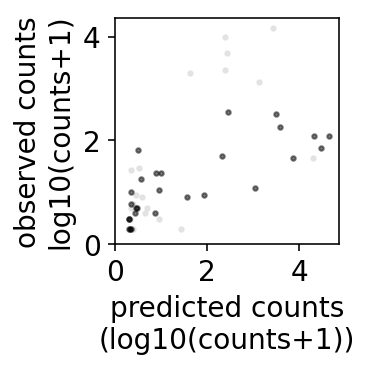

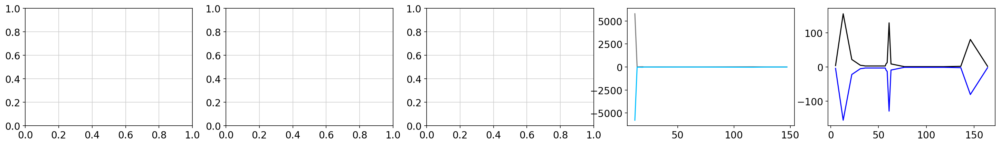

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.77     0.83  -1.76


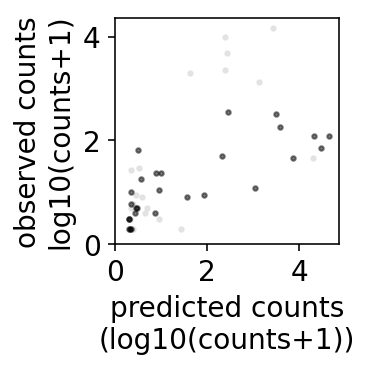

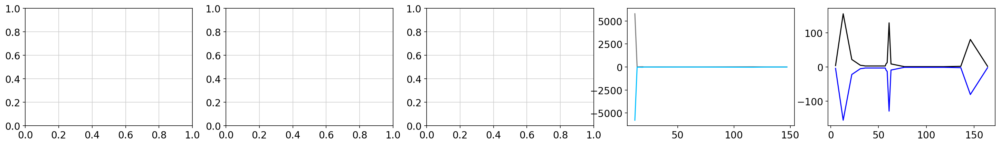

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.74     0.81  -0.93


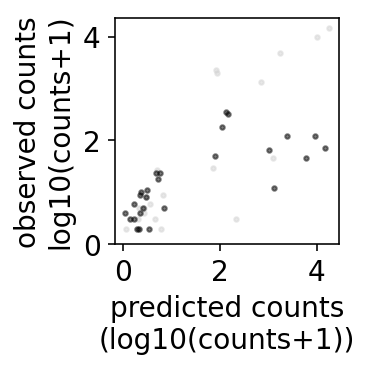

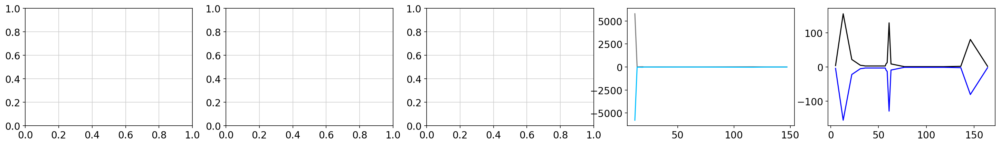

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.74     0.81  -0.93


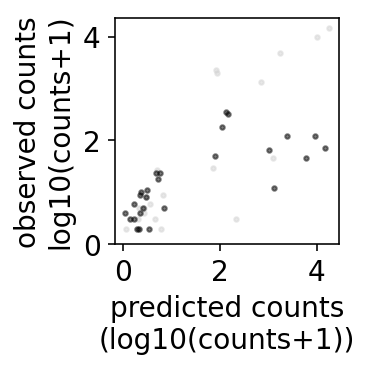

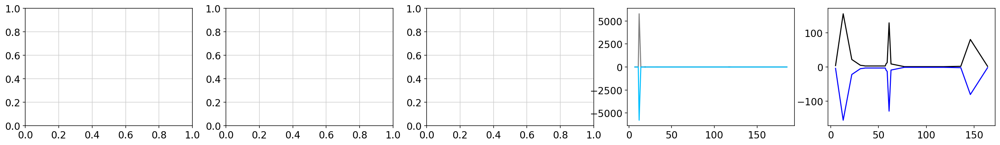

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.74     0.81  -0.93


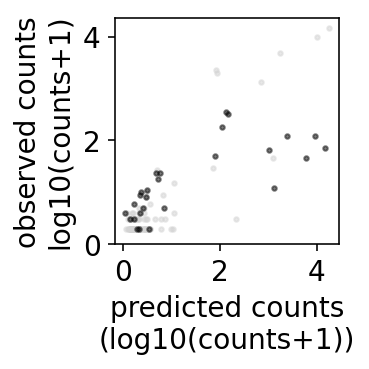

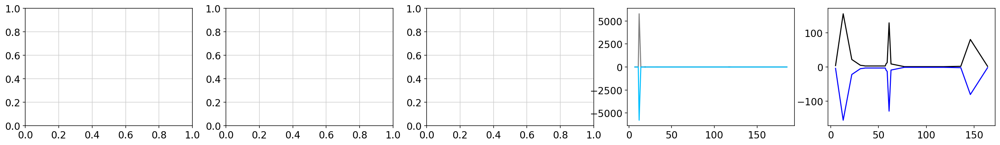

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.74     0.81  -0.93


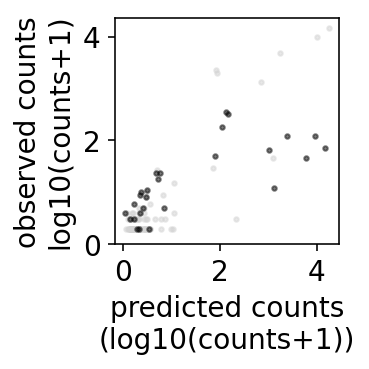

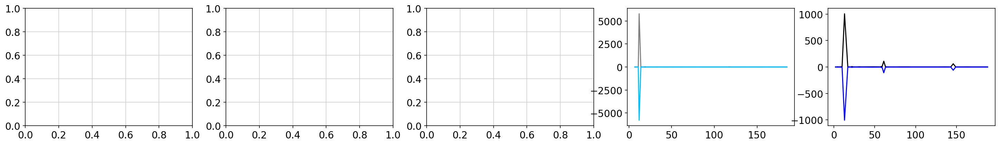

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.75     0.45  0.09


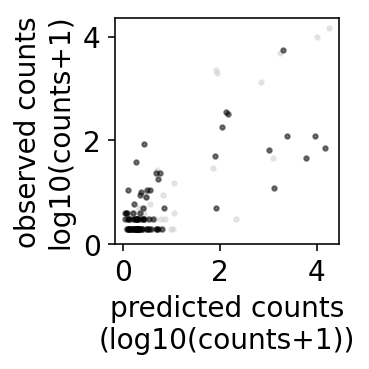

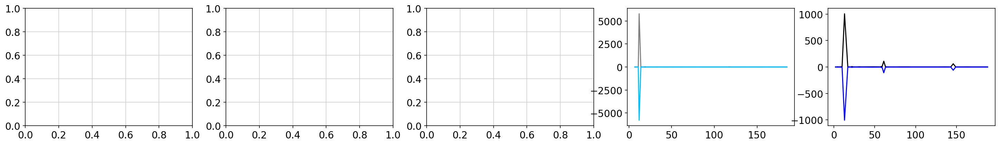

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.75     0.45  0.09


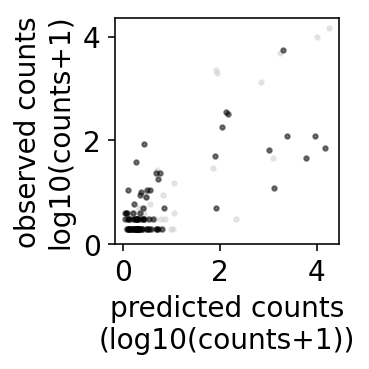

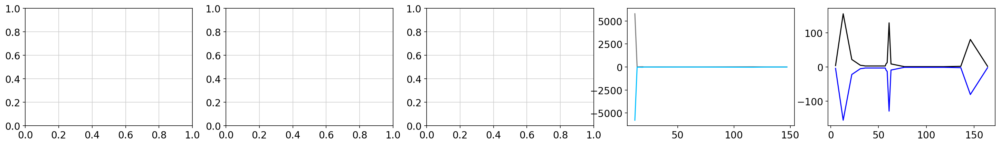

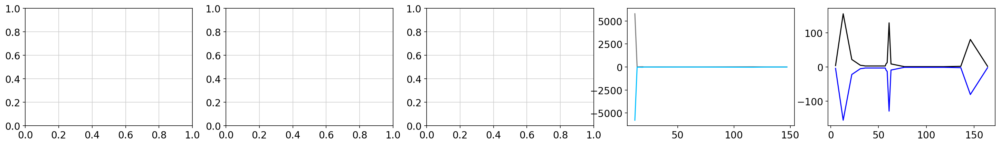

FOLD: ================ 4
train effect 27
vali effect 22
train Mutation
Q61H     325
G13C     355
Q61L     120
Q61R     122
Q61K      63
L19F      29
K117N     44
Q22K      22
G13V      44
D33E       8
A59G       8
R164Q      2
A59T      23
E63K       9
R68S       4
K5E        4
P110S      1
R135T      1
V14I      26
A59E       7
Q61P      17
A130V      2
G13R      69
E31K       5
D57N       3
K117R      2
V14L       1
Name: COSMIC.1, dtype: int64


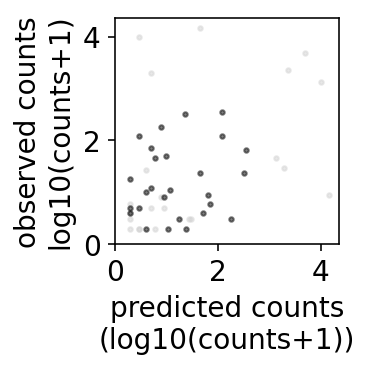

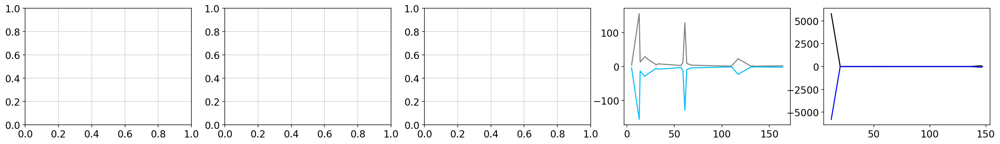

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.79     0.86  0.16


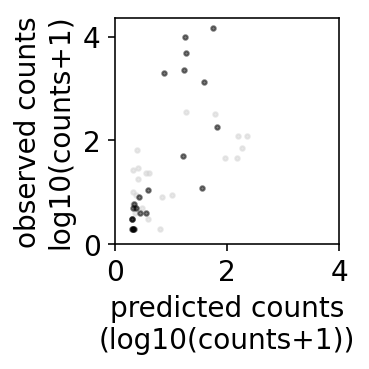

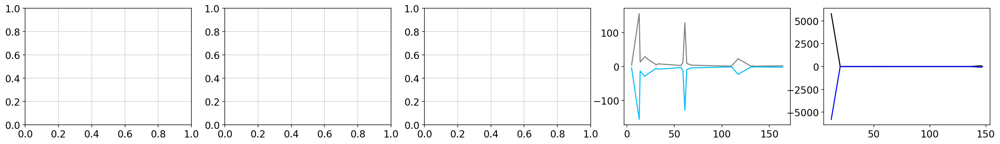

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.79     0.86  0.16


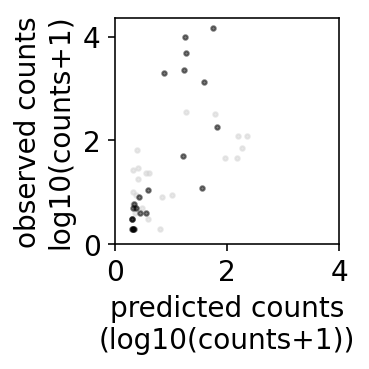

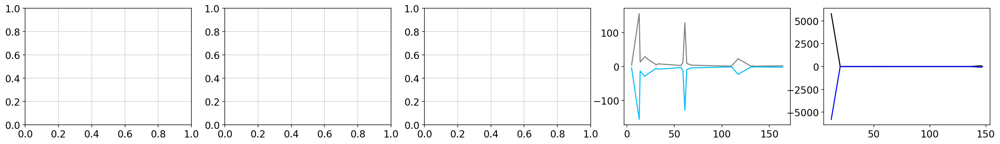

                                           condition pearson spearman   r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.88     0.91  0.4


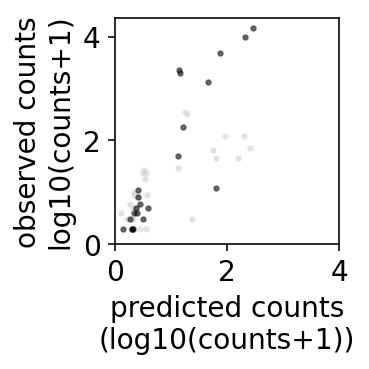

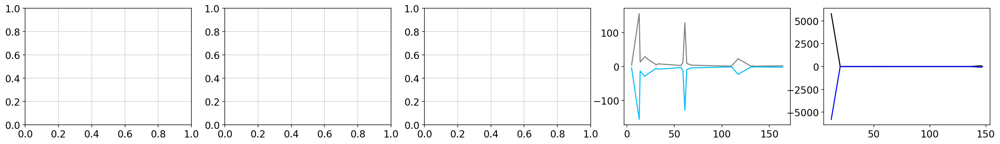

                                           condition pearson spearman   r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.88     0.91  0.4


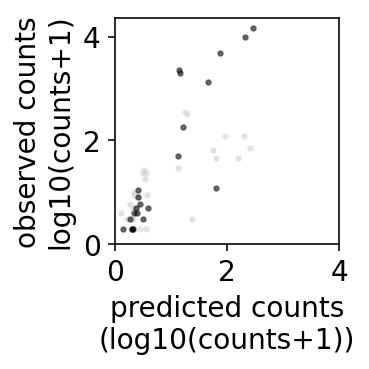

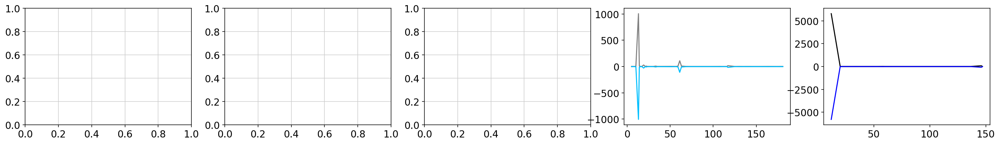

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.88     0.91  0.66


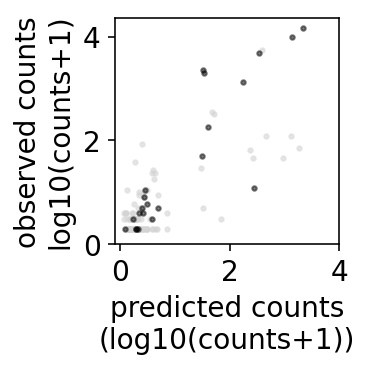

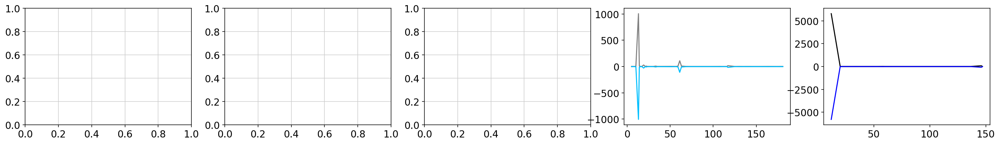

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.88     0.91  0.66


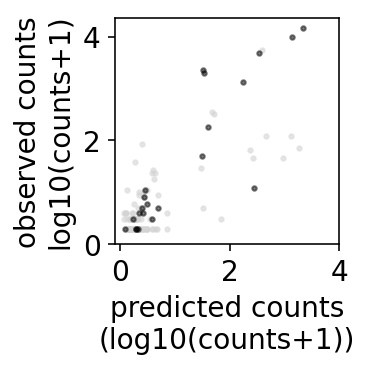

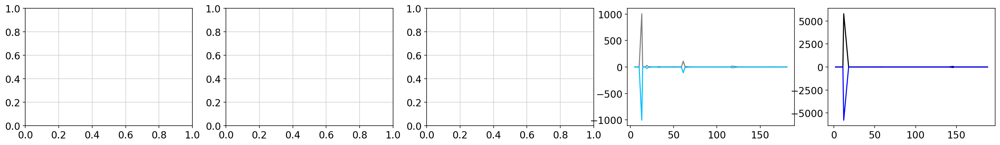

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...     0.9     0.55  0.76


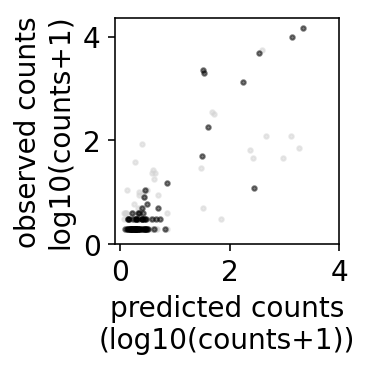

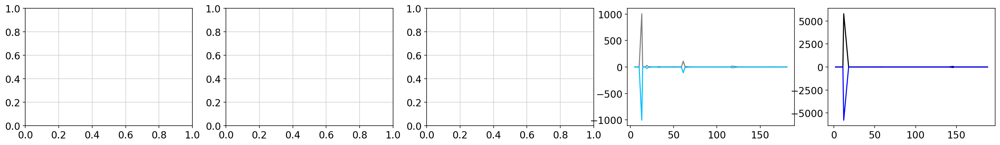

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...     0.9     0.55  0.76


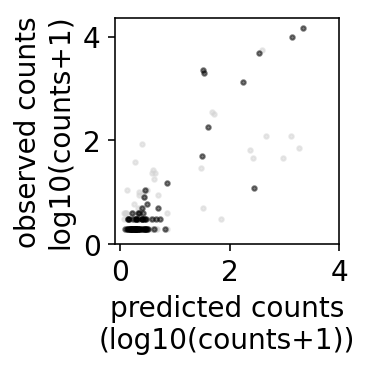

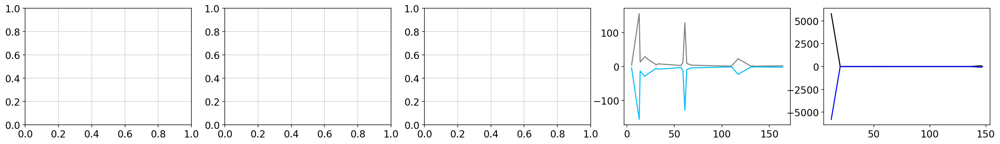

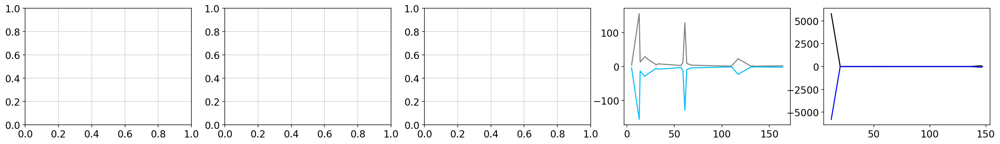

FOLD: ================ 5
train effect 23
vali effect 26
train Mutation
A146T    181
G13C     355
K117N     44
A146V     50
G13V      44
A59G       8
A59T      23
A146P     11
E63K       9
P110S      1
V14I      26
A59E       7
T20R       1
P34L       4
G13R      69
G60D       7
T20M       5
E31K       5
T50I       4
D57N       3
G60V       3
K117R      2
V14L       1
Name: COSMIC.1, dtype: int64


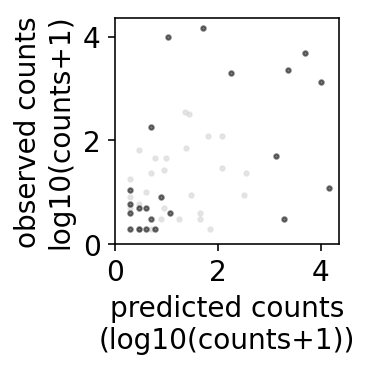

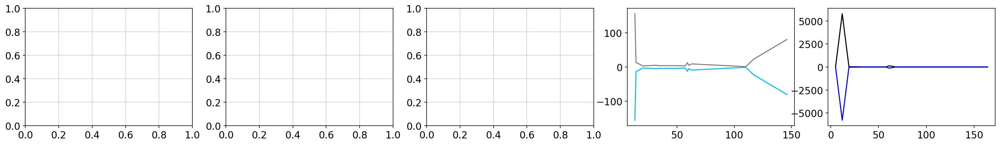

                                           condition pearson spearman   r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.72     0.85  0.1


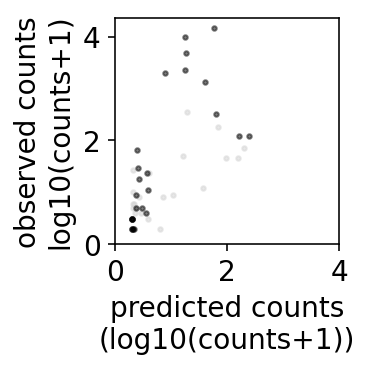

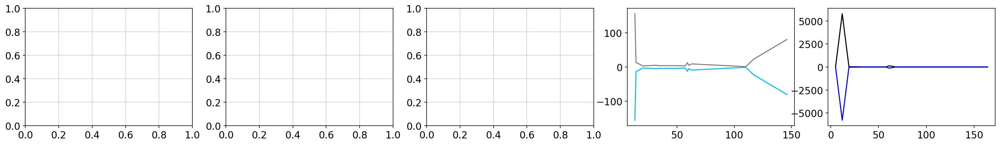

                                           condition pearson spearman   r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.72     0.85  0.1


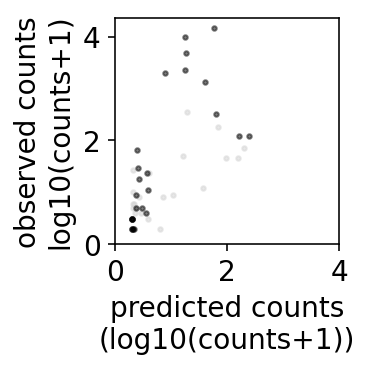

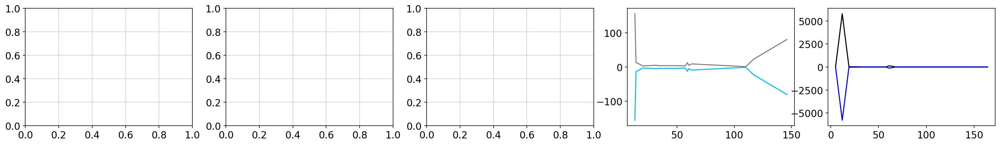

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.86      0.9  0.37


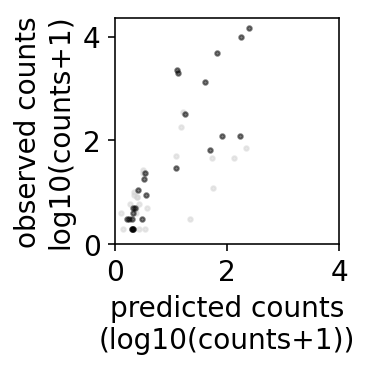

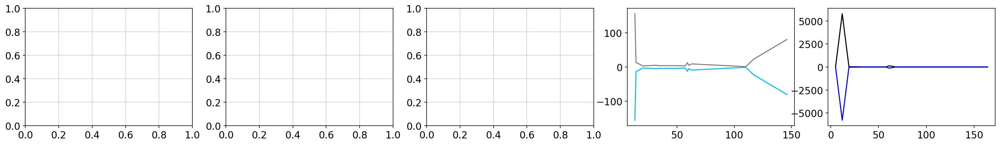

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.86      0.9  0.37


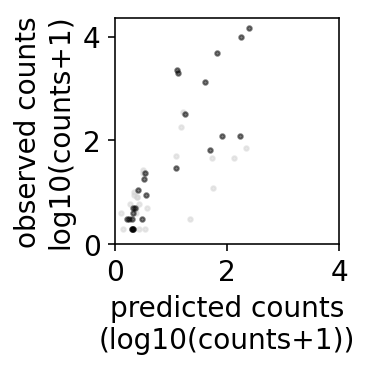

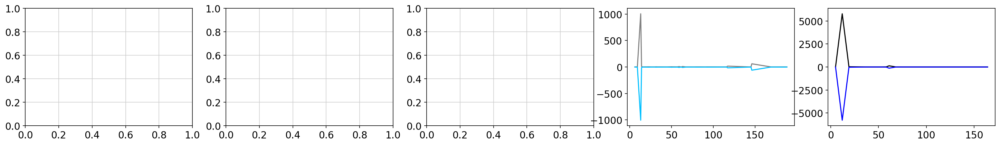

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.86      0.9  0.68


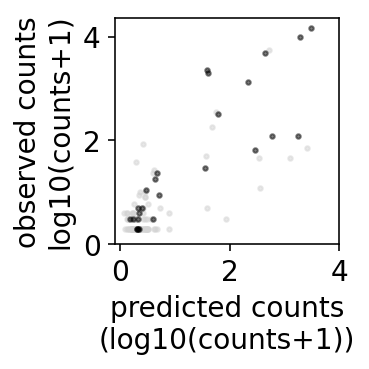

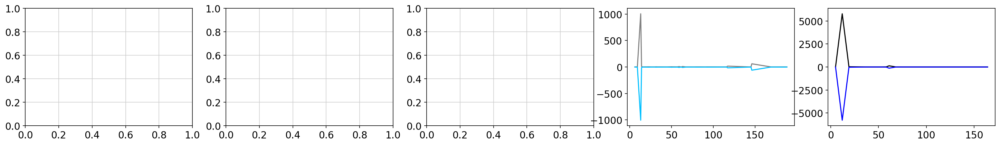

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.86      0.9  0.68


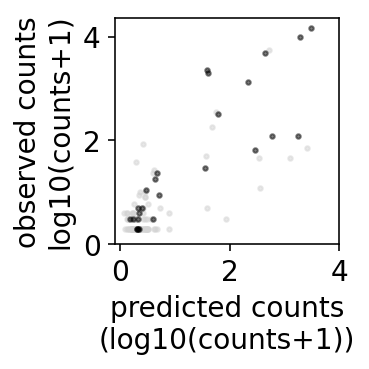

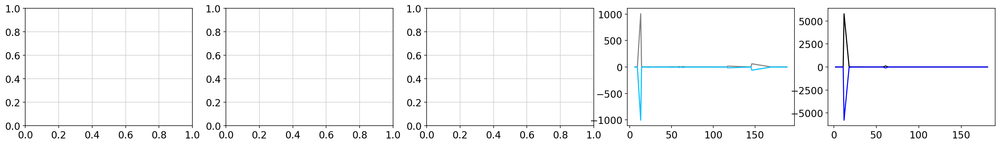

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.88     0.53  0.75


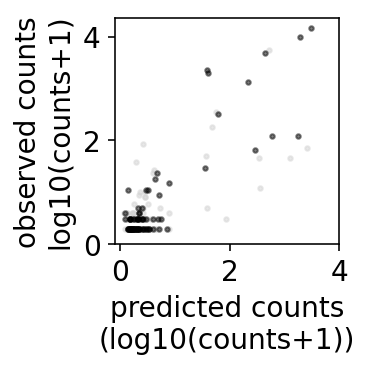

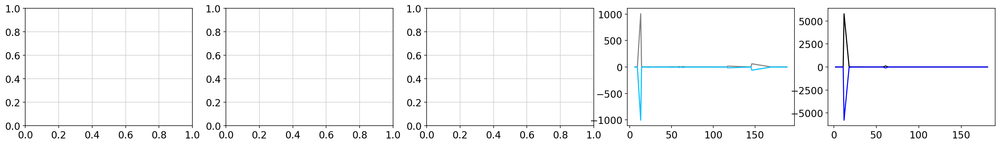

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.88     0.53  0.75


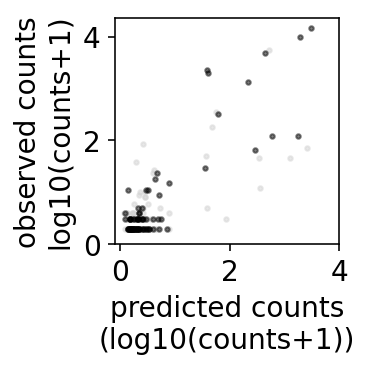

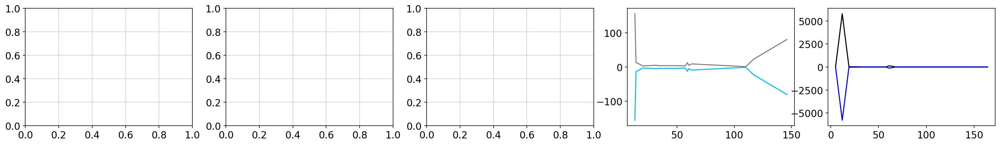

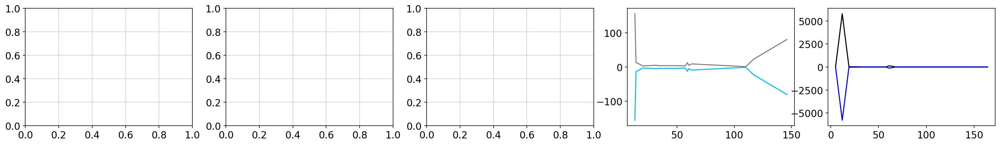

FOLD: ================ 6
train effect 30
vali effect 19
train Mutation
G12D     14489
G12V      9830
G12C      4792
G12A      2297
G12R      1354
Q61H       325
G12S      1940
Q61L       120
Q61R       122
Q61K        63
L19F        29
K117N       44
D33E         8
A59G         8
A59T        23
R68S         4
I36M         3
V14I        26
A59E         7
T20R         1
Q61P        17
T58I        10
T20M         5
T50I         4
D57N         3
K117R        2
K147N        2
L52F         1
V14L         1
G77A         1
Name: COSMIC.1, dtype: int64


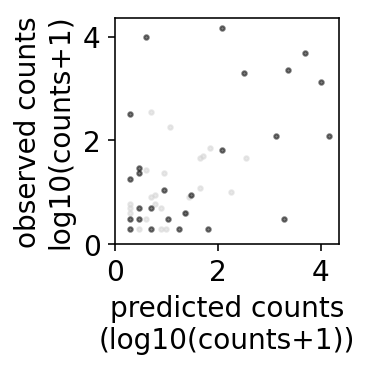

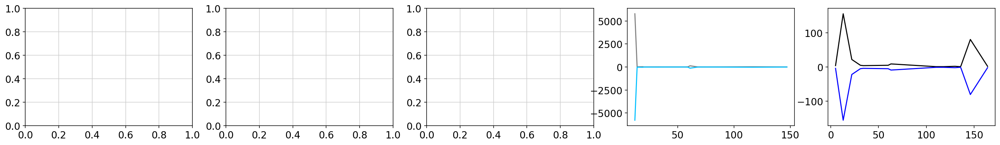

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: + | Impact score:...     0.8     0.87  -0.34


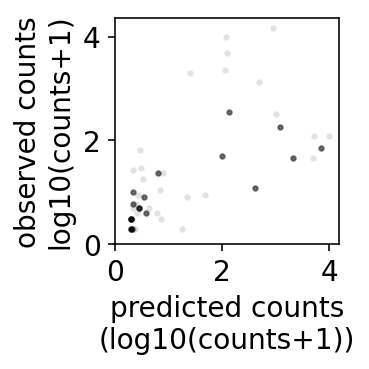

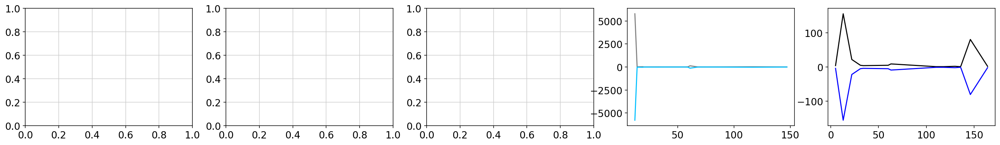

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: - | Impact score:...     0.8     0.87  -0.34


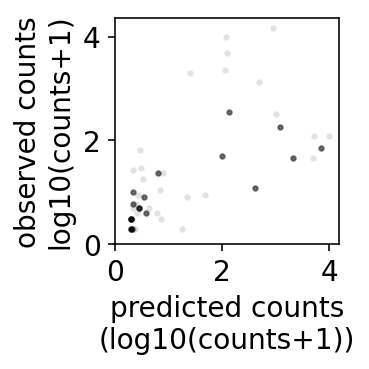

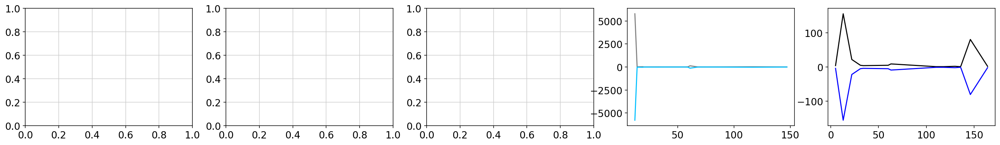

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.71     0.75  -0.71


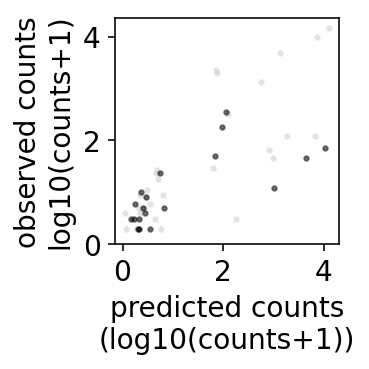

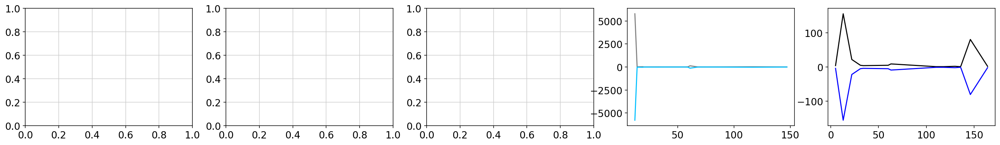

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.71     0.75  -0.71


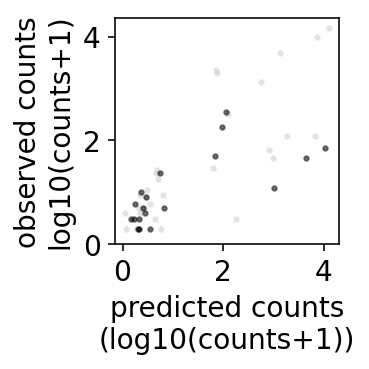

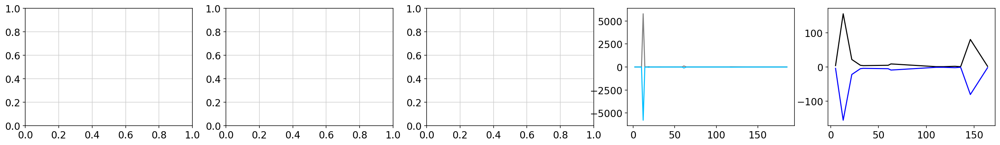

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.71     0.75  -0.71


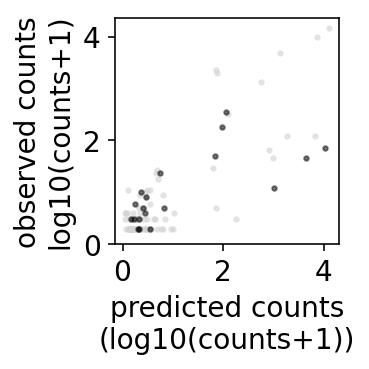

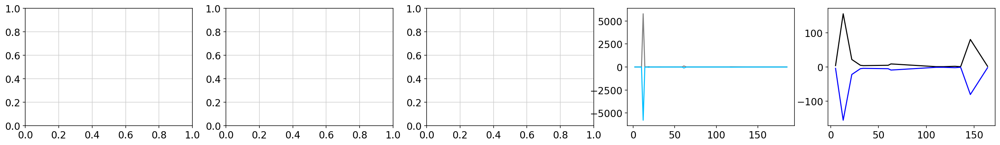

                                           condition pearson spearman     r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.71     0.75  -0.71


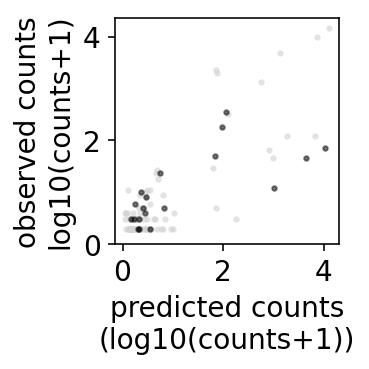

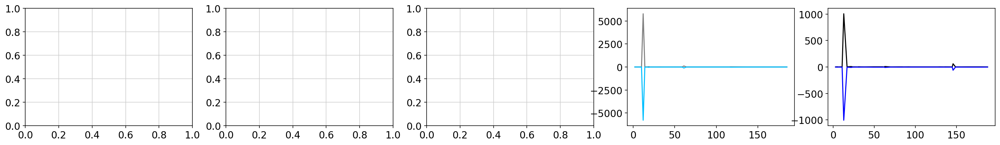

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.74     0.34  0.26


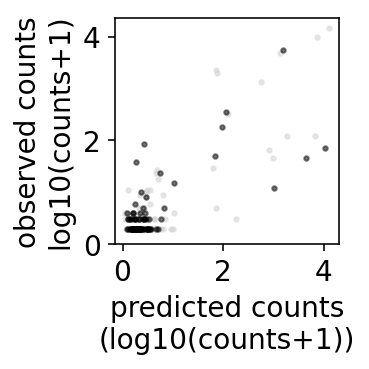

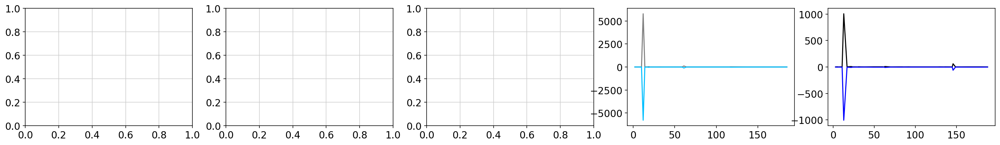

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.74     0.34  0.26


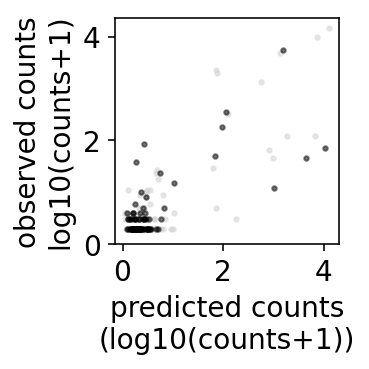

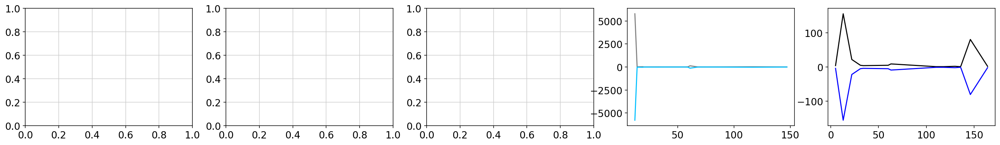

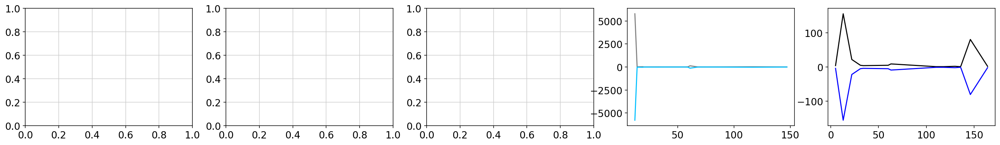

FOLD: ================ 7
train effect 31
vali effect 18
train Mutation
A146T    181
Q61H     325
G13C     355
Q61L     120
Q61R     122
Q61K      63
L19F      29
K117N     44
A146V     50
G13V      44
D33E       8
A146P     11
E63K       9
K5E        4
I36M       3
V14I      26
T20R       1
Q61P      17
P34L       4
A130V      2
G13R      69
G60D       7
T20M       5
E31K       5
D57N       3
G60V       3
K117R      2
K147N      2
S136N      2
L52F       1
V14L       1
Name: COSMIC.1, dtype: int64


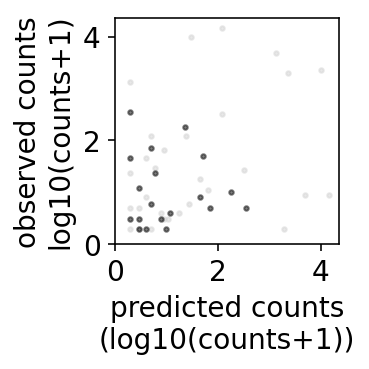

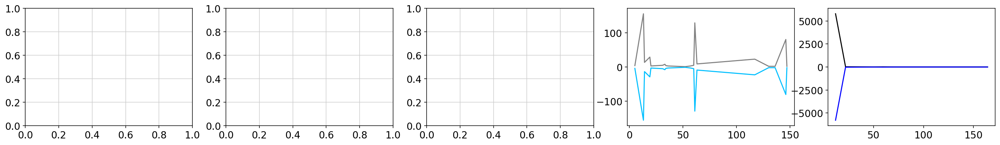

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.89     0.91  0.07


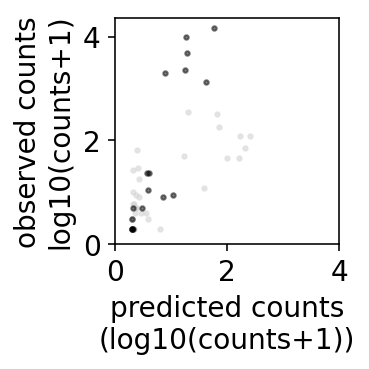

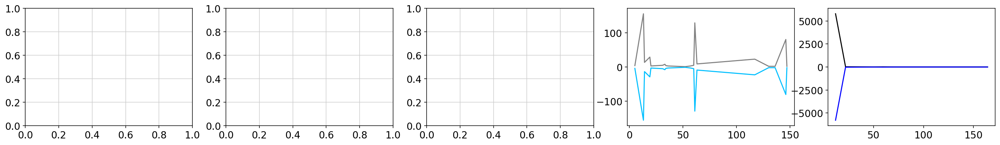

                                           condition pearson spearman    r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.89     0.91  0.07


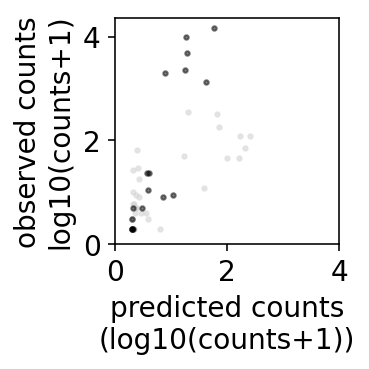

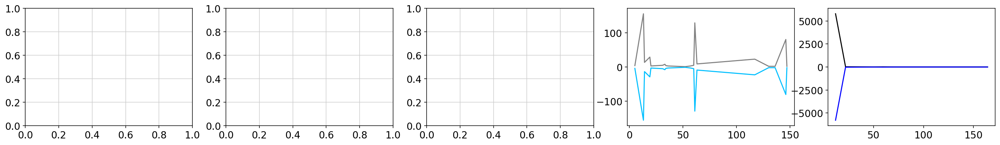

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.94     0.89  0.35


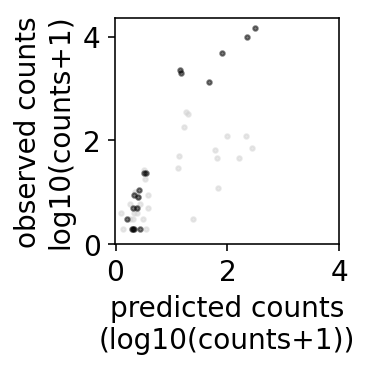

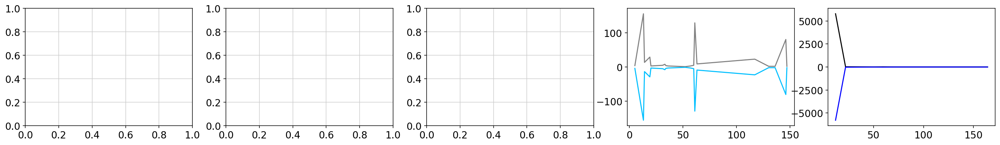

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.94     0.89  0.35


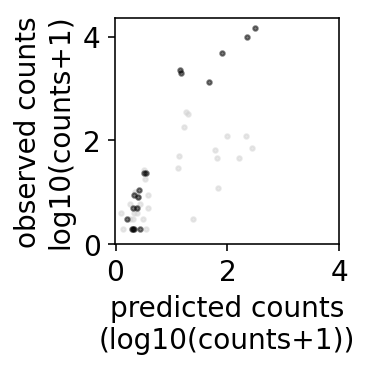

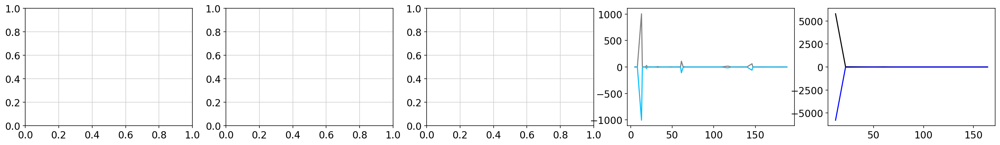

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.94     0.89  0.64


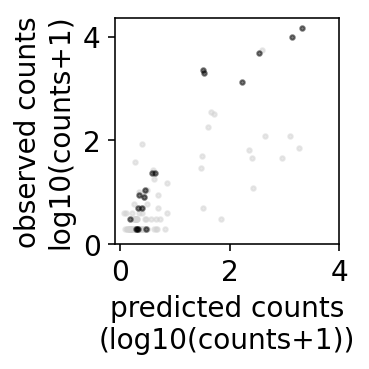

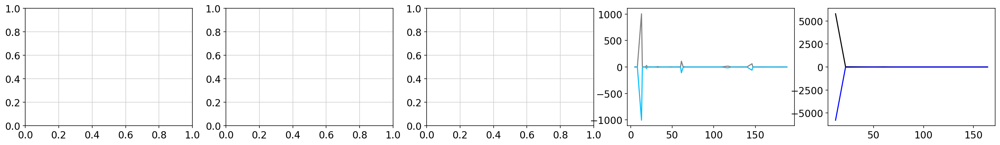

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.94     0.89  0.64


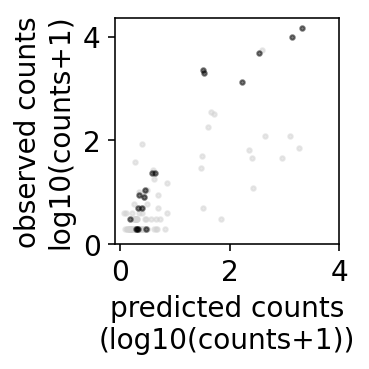

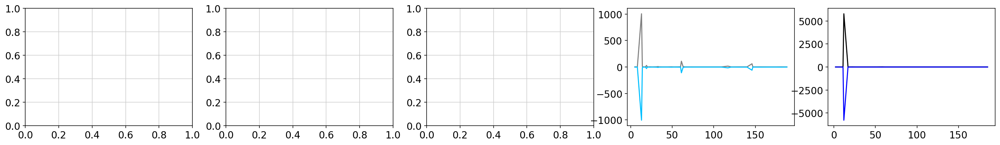

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.92      0.2  0.73


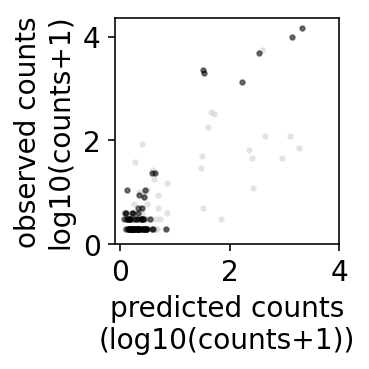

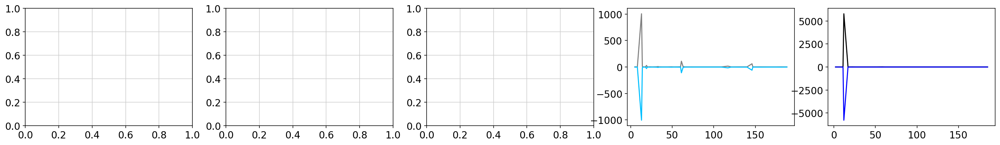

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.92      0.2  0.73


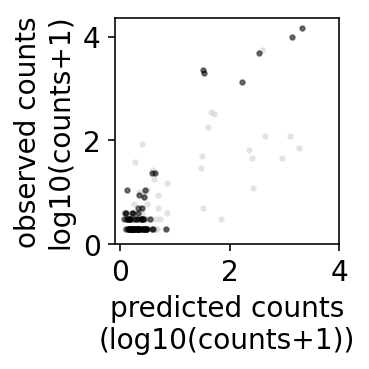

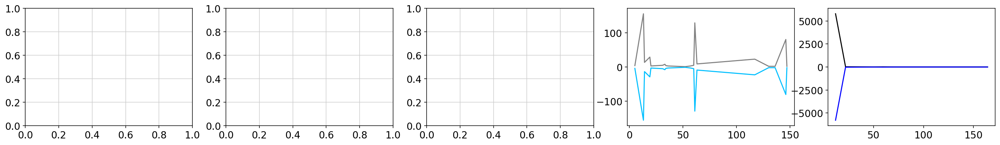

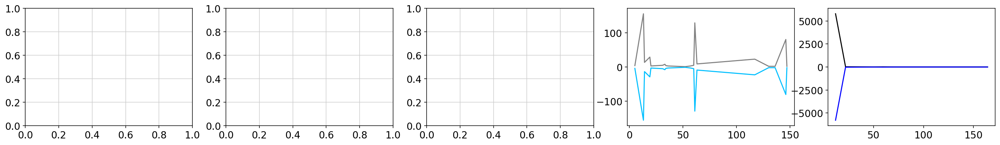

FOLD: ================ 8
train effect 27
vali effect 22
train Mutation
Q61H     325
Q61L     120
Q61R     122
Q61K      63
L19F      29
Q22K      22
A59G       8
A59T      23
K5E        4
I36M       3
C118S      1
V14I      26
A59E       7
T20R       1
Q61P      17
A130V      2
T58I      10
G60D       7
T20M       5
T50I       4
D57N       3
G60V       3
K147N      2
S136N      2
L52F       1
V14L       1
G77A       1
Name: COSMIC.1, dtype: int64


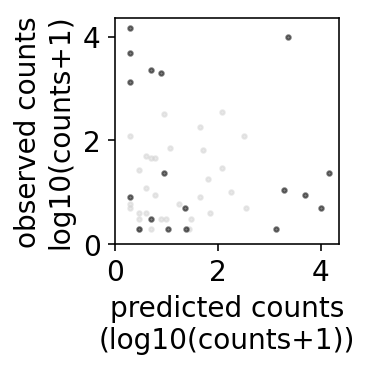

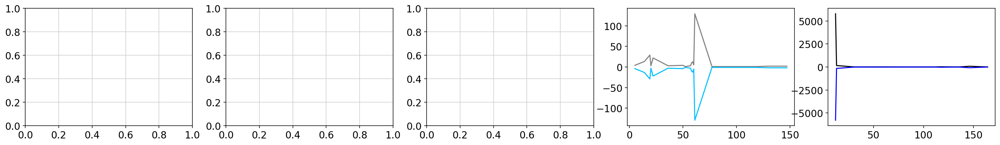

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.56     0.66  -0.01


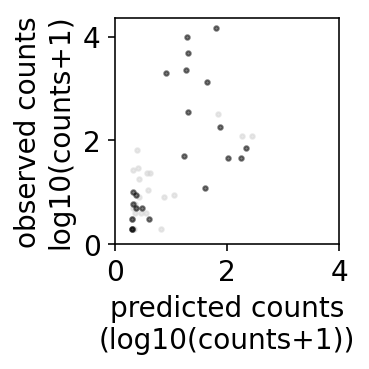

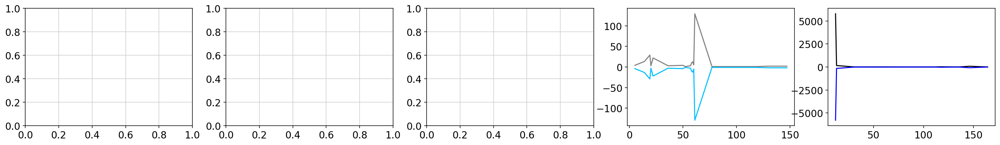

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.56     0.66  -0.01


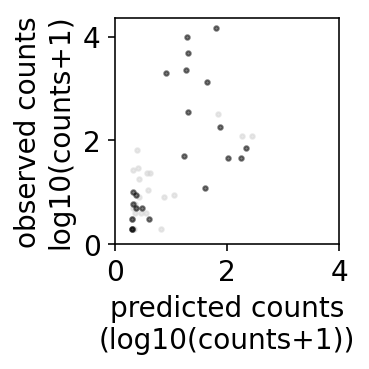

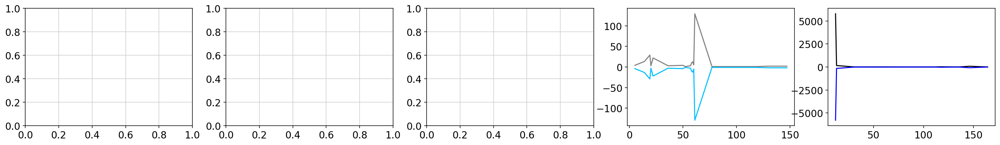

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.67     0.69  0.28


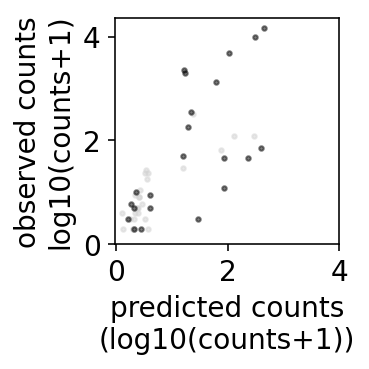

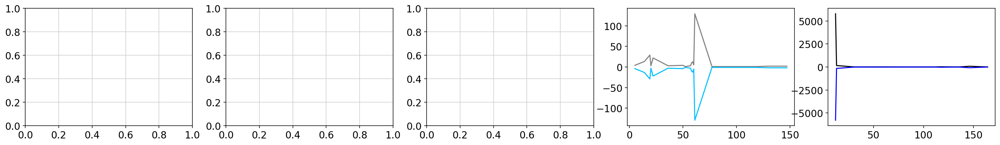

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.67     0.69  0.28


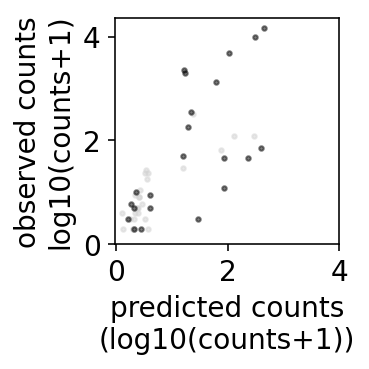

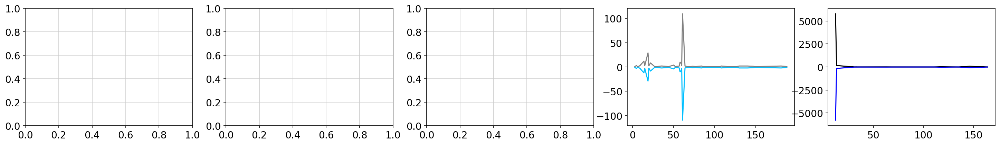

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.67     0.69  0.28


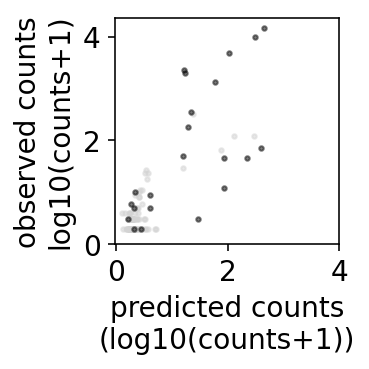

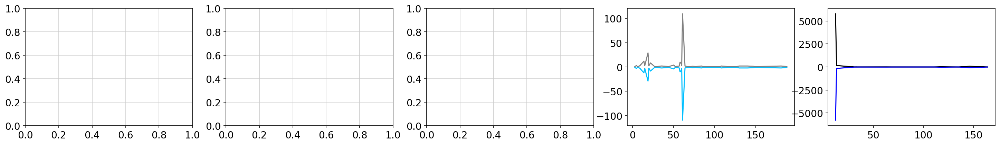

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.67     0.69  0.28


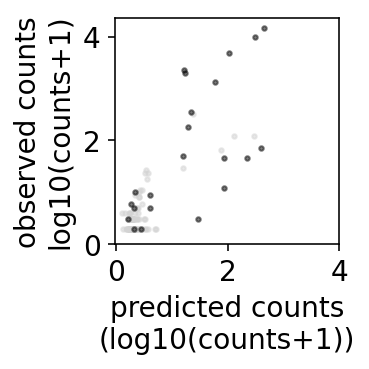

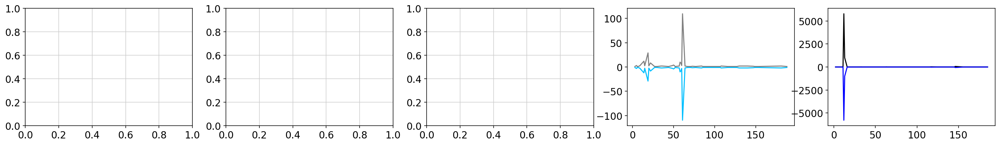

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...     0.8     0.48  0.56


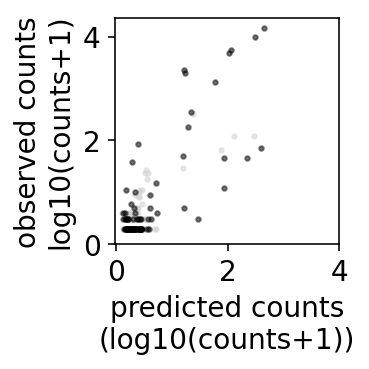

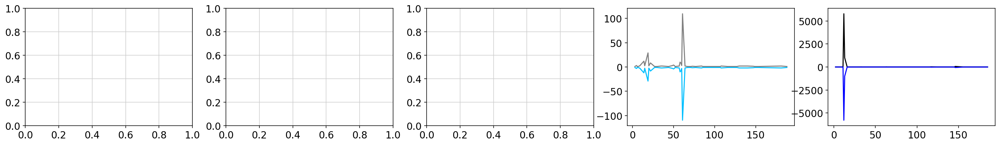

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...     0.8     0.48  0.56


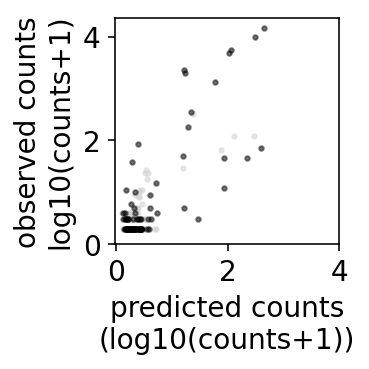

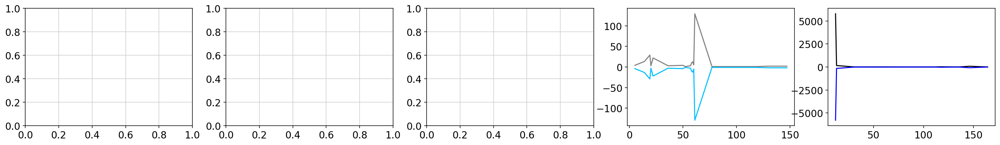

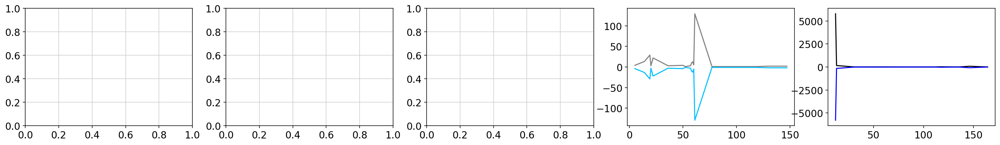

FOLD: ================ 9
train effect 25
vali effect 24
train Mutation
Q61H     325
Q61L     120
Q61R     122
Q61K      63
K117N     44
D33E       8
A59G       8
A59T      23
E63K       9
R68S       4
K5E        4
I36M       3
C118S      1
R135T      1
A59E       7
T20R       1
Q61P      17
P34L       4
T58I      10
T20M       5
E31K       5
T50I       4
K117R      2
S136N      2
L52F       1
Name: COSMIC.1, dtype: int64


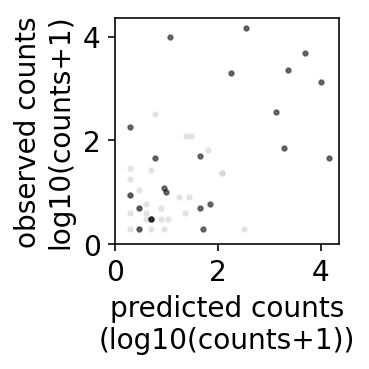

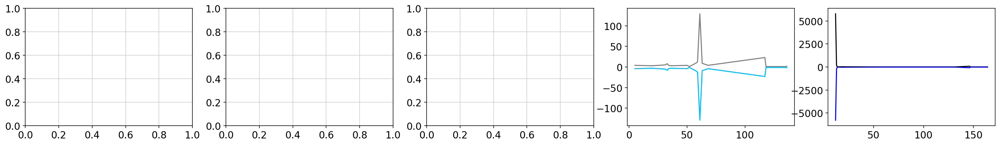

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: + | Impact score:...    0.61     0.71  -0.02


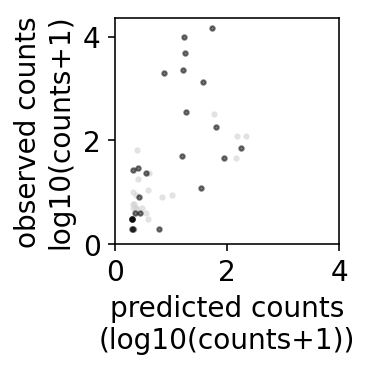

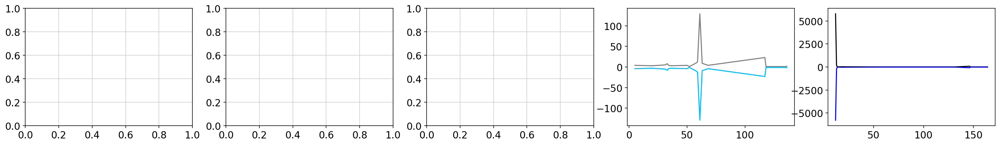

                                           condition pearson spearman     r2
0  Func. assays: - | Mut. sig.: - | Impact score:...    0.61     0.71  -0.02


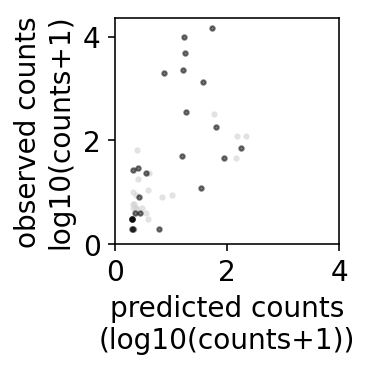

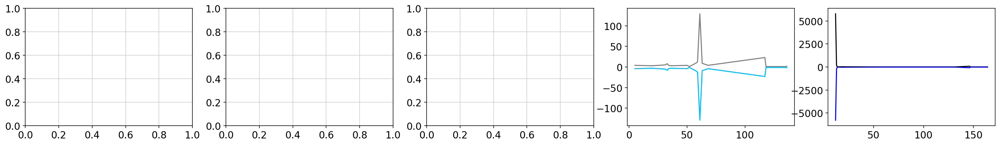

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.75     0.79  0.32


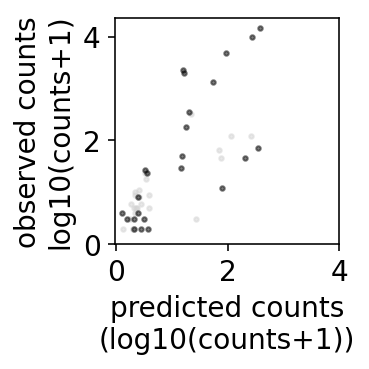

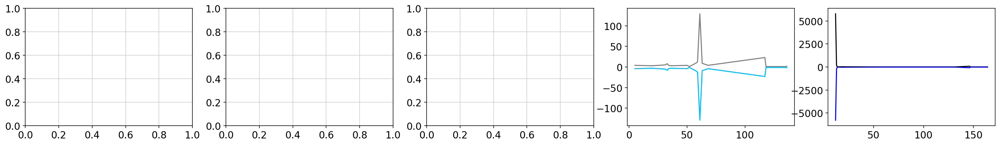

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.75     0.79  0.32


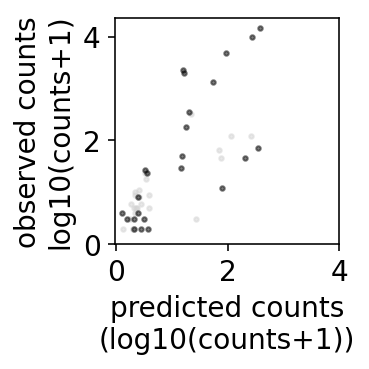

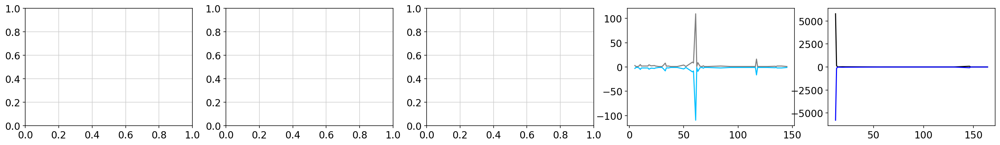

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.75     0.79  0.32


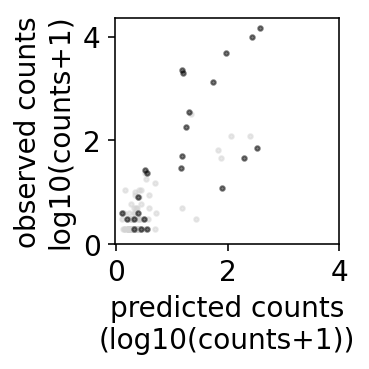

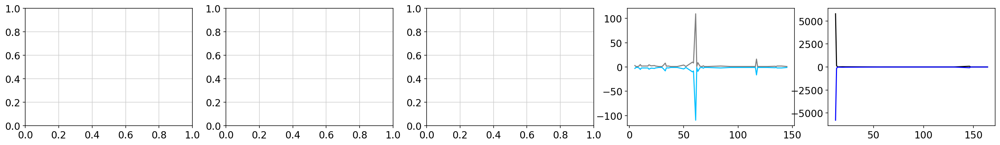

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.75     0.79  0.32


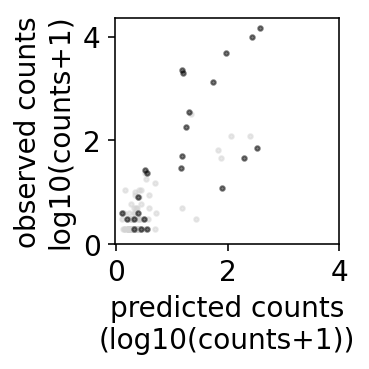

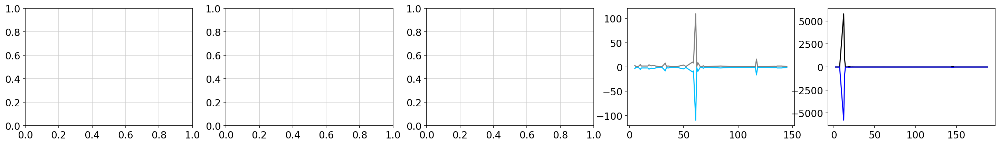

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: + | Impact score:...    0.83     0.48  0.55


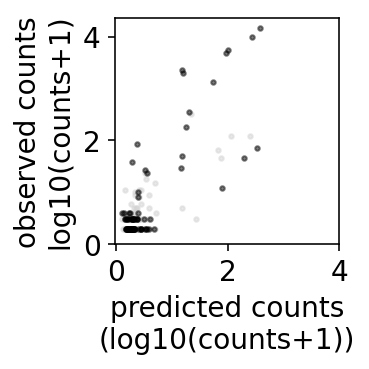

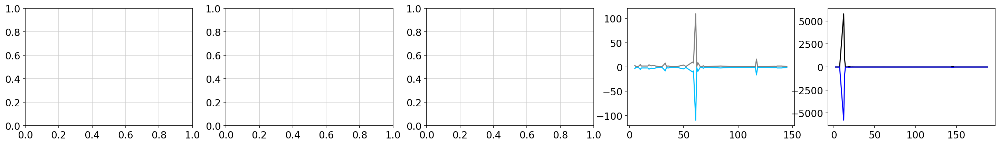

                                           condition pearson spearman    r2
0  Func. assays: + | Mut. sig.: - | Impact score:...    0.83     0.48  0.55


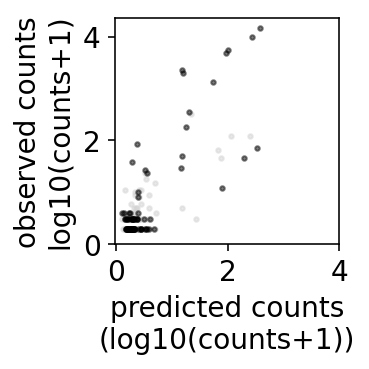

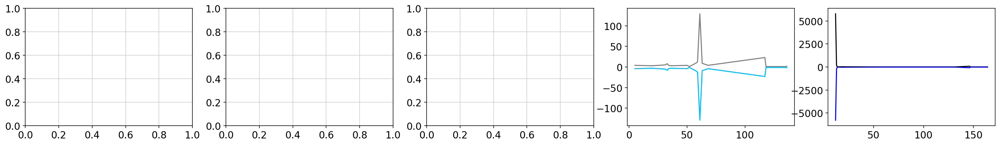

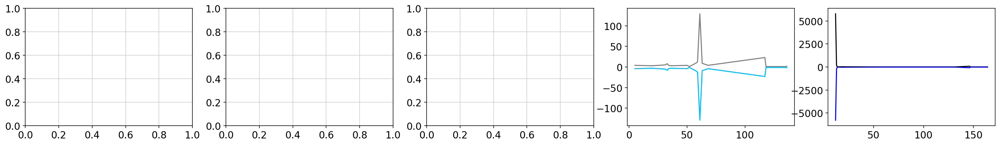

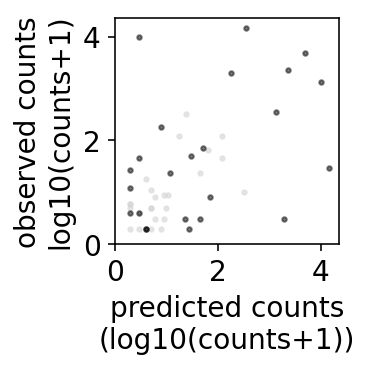

In [16]:


#record model performances here
performances=pd.DataFrame(columns=['condition','pearson','spearman','r2','fold'])


results={}

for i in range(10):
    print('FOLD: ================',i)
    #define train, validation sets
    #==============================
    #randomize train/test - by position
    foldname='fold'+str(i)
    rng=np.random.RandomState(i)
    data[foldname]=get_positions_train_valid(copy.deepcopy(data['Position']),rng)
    
    data[foldname+'not']=(data[foldname]==False)
    
    data['train'+foldname]=np.multiply(data['has_effsize'],data[foldname])
    data['valid'+foldname]=np.multiply(data['has_effsize'],data[foldname+'not'])
    print('train effect',data['train'+foldname].sum())
    print('vali effect',data['valid'+foldname].sum())
    
    print('train',data.loc[data['train'+foldname],'COSMIC.1'])
    
    
    #train each model of interest
    #============================
    model2features={}
    model2features['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=list(set(impact_cols).union(set(signature_cols)))
    model2features['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=list(impact_cols)

    model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(pheno_cols)
    
    model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=list(pheno_cols)
    
    model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=pheno_cols
    
    
    model2train={}
    model2train['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname
    model2train['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname

    model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
    model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
    
    model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=foldname
    model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=foldname
    
    model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname
    model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname
    
    model2valid={}
    model2valid['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname
    model2valid['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname

    model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
    model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
    
    model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname
    model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname
    
    model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'
    model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'
    
    model2num={}
    
    model2num['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=1
    model2num['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=2

    model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=3
    model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=4
    
    model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=5
    model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=6
    
    model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=7
    model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=8
    
    results[i]={}
    
    model_names=list(model2features.keys())
    for idx in range(len(model_names)): #['impact_train100variants']:#
        model_name=model_names[idx]
        
        features=model2features[model_name]
        performance_current_full=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                                            
                  toprint=model_name)
        print(performance_current_full[4])
        plot_performance(performance_current_full[0],'',-0.5,4)
        
        import copy
        results[i][model_name]=copy.deepcopy(performance_current_full)
        
        performance_current=performance_current_full[4]
        performance_current['fold']=foldname
        performances=pd.concat([performances,performance_current],axis=0)
        
        
        
    import copy
    import random
    model_name='Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var '
    features=model2features[model_name]
    out=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                  toprint=model_name)
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)


    
    for item in ['train','valid','all']:
        idx=list(out[0]['obs_'+item].index)
        stuff=copy.deepcopy(list(out[0]['obs_'+item]))
        #shuffle
        rng=np.random.RandomState(1234)
        stuff=rng.choice(stuff,size=len(stuff),replace=False)
        out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)[0]
    results[i]['shuffled']=copy.deepcopy(out)
    y_pred=np.array(out[0]['pred_valid']).flatten()
    y=out[0]['obs_valid']
    
    plot_performance(out[0],'',-0.5,4)
    
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y,y_pred)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y,y_pred)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y,y_pred)[0]
    sp=str(int(100*sp)/100)
    performances_shuffled=pd.DataFrame({'condition':['shuffled'],
                                       'pearson':p,
                                       'spearman':sp,
                                       'r2':r2,
                                       'fold':[foldname]})
    performances=pd.concat([performances,performances_shuffled],axis=0)

In [17]:
def get_pred_by_position(y_here,data_with_position):
    df=pd.DataFrame(y_here,index=y_here.index)
    df['posi']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('posi').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)


    
def avg_by_position(named_scores,data_with_position):
    
    df=pd.DataFrame(named_scores,index=named_scores.index)
    df['position']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('position').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)

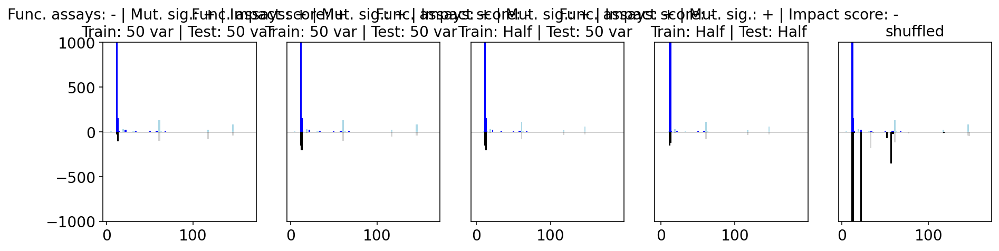

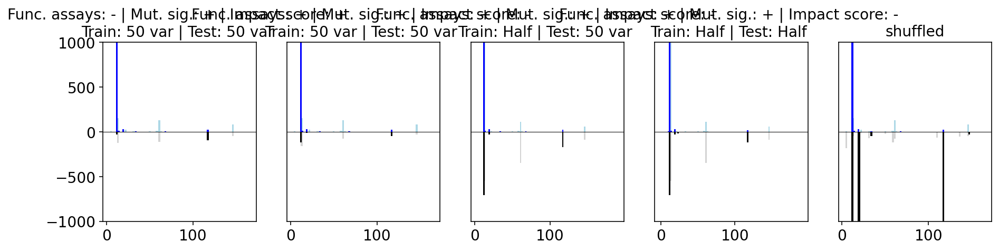

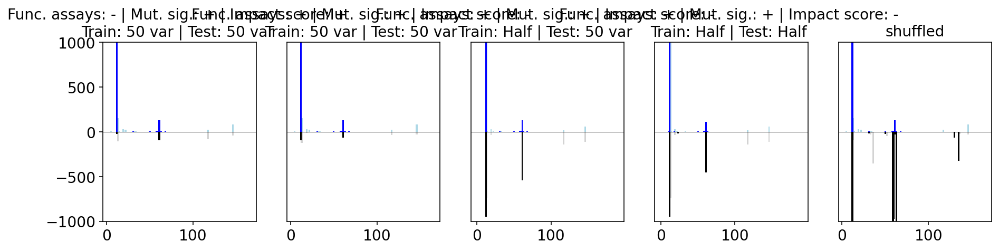

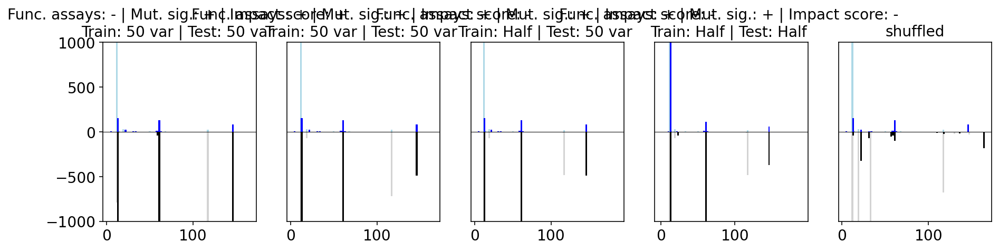

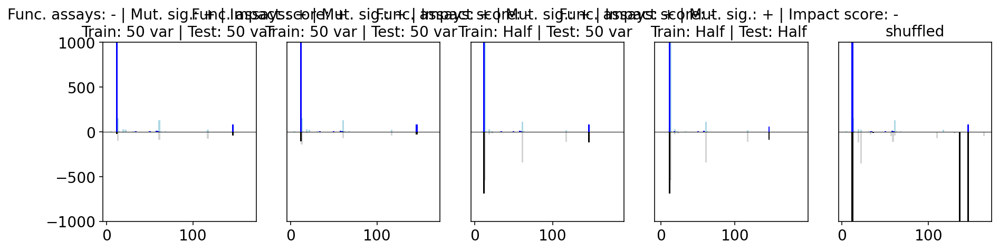

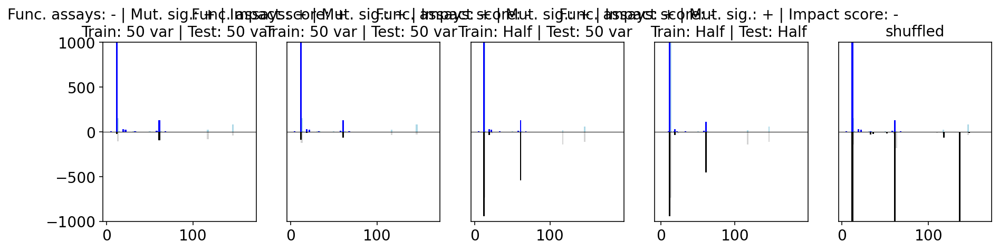

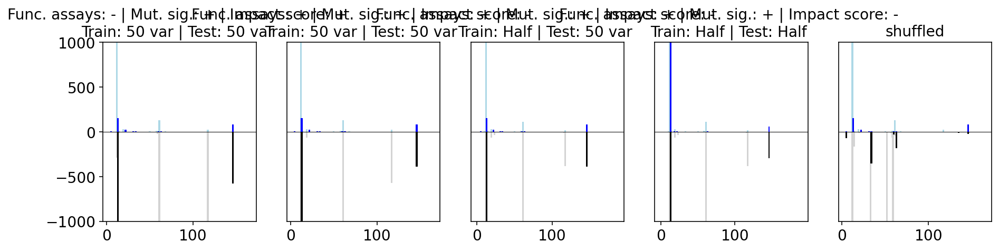

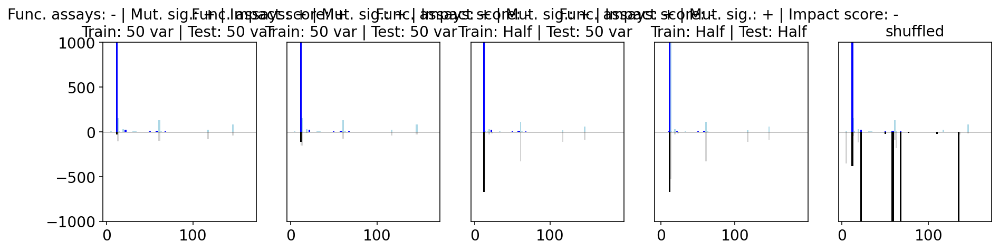

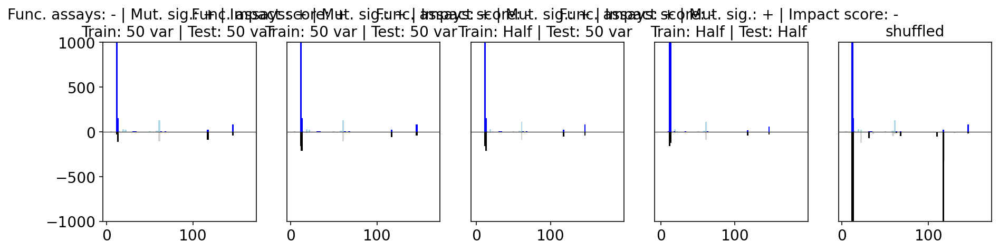

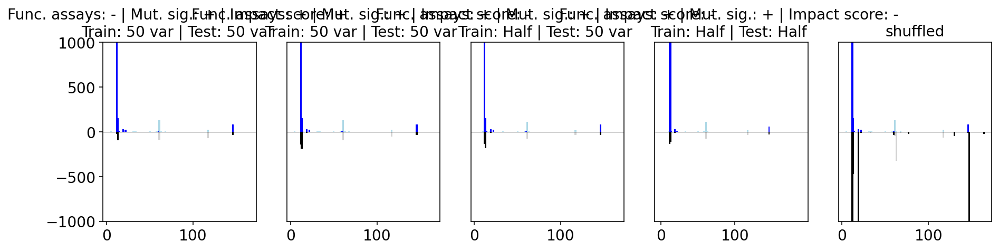

In [18]:
def plot_pos_pred(pred_train,obs_train,pred_valid,obs_valid,data_with_position,ax):
    
    pred_train_pos=avg_by_position(pred_train,data_with_position)
    obs_train_pos=avg_by_position(obs_train,data_with_position)
    pred_valid_pos=avg_by_position(pred_valid,data_with_position)
    obs_valid_pos=avg_by_position(obs_valid,data_with_position)
    
    lw=2
    ax.bar(pred_train_pos.loc[:,'pos'],
           -pred_train_pos.iloc[:,0],color='lightgray',width=lw)
    ax.bar(obs_train_pos.loc[:,'pos'],
           obs_train_pos.iloc[:,0],color='lightblue',width=lw)
    ax.bar(pred_valid_pos.loc[:,'pos'],
           -pred_valid_pos.iloc[:,0],color='black',width=lw)
    ax.bar(obs_valid_pos.loc[:,'pos'],
           obs_valid_pos.iloc[:,0],color='blue',width=lw)
    ax.grid(False)
    ax.axhline(y=0,color='black',linewidth=0.5)


myorder=['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'shuffled'
    
]

for i in range(10):
    fig_pos,plots_pos=plt.subplots(1,len(myorder))
    x=3
    fig_pos.set_size_inches(len(myorder)*x,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        plot_pos_pred(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                  data,
                    plots_pos[idx])
        if idx!=0:
            plots_pos[idx].set_yticks([])
        plots_pos[idx].set_title(model_name)
        plots_pos[idx].set_ylim(-1000,1000)

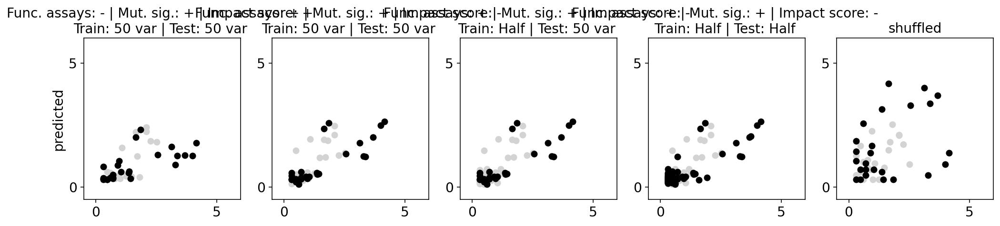

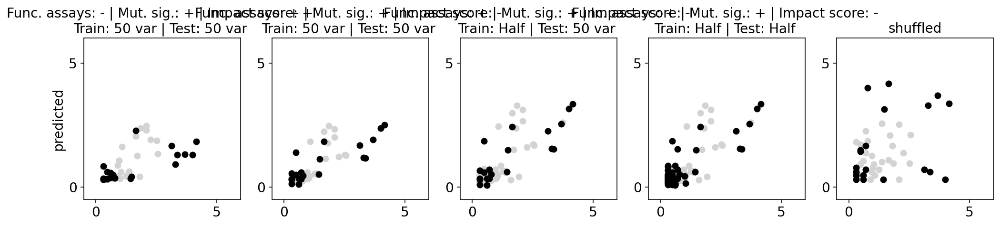

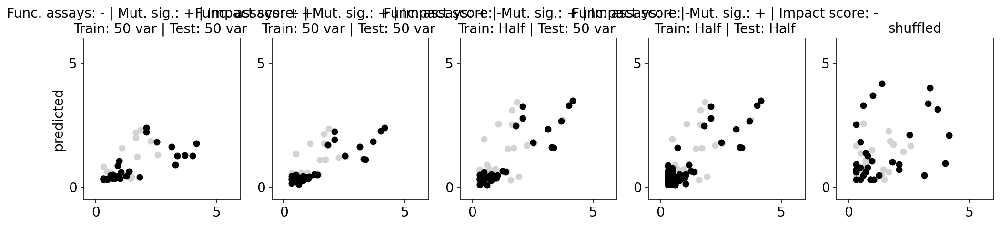

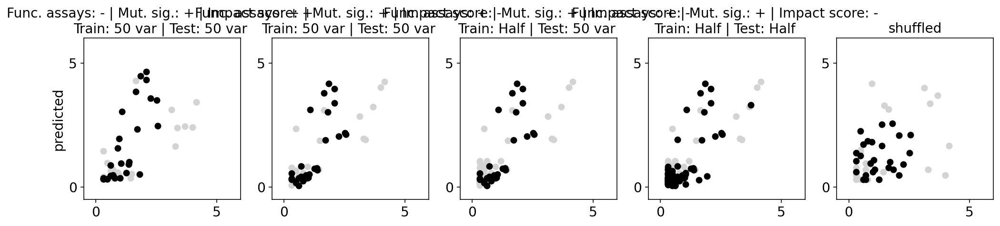

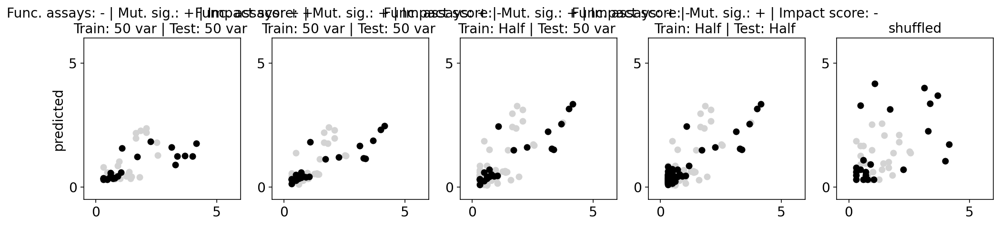

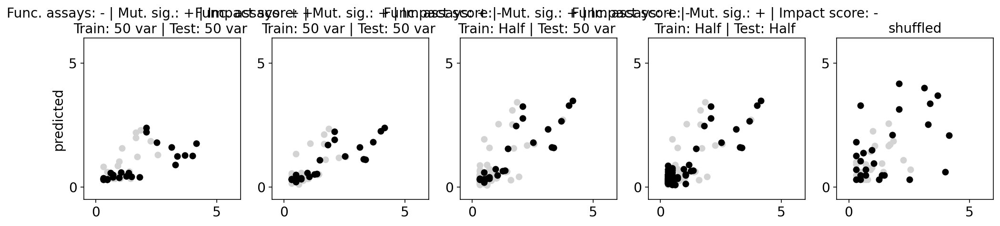

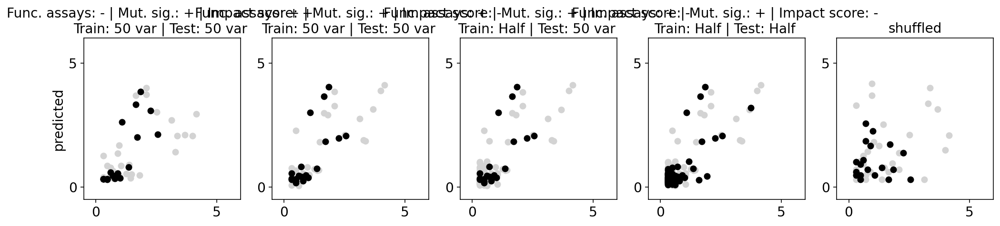

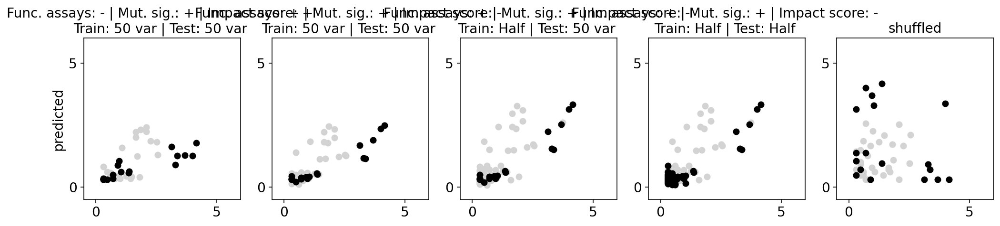

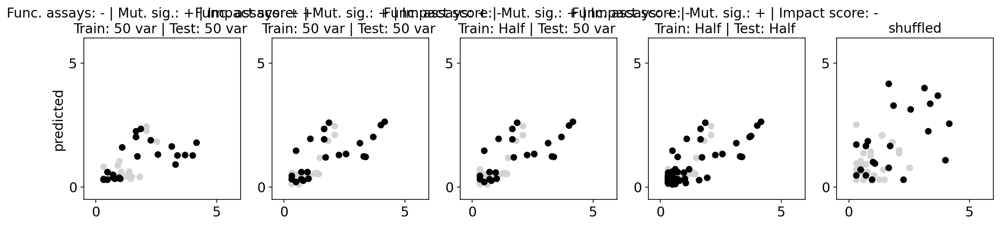

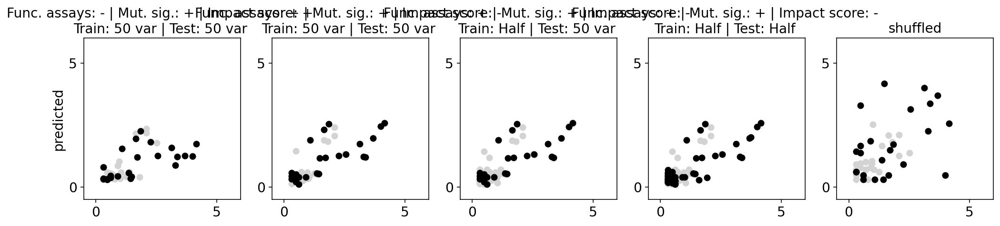

In [19]:
def scatter_pred_obs(pred_train,obs_train,pred_valid,obs_valid,ax,log_it=False):
    
    if not log_it:
        ax.scatter(obs_train,pred_train,color='lightgray')
        ax.scatter(obs_valid,pred_valid,color='black')
    if log_it:
        
        ax.scatter(np.log10(obs_train+1),np.log10(pred_train+1),color='lightgray')
        ax.scatter(np.log10(obs_valid+1),np.log10(pred_valid+1),color='black')

    

for i in range(10):
    fig_scatter,plots_scatter=plt.subplots(1,len(myorder))
    x=3
    fig_scatter.set_size_inches(len(myorder)*x+2,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        scatter_pred_obs(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                    plots_scatter[idx],log_it=True)
        if idx!=0:
            plots_scatter[idx].set_yticks([])
        plots_scatter[idx].set_title(model_name)
        plots_scatter[idx].grid(False)
        if idx==0:
            plots_scatter[idx].set_ylabel('predicted')
        
        plots_scatter[idx].set_ylim(-0.5,6)
        plots_scatter[idx].set_xlim(-0.5,6)
        plots_scatter[idx].set_xticks([0,5])
        plots_scatter[idx].set_yticks([0,5])
        

In [20]:
performances['spearman']=pd.DataFrame(performances['spearman'],dtype=float)
performances['pearson']=pd.DataFrame(performances['pearson'],dtype=float)
performances['r2']=pd.DataFrame(performances['r2'],dtype=float)
grouped_performances=performances.groupby('condition').median()
grouped_performances['condition']=list(grouped_performances.index)
grouped_performances.index=range(grouped_performances.shape[0])
pd.set_option('display.max_colwidth', 100)
print(grouped_performances)

   pearson  spearman     r2  \
0    0.825     0.805  0.360   
1    0.825     0.805  0.510   
2    0.840     0.460  0.625   
3    0.825     0.805  0.360   
4    0.825     0.805  0.510   
5    0.840     0.460  0.625   
6    0.720     0.835  0.075   
7    0.720     0.835  0.075   
8   -0.015     0.340 -1.035   

                                                                          condition  
0  Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var   
1    Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var   
2      Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half   
3  Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var   
4    Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var   
5      Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half   
6  Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var   
7

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: - | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=0.000e+00
Func. assays: + | Mut. sig.: - | Impact score: - 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=1.097e+00
Func. assays: + | Mut. sig.: + | Impact score: - 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=1.097e+00
Func. assays: + | Mut. sig.: - | Impact score: - 
Train: Half | Test: 50 var  v.

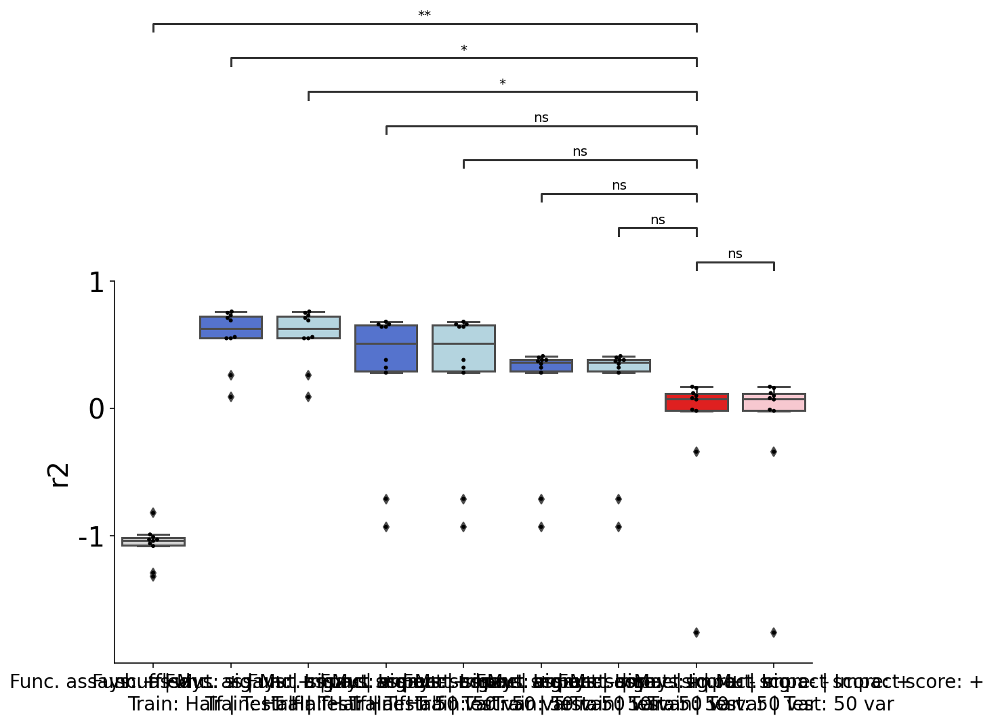

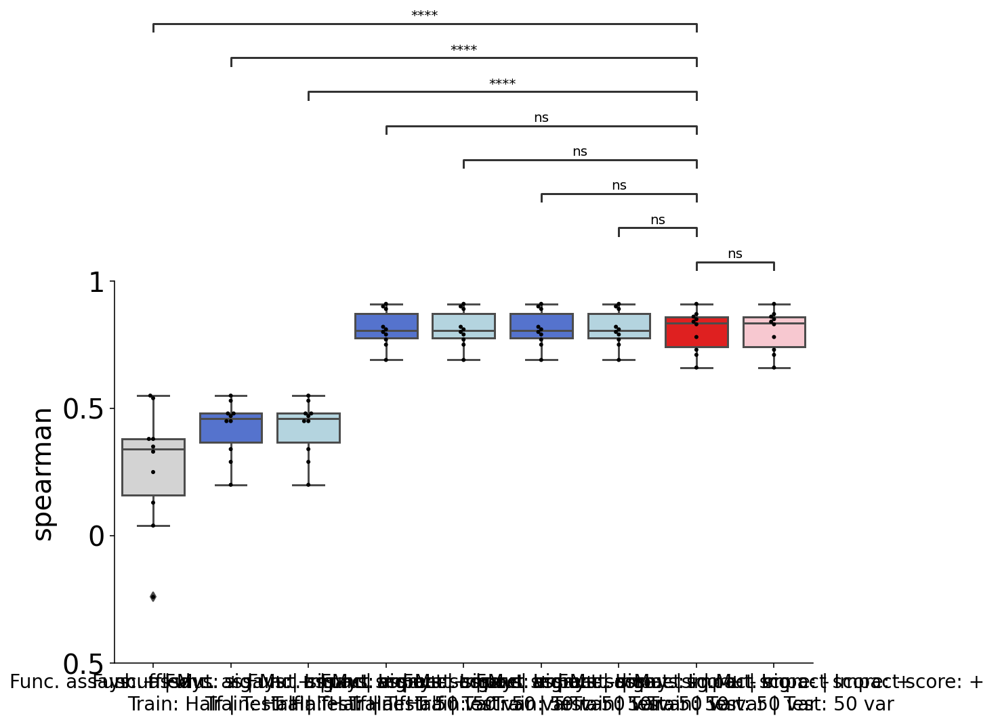

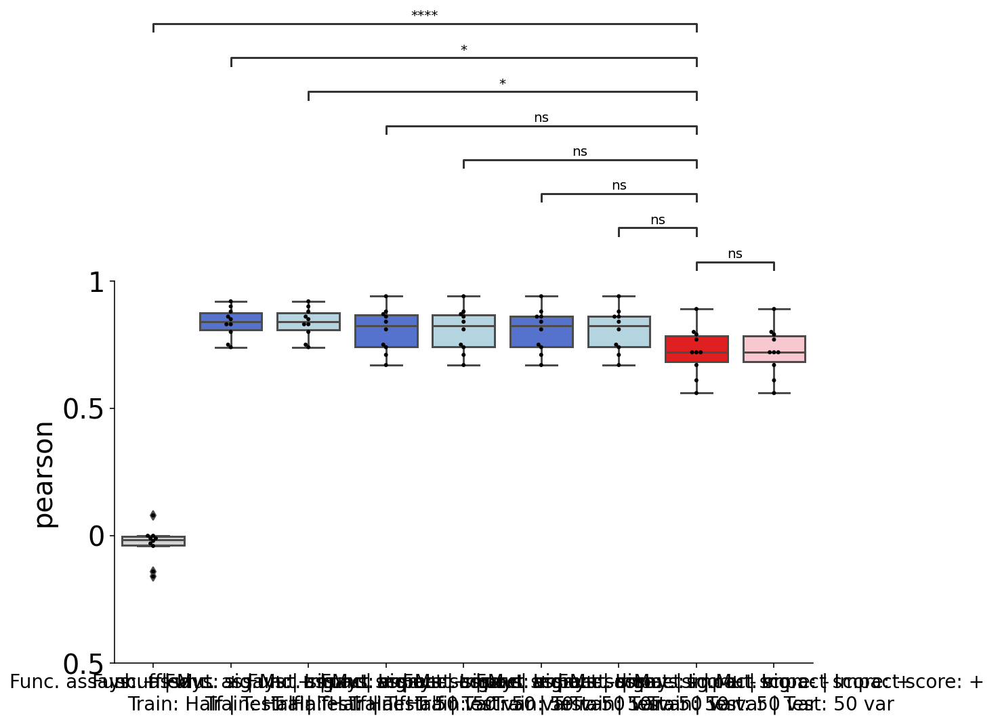

In [21]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['shuffled','Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']
#myorder=myorder[::-1]

pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in color_dict:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: + | Mut. sig.: + | Impact score: - 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.097e+00
Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: + | Mut. sig.: + | Impact score: - 
Train: Half | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=5.681e-01 stat=-1.536e+00
Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: + | Mut. sig.: + | Impact score: - 
Train: Half | Test: Half : t-test independent samples with Bonferroni correction, P_val=8.901e-03 stat=-3.563e+00
Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.

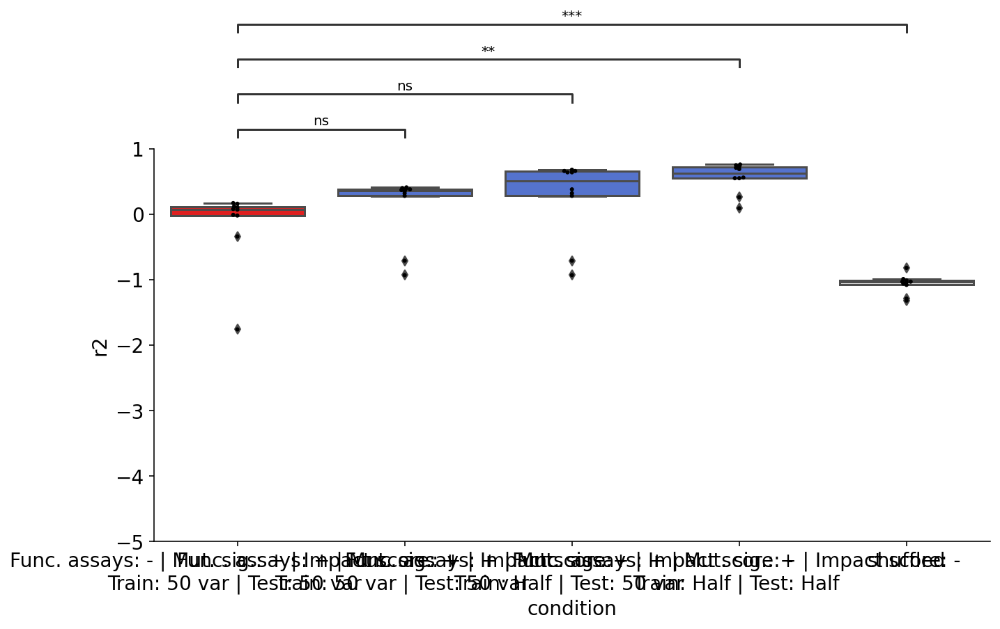

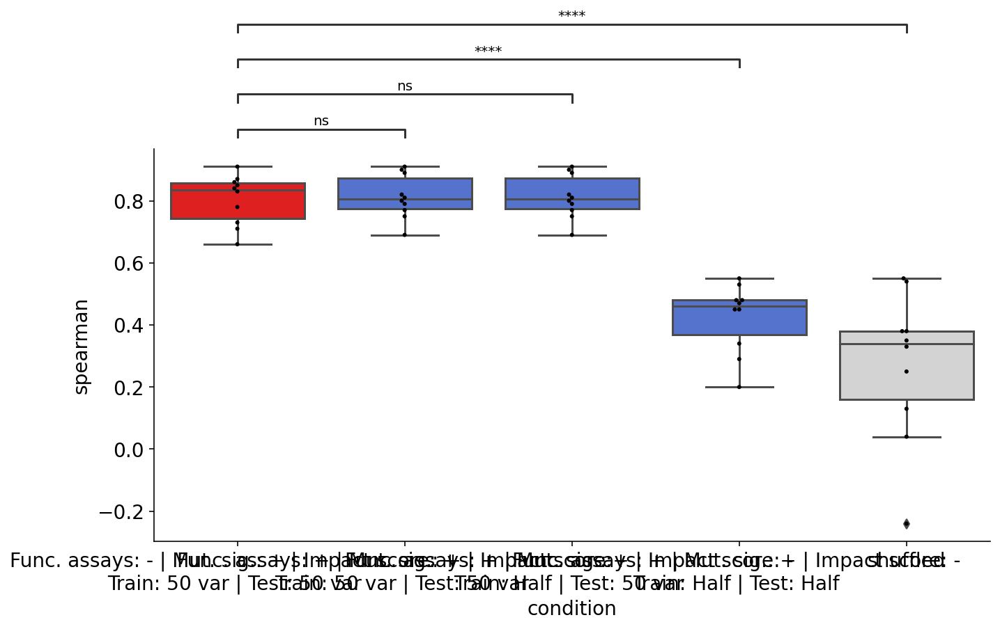

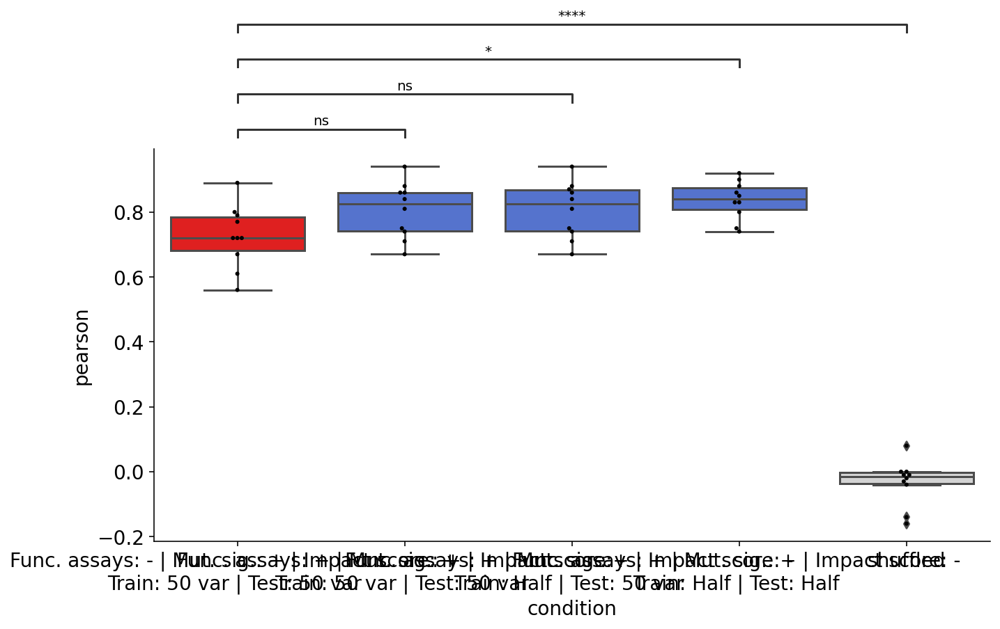

In [22]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'shuffled'
    
]


pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    if item=='r2':
        ax1.set_ylim(-5,1)
        print('')
        
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)
    

In [ ]:
performances['spearman']=pd.DataFrame(performances['spearman'],dtype=float)
performances['pearson']=pd.DataFrame(performances['pearson'],dtype=float)
performances['r2']=pd.DataFrame(performances['r2'],dtype=float)
grouped_performances=performances.groupby('condition').median()
grouped_performances['condition']=list(grouped_performances.index)
grouped_performances.index=range(grouped_performances.shape[0])
pd.set_option('display.max_colwidth', 100)
print(grouped_performances)

In [ ]:
myorder=['shuffled',
         'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']

color_dict={}
for entry in myorder:
    color_dict[entry]='lightgray'
    

for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=10, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([0.5,0,0.5,1],fontsize=20)
    g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)


In [ ]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['shuffled','Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']
#myorder=myorder[::-1]

pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in color_dict:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)

In [ ]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
            'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'shuffled'
    
]


pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='Mann-Whitney', text_format='star',
                                   loc='outside', verbose=2)
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)

In [ ]:
def model_performance_no_plot(x,y,model_res,toprint,ax,mycolor):
    #should return the predictions
    y_pred=model_res.predict(x)
    y2=np.log10(y+1)
    y_pred2=np.log10(y_pred+1)
    y_pred2[np.isnan(y_pred2)]=-1
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y2,y_pred2)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y2,y_pred2)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y2,y_pred2)[0]
    sp=str(int(100*sp)/100)
    

    
    return(y_pred,p,sp,r2,y_pred)

def model_full(data_here,
               features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col=None,
              toprint=''):
    
    import copy
    
    fig,plots=plt.subplots(1,5)
    fig.set_size_inches(25,3)
    
    
    d_here={}
    
    #setup dataset, training, test
    d_here['data']=get_train_valid_datasets(data_here,
                features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col)
    
    #train the model
    d_here['model']=get_model(d_here['data'])
    
    #get the model performance, for the training and validation sets
    d_here['pred_train'],p_train,sp_train,r2_train,y_train_pred=model_performance(d_here['data']['x_train'],
                                     d_here['data']['y_train'],
                                     d_here['model'],
                                   'training',
                                    plots[0],'lightblue')
    
    d_here['pred_valid'],p_valid,sp_valid,r2_valid,y_valid_pred=model_performance(d_here['data']['x_valid'],
                                     d_here['data']['y_valid'],
                                     d_here['model'],
                                   toprint+'\ntrain: '+str(d_here['data']['x_train'].shape[0])+
                                            ', test: '+str(d_here['data']['x_valid'].shape[0])+'\nvalidation',
                                    plots[1],'blue')
    
    #make a prediction with the model on the entire dataset
    data_here_cp=copy.deepcopy(data_here)
    data_here_cp['all']=True
    totals={}
    totals['data']=get_train_valid_datasets(data_here_cp,
                features,
                'all','all',
                training_y_name,valid_y_name,
                offset_col)
    data_here_cp[toprint],p_total,sp_total,r2_total,y_total_pred=model_performance(totals['data']['x_valid'],
                                     totals['data']['y_valid'],
                                     d_here['model'],
                                   'all data',
                                    plots[2],'purple')
    
    model_performance_by_position(d_here['data']['y_train'],
                                  d_here['data']['y_valid'],
                                  y_train_pred,
                                  y_valid_pred,
                                  data_here,
                                  plots[3],plots[4])
    
    performance_here=pd.DataFrame({'condition':toprint,
                                  'pearson':p_valid,
                                  'spearman':sp_valid,
                                  'r2':r2_valid},index=[0])
    plt.show()
    
    to_return={}
    to_return['dataset']=data_here_cp
    to_return['model']=d_here['model']
    to_return['obs_train']=d_here['data']['y_train']
    to_return['obs_valid']=d_here['data']['y_valid']
    to_return['pred_train']=d_here['pred_train']
    to_return['pred_valid']=d_here['pred_valid']
    to_return['obs_all']=totals['data']['y_valid']
    to_return['pred_all']=data_here_cp[toprint]
    return(to_return,p_valid,sp_valid,r2_valid,performance_here)




















#the compared predictions

#===================================================================================

#we'll split into train/test here by using positions below/above 200

#define train, validation sets
#==============================
i=0
foldname='fold'+str(i)
data[foldname]=copy.deepcopy(data['Position'])<=95
data[foldname+'not']=(data[foldname]==False)
    
data['train'+foldname]=np.multiply(data['has_effsize'],data[foldname])
data['valid'+foldname]=np.multiply(data['has_effsize'],data[foldname+'not'])
    
model2features={}
model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=pheno_cols

model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=list(set(pheno_cols).union(set([])))

model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(pheno_cols).union(set([])))

model2features['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(['A549_p53WT_Nutlin-3_Z-score']).union(set(signature_cols)))
model2features['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=['A549_p53WT_Nutlin-3_Z-score']

model2features['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=list(set(impact_cols).union(set(signature_cols)))
model2features['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=impact_cols



model2train={}
model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname

model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=foldname

model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname

model2train['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname

model2train['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname


model2valid={}

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname


model2num={}
model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=1
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=2

model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=3
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=4

model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=5
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=6

model2num['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=7
model2num['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=8

model2num['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=9
model2num['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=10

def plot_performance(preds,titlename='',mini=-0.5,maxi=5):
    fig,ax=plt.subplots(1)
    fig.set_size_inches(2,2)
    
    for item in ['train','valid']:
        if item=='train':
            c='black'
        if item=='valid':
            c='blue'
        ax.scatter(np.log10(preds['pred_'+item]+1),
            np.log10(preds['obs_'+item].loc[preds['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        ax.set_xlim(mini,maxi)
        ax.set_ylim(mini,maxi)        
        ax.set_xticks([])
        
        ax.set_yticks([0,maxi/2,maxi])
        ax.set_ylabel('observed counts\n(log10(counts+1))')
        ax.set_ylabel('')
        ax.grid(False)
        
    ax.set_xticks([0,maxi/2,maxi])
    ax.set_xlabel('predicted counts\n(log10(counts+1))')
    ax.set_title(titlename)
    ax.set_ylabel('observed counts\nlog10(counts+1)')
    return(ax)


preds=copy.deepcopy(data)                      
for model_name in myorder:#model2features.keys(): 
    if model_name=='shuffled':
        continue

    features=model2features[model_name]
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)
    preds[model_name]=out[0]['dataset'].loc[preds.index,model_name]

    plot_performance(out[0],'',-0.5,4)
    plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.png',bbox_inches = "tight")
    plt.show()
    
#and the shuffled model
import copy
import random
model_name='Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var '
features=model2features[model_name]
out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)

for item in ['train','valid','all']:
    idx=list(out[0]['obs_'+item].index)
    stuff=copy.deepcopy(list(out[0]['obs_'+item]))
    print(stuff[:3])
    random.shuffle(stuff)
    out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)
    print(out[0]['pred_'+item].head())
    
plot_performance(out[0],'shuffled',-0.5,4)
plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(11)+'.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(11)+'.png',bbox_inches = "tight")
plt.show()




In [ ]:
pairs=[]
comparison='Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)
    

In [ ]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
            'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['shuffled','Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']
#myorder=myorder[::-1]

pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in color_dict:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)
    '''
    if item=='r2':
        g.ax.set_xlim(-2,1)
        g.ax.set_xticks([-1,0,1])
        g.ax.set_xticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_xlim(-0.5,1)
        g.ax.set_xticks([-0.5,0,0.5,1])
        g.ax.set_xticklabels([0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_ylabel('')
    g.ax.set_xlabel(item,fontsize=20)
    '''

In [ ]:
?add_stat_annotation